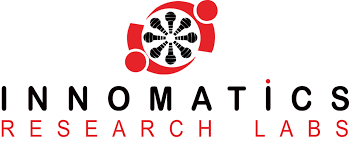

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

## Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os 
import random
from datetime import datetime
from scipy import sparse
#from scipy.sparse import csr matrix

warnings.filterwarnings('ignore')
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

# Song File

In [3]:
songs_file = pd.read_csv('data/kaggle/kaggle_songs.txt', sep=' ', header=None)

#### songs_file.columns = ['user_id', 'listen_count']

In [4]:
songs_file.head(3)

,0,1
0,SOAAADD12AB018A9DD,1
1,SOAAADE12A6D4F80CC,2
2,SOAAADF12A8C13DF62,3


In [5]:
len(songs_file)

386213

# User File

In [6]:
users_file = pd.read_csv('data/kaggle/kaggle_users.txt', header=None)

In [7]:
len(users_file)

110000

In [8]:
users_file.columns = ['user_id']

In [9]:
users_file.head(3)

,user_id
0,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d
1,d7083f5e1d50c264277d624340edaaf3dc16095b
2,d68dc6fc25248234590d7668a11e3335534ae4b4


# Triplets File

In [10]:
triplets_file = pd.read_csv('data/kaggle/kaggle_visible_evaluation_triplets.txt', sep='\t', header=None)

In [11]:
len(triplets_file)

1450933

In [12]:
triplets_file.columns = ['user_id', 'song_id', 'listen_count']

In [13]:
triplets_file.head(3)

,user_id,song_id,listen_count
0,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOBONKR12A58A7A7E0,1
1,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOEGIYH12A6D4FC0E3,1
2,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOFLJQZ12A6D4FADA6,1


In [14]:
len(triplets_file['user_id'].value_counts())

110000

In [15]:
triplets_file.describe()

,listen_count
count,1.450933e+06
mean,3.187149e+00
std,7.051664e+00
min,1.000000e+00
25%,1.000000e+00
50%,1.000000e+00
75%,3.000000e+00
max,9.230000e+02


In [16]:
triplets_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450933 entries, 0 to 1450932
Data columns (total 3 columns):
 #   Column        Non-Null Count    Dtype 
---  ------        --------------    ----- 
 0   user_id       1450933 non-null  object
 1   song_id       1450933 non-null  object
 2   listen_count  1450933 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 33.2+ MB


In [17]:
triplets_file.isnull().sum()

user_id         0
song_id         0
listen_count    0
dtype: int64

# Track File

In [18]:
tracks_file = pd.read_csv('data/kaggle/unique_tracks.txt', sep='<SEP>', header=None, 
                          names=['track_id', 'song_id', 'artist_name', 'release'])
tracks_file.head()

,track_id,song_id,artist_name,release
0,TRMMMYQ128F932D901,SOQMMHC12AB0180CB8,Faster Pussy cat,Silent Night
1,TRMMMKD128F425225D,SOVFVAK12A8C1350D9,Karkkiautomaatti,Tanssi vaan
2,TRMMMRX128F93187D9,SOGTUKN12AB017F4F1,Hudson Mohawke,No One Could Ever
3,TRMMMCH128F425532C,SOBNYVR12A8C13558C,Yerba Brava,Si Vos Querés
4,TRMMMWA128F426B589,SOHSBXH12A8C13B0DF,Der Mystic,Tangle Of Aspens


In [19]:
len(tracks_file)

1000000

In [20]:
tracks_file_cleaned = tracks_file.drop(['track_id'], axis=1)
tracks_file_cleaned.head()

,song_id,artist_name,release
0,SOQMMHC12AB0180CB8,Faster Pussy cat,Silent Night
1,SOVFVAK12A8C1350D9,Karkkiautomaatti,Tanssi vaan
2,SOGTUKN12AB017F4F1,Hudson Mohawke,No One Could Ever
3,SOBNYVR12A8C13558C,Yerba Brava,Si Vos Querés
4,SOHSBXH12A8C13B0DF,Der Mystic,Tangle Of Aspens


In [21]:
tracks_file.describe()

,track_id,song_id,artist_name,release
count,1000000,1000000,1000000,999985
unique,1000000,999056,72665,702000
top,TRTGICP128F9304C96,SOPRYHK12A8AE47858,Michael Jackson,Intro
freq,1,3,194,1511


In [22]:
tracks_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 4 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   track_id     1000000 non-null  object
 1   song_id      1000000 non-null  object
 2   artist_name  1000000 non-null  object
 3   release      999985 non-null   object
dtypes: object(4)
memory usage: 30.5+ MB


In [23]:
tracks_file.isnull().sum()

track_id        0
song_id         0
artist_name     0
release        15
dtype: int64

## Check for Duplicates and Missing values

In [24]:
print("Null values in Triplets file :", sum(triplets_file.isnull().any()))
print("Null values in trackes file :", sum(tracks_file.isnull().any()))

Null values in Triplets file : 0
Null values in trackes file : 1


- No Null values in triplets file
- Only one Null value in tracks file

In [25]:
print("Duplicate values in triplets file :", sum(triplets_file.duplicated()))
print("Duplicate values in trackes file :", sum(tracks_file.duplicated()))

Duplicate values in triplets file : 0
Duplicate values in trackes file : 0


- No duplicate rows in triplates data
- No duplicate rows in trackes data

# Merge Files

In [26]:
dataset = pd.merge(triplets_file, tracks_file_cleaned.drop_duplicates(['song_id']), on='song_id', how='left')
dataset.head()

,user_id,song_id,listen_count,artist_name,release
0,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOBONKR12A58A7A7E0,1,Dwight Yoakam,You're The One
1,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOEGIYH12A6D4FC0E3,1,Barry Tuckwell/Academy of St Martin-in-the-Fie...,Horn Concerto No. 4 in E flat K495: II. Romanc...
2,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOFLJQZ12A6D4FADA6,1,Cartola,Tive Sim
3,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOHTKMO12AB01843B0,1,Lonnie Gordon,Catch You Baby (Steve Pitron & Max Sanna Radio...
4,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SODQZCY12A6D4F9D11,1,Miguel Calo,El Cuatrero


In [27]:
print("Length of the dataset :", len(dataset))

Length of the dataset : 1450933


In [28]:
print("Duplicate values in songID :", sum(dataset['song_id'].duplicated()))
print("Duplicate values in userID :", sum(dataset['user_id'].duplicated()))

Duplicate values in songID : 1287727
Duplicate values in userID : 1340933


In [29]:
print("Unique User ID's :", dataset['user_id'].nunique())
print("Unique Song ID's :", dataset['song_id'].nunique())
print("Unique Artist :", dataset['artist_name'].nunique())
print("Unique Release :", dataset['release'].nunique())

Unique User ID's : 110000
Unique Song ID's : 163206
Unique Artist : 28361
Unique Release : 137622


- Total userID's is less than the total songID's. And we have seen earlier that user ID also has duplicate values. So one user has multiple entries with different song ID's.
- Total Song ID's is greater than total artists. that means one artist makes a multiple songs

In [30]:
unique_song_ids = dataset['song_id'].nunique()
unique_user_ids = dataset['user_id'].nunique()
unique_artist = dataset['artist_name'].nunique()

In [31]:
dataset.describe()

,listen_count
count,1.450933e+06
mean,3.187149e+00
std,7.051664e+00
min,1.000000e+00
25%,1.000000e+00
50%,1.000000e+00
75%,3.000000e+00
max,9.230000e+02


In [32]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450933 entries, 0 to 1450932
Data columns (total 5 columns):
 #   Column        Non-Null Count    Dtype 
---  ------        --------------    ----- 
 0   user_id       1450933 non-null  object
 1   song_id       1450933 non-null  object
 2   listen_count  1450933 non-null  int64 
 3   artist_name   1450933 non-null  object
 4   release       1450932 non-null  object
dtypes: int64(1), object(4)
memory usage: 66.4+ MB


In [33]:
dataset.isnull().sum()

user_id         0
song_id         0
listen_count    0
artist_name     0
release         1
dtype: int64

In [34]:
dataset.dropna(thresh=1)

,user_id,song_id,listen_count,artist_name,release
0,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOBONKR12A58A7A7E0,1,Dwight Yoakam,You're The One
1,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOEGIYH12A6D4FC0E3,1,Barry Tuckwell/Academy of St Martin-in-the-Fie...,Horn Concerto No. 4 in E flat K495: II. Romanc...
2,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOFLJQZ12A6D4FADA6,1,Cartola,Tive Sim
3,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOHTKMO12AB01843B0,1,Lonnie Gordon,Catch You Baby (Steve Pitron & Max Sanna Radio...
4,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SODQZCY12A6D4F9D11,1,Miguel Calo,El Cuatrero
...,...,...,...,...,...
1450928,5e650759ebf89012044c6d52121eeada8b0ec814,SOVLNXV12A6D4F706E,1,Mos Def,Ms. Fat Booty
1450929,5e650759ebf89012044c6d52121eeada8b0ec814,SOVDSJC12A58A7A271,2,Sam Cooke,Ain't Misbehavin
1450930,5e650759ebf89012044c6d52121eeada8b0ec814,SOBRHVR12A8C133F35,2,Southside Spinners,Luvstruck
1450931,5e650759ebf89012044c6d52121eeada8b0ec814,SOMGVYU12A8C1314FF,2,J. Karjalainen & Mustat Lasit,Sinisten tähtien alla


In [35]:
dataset.isnull().sum()

user_id         0
song_id         0
listen_count    0
artist_name     0
release         1
dtype: int64

In [36]:
dataset.dropna(inplace=True)

In [37]:
dataset.isnull().sum()

user_id         0
song_id         0
listen_count    0
artist_name     0
release         0
dtype: int64

## Basic Statistics

In [38]:
print("Total no of uniques",dataset.shape[0])
print('Total no of users:',dataset['user_id'].unique().shape[0])
print('Total no of songs:',dataset['song_id'].unique().shape[0])
print('Total no of frequency:',dataset['listen_count'].unique().shape[0])
print('Total no of artist name:',dataset['artist_name'].unique().shape[0])
print('Total no of release:',dataset['release'].unique().shape[0])

Total no of uniques 1450932
Total no of users: 110000
Total no of songs: 163205
Total no of frequency: 299
Total no of artist name: 28360
Total no of release: 137622


In [39]:
dataset.describe(include='all')

,user_id,song_id,listen_count,artist_name,release
count,1450932,1450932,1.450932e+06,1450932,1450932
unique,110000,163205,NaN,28360,137622
top,7d90be8dfdbde170f036ce8a4b915440137cb11c,SOFRQTD12A81C233C0,NaN,Coldplay,Sehr kosmisch
freq,53,5043,NaN,12279,5043
mean,NaN,NaN,3.187151e+00,NaN,NaN
std,NaN,NaN,7.051666e+00,NaN,NaN
min,NaN,NaN,1.000000e+00,NaN,NaN
25%,NaN,NaN,1.000000e+00,NaN,NaN
50%,NaN,NaN,1.000000e+00,NaN,NaN
75%,NaN,NaN,3.000000e+00,NaN,NaN


## TOP 20 SONGS REPEATED

In [40]:
print("Top 20 songs repeated")
dataset.song_id.value_counts()[:20]

Top 20 songs repeated


SOFRQTD12A81C233C0    5043
SOAUWYT12A81C206F1    4483
SOBONKR12A58A7A7E0    4136
SOAXGDH12A8C13F8A1    3780
SOSXLTC12AF72A7F54    3672
SONYKOW12AB01849C9    3430
SOEGIYH12A6D4FC0E3    3272
SODJWHY12A8C142CCE    2791
SOLFXKT12AB017E3E0    2725
SOFLJQZ12A6D4FADA6    2668
SOUSMXX12AB0185C24    2260
SOUVTSM12AC468F6A7    2226
SOHTKMO12AB01843B0    2097
SOTWNDJ12A8C143984    1990
SOWCKVR12A8C142411    1911
SOBOUPA12A6D4F81F1    1797
SOOFYTN12A6D4F9B35    1769
SOPUCYA12A8C13A694    1727
SOVDSJC12A58A7A271    1712
SOPPROJ12AB0184E18    1683
Name: song_id, dtype: int64

## TOP 20 USERS LISTENED MORE SONGS

In [41]:
dataset['user_id'].value_counts()[:20]

7d90be8dfdbde170f036ce8a4b915440137cb11c    53
2e424b28bff1f62a2dae22a918f09f9c30c06d1b    52
0f8308935bcbb9a1e04ebb7c4d41c037e5f23b90    52
03ad93fdb01506ce205f4708decf8e4b1ae90fff    52
d30e18323f15426c3cdc8585252ed34459916f51    52
016a24e91a72c159a5048ab1b9b2ba5ce761b526    52
9769ebffc543fa42b58daf6f52f8816abf5f408e    51
7e27789eae69bc946c51833c0b833a49c58ed9ed    51
992fea335363e87217e1b052fd7380b3fd7e35b4    51
316110734d8da7478cc33237458814f770a9eb7a    51
e08848e92427e9ef8add59a1264c484e1078d5a5    51
e99ef008f893efd071a7a77be6f1e8d23b962278    51
ca885bed5d391ccc0fda84e8eb4441e005f68bcd    50
9b0f827c8bad0cf089b0d778307e1b390f463730    50
b7bc5c9ea762079424d014c1b4e05e1d65d68861    50
ad4b2717e89766b66b96fe52a38736116e315874    50
c77574174ffe7118d90ac95c6671ff840858806a    50
7db2077964762a3889dd4d61444a8ba254b6365d    50
b976263ea6b444c431759549a75b3650c66183a6    50
1fb619ced83fb4f92d4098709d7331b30e5e691c    50
Name: user_id, dtype: int64

## TOP 20 FAMOUS ARTIST

In [42]:
dataset['artist_name'].value_counts()[:20]

Coldplay                  12279
Kings Of Leon              8514
Florence + The Machine     8213
Justin Bieber              7669
Jack Johnson               6784
Train                      6617
The Black Keys             6507
Eminem                     6297
OneRepublic                6027
Muse                       5849
Taylor Swift               5648
Linkin Park                5623
Radiohead                  5408
The Killers                5391
Daft Punk                  5379
John Mayer                 5282
Björk                      5144
Harmonia                   5046
Metallica                  4970
Black Eyed Peas            4299
Name: artist_name, dtype: int64

## 1. Most Popular Songs? (Maximum Listen Count)

In [43]:
each_song_listen_freq1 = dataset.groupby(['song_id']).sum()
each_song_listen_freq1.head()

,listen_count
song_id,
SOAAAFI12A6D4F9C66,2
SOAAAGK12AB0189572,2
SOAAAGQ12A8C1420C8,90
SOAAAMT12AB018C9C4,1
SOAAAQN12AB01856D3,2


In [44]:
unique_song_ids

163206

In [45]:
df = dataset

In [46]:
top_popular_songs = df.sort_values('listen_count')
top_popular_songs = top_popular_songs[::-1]

#### Top 50 most popular songs and their Artists

In [47]:
n = list(top_popular_songs['listen_count'])
print('Top Artist with Respect to their songs Listen frequency')
for i in range(0,50):
    print('Artist with Rank --------------------- '+ str(i+1))
    a = df[df['listen_count']==n[i]]
    print(str(a['artist_name']))
    print('&&')
    print(str(a['song_id']))
    print('*************************************************')

Top Artist with Respect to their songs Listen frequency
Artist with Rank --------------------- 1
1449167    Kilgore
Name: artist_name, dtype: object
&&
1449167    SOXTUWG12AB018A2E2
Name: song_id, dtype: object
*************************************************
Artist with Rank --------------------- 2
838445    The Beach Boys
Name: artist_name, dtype: object
&&
838445    SOPMHHE12AB01845F6
Name: song_id, dtype: object
*************************************************
Artist with Rank --------------------- 3
471133    Ms. Dynamite / Kymani Marley
Name: artist_name, dtype: object
&&
471133    SOAOXTG12A67021AA7
Name: song_id, dtype: object
*************************************************
Artist with Rank --------------------- 4
1297745    Queen
Name: artist_name, dtype: object
&&
1297745    SONGOJV12AF729AEBD
Name: song_id, dtype: object
*************************************************
Artist with Rank --------------------- 5
642730    Us3
Name: artist_name, dtype: object
&&
642730    S

In [48]:
len(top_popular_songs[top_popular_songs['listen_count']>=100])

954

In [49]:
quotient = len(top_popular_songs[top_popular_songs['listen_count']>=100])/unique_song_ids
percentage = quotient*100
print(percentage)

0.58453733318628


* So there is only <b> 58% </b> songs has more than 100 listen count
* total 954 songs out of 1,63,205 songs has more than 100 listen count.

## 2. What is the average listen count range for each songs?

In [50]:
each_song_listen_freq = dataset.groupby(['song_id']).sum()
sorted_each_song_listen_freq = each_song_listen_freq.sort_values('listen_count')
sorted_each_song_listen_freq.value_counts().sort_values(ascending=False).head(50)

listen_count
1               41276
2               19607
3               12063
4                8323
5                8257
6                6259
7                4843
8                4019
9                3406
10               3314
11               2797
12               2485
13               2252
14               1925
15               1811
16               1761
17               1545
18               1418
19               1323
20               1221
21               1164
22               1045
23               1016
24                920
25                902
26                802
27                794
29                710
28                699
30                670
31                624
32                600
33                592
34                521
35                510
36                502
38                499
39                460
37                442
40                431
43                387
42                385
41                380
44                379
45                3

In [51]:
sum_of_most_listen_songs = sorted_each_song_listen_freq['listen_count'].value_counts().sort_values(ascending=False).head(50).sum()
sum_of_most_listen_songs

147200

In [52]:
quotient = sum_of_most_listen_songs/unique_song_ids
percentage = quotient*100
print(percentage)

90.19276252098575


- Total unique songs is 1,63,206 and 1,47,201 songs listen between 0-50 times.
- <b>We can say that 90% of songs listen between 0-50 times.</b>

<AxesSubplot:xlabel='listen_count', ylabel='Density'>

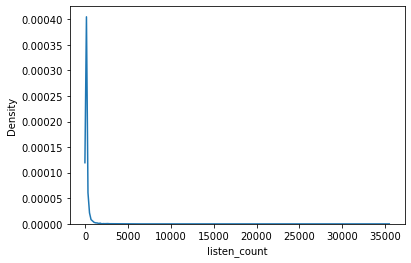

In [53]:
sns.distplot(sorted_each_song_listen_freq['listen_count'], hist=False, bins=20)

- Most of the songs has listen count between 0-50
- Very few songs has greater than 50 listen count.

## 3. Which song is most listened by user?

In [54]:
songs_per_user = dataset.groupby(by=['user_id', 'song_id']).sum()

In [55]:
songs_per_user.head(20)

listen_count
user_id                                  song_id                         
00007a02388c208ea7176479f6ae06f8224355b3 SOAITVD12A6D4F824B             3
                                         SOJTNQQ12AF72A246E             2
                                         SONGABP12A8C1442D4             1
                                         SONZGLW12A6D4FBBC1             1
                                         SOSMMEW12A8C134F96             2
                                         SOSPTOE12A6D4F938C             1
                                         SOTNDOM12AF729CADB             1
                                         SOXMOQF12A6701FB8B             1
                                         SOXNWYP12A6D4FBDC4             1
00014a76ed063e1a749171a253bca9d9a0ff1782 SOBQBIX12A6D4F8653             1
                                         SOCCSRQ12AB01828CE            10
                                         SOEWNJA12A67AE110B             1
                                         SOIZOGF12A6D4F866A             2
                                         SOJOYQG12A8C1443B1             1
                                         SOODZZZ12A6D4F7567             1
                                         SOOYWQZ12AB018AAF2             1
                                         SORGONC12A8C144CCE             1
                                         SORHASY12A6D4F8664             1
                                         SOTCMDJ12A6D4F8528             4
                                         SOXQRWT12A6D4F867A             1

In [56]:
songs_per_user.index

MultiIndex([('00007a02388c208ea7176479f6ae06f8224355b3', 'SOAITVD12A6D4F824B'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOJTNQQ12AF72A246E'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SONGABP12A8C1442D4'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SONZGLW12A6D4FBBC1'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOSMMEW12A8C134F96'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOSPTOE12A6D4F938C'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOTNDOM12AF729CADB'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOXMOQF12A6701FB8B'),
            ('00007a02388c208ea7176479f6ae06f8224355b3', 'SOXNWYP12A6D4FBDC4'),
            ('00014a76ed063e1a749171a253bca9d9a0ff1782', 'SOBQBIX12A6D4F8653'),
            ...
            ('ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee', 'SODKBDP12AB0182226'),
            ('ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee', 'SODKXYM12A8C1383FB'),
            ('ffff07d7d9

In [57]:
songs_per_user.reset_index()

,user_id,song_id,listen_count
0,00007a02388c208ea7176479f6ae06f8224355b3,SOAITVD12A6D4F824B,3
1,00007a02388c208ea7176479f6ae06f8224355b3,SOJTNQQ12AF72A246E,2
2,00007a02388c208ea7176479f6ae06f8224355b3,SONGABP12A8C1442D4,1
3,00007a02388c208ea7176479f6ae06f8224355b3,SONZGLW12A6D4FBBC1,1
4,00007a02388c208ea7176479f6ae06f8224355b3,SOSMMEW12A8C134F96,2
...,...,...,...
1450927,ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee,SOKOPJY12A8C13BEB7,1
1450928,ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee,SOKTVCV12AB017E793,1
1450929,ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee,SOOPDFE12A8C1386BB,5
1450930,ffff07d7d9bb187aa58c7b81b3d3f35e7cf7c0ee,SOPSVIR12A8C138BB5,25


In [58]:
def max(a):
    max =0 
    for i in a:
        if max<i:
            max = i
        else:
            max = max
    return max
max(list(dataset['listen_count']))   

923

In [59]:
dataset[dataset['listen_count']==max(list(dataset['listen_count']))]

,user_id,song_id,listen_count,artist_name,release
1449167,22bb29714137fa47083963c30e1a26f1bf517e7d,SOXTUWG12AB018A2E2,923,Kilgore,Drop The Hammer (Album Version)


In [60]:
k = list(df['listen_count'].sort_values(ascending=False))

### Top 20 Songs Mostley Listened by the users

In [61]:
for i in range(0,20):
    print('SONG NUMBER ---------------------------------------' + str(i+1))
    a = df[df['listen_count']==k[i]]
    print(a['user_id'], a['song_id'], a['release'], a['listen_count'])
    print('*******************************************************************')

SONG NUMBER ---------------------------------------1
1449167    22bb29714137fa47083963c30e1a26f1bf517e7d
Name: user_id, dtype: object 1449167    SOXTUWG12AB018A2E2
Name: song_id, dtype: object 1449167    Drop The Hammer (Album Version)
Name: release, dtype: object 1449167    923
Name: listen_count, dtype: int64
*******************************************************************
SONG NUMBER ---------------------------------------2
838445    a1cc4d088600df2db42e6a305974675ffe8c905d
Name: user_id, dtype: object 838445    SOPMHHE12AB01845F6
Name: song_id, dtype: object 838445    What Is a Young Girl Made of
Name: release, dtype: object 838445    646
Name: listen_count, dtype: int64
*******************************************************************
SONG NUMBER ---------------------------------------3
471133    2d9ea6058d0872ccdc5b1c5c685758bb9c55f0a3
Name: user_id, dtype: object 471133    SOAOXTG12A67021AA7
Name: song_id, dtype: object 471133    Seed Will Grow
Name: release, dtype: object 

## 4. Which Users are active and inactive?

In [62]:
total_songs_per_user = dataset.groupby(by=['user_id']).sum()
total_songs_per_user.head()

,listen_count
user_id,
00007a02388c208ea7176479f6ae06f8224355b3,13
00014a76ed063e1a749171a253bca9d9a0ff1782,24
00015189668691680bb1a2e58afde1541ec92ced,101
0001ff7aa2667c8d8b945317b88adaed1c0b9dc2,12
00020fcd8b01986a6a85b896ccde6c49f35142ad,44


In [63]:
unique_user_ids

110000

In [64]:
total_songs_per_user.sort_values('listen_count').head()

,listen_count
user_id,
219c456aaa463013ec3e08ed10ab1b5cded1a46e,5
13e24d4e0a2565607d5d1c5a734cff9c347044df,5
be8429f24fc9d4a9c629d3807948c51e7a0a2f9b,5
d431e054366a0fb5a9adf4c15728b8948857eb57,5
46081c034ec6f930d5f14c9cae5a9dfbac6ec171,5


In [65]:
total_songs_per_user.sort_values('listen_count').tail()

,listen_count
user_id,
5a9375e46a7e9b869058c7bc0e820e00d77f3e0b,1184
c6150292374fb1dad89982367b3245dd5004c718,1192
1c5aa998482a40abfd020759e7d757eb6c510e72,1200
938c2632d43eeadb8a83a7cc254d014f9cea6afe,1267
090b841eaf56d343a26625c2c6d08b823927bc4f,1305


In [66]:
active_users = total_songs_per_user.sort_values('listen_count').tail(2189)
active_users

,listen_count
user_id,
bddbd436d74540931c67c0793667f694c9964934,200
a560c8b410bf9ab16e5bb82ca71b13ba3152d1df,200
97296369013fdf1c45253cb1705e5d40cc174f30,200
da3c687f0ee68f43ed8125dba84f2646e83ab9e9,200
7f897118f59a500e04637da15a17eba150f1a088,200
...,...
5a9375e46a7e9b869058c7bc0e820e00d77f3e0b,1184
c6150292374fb1dad89982367b3245dd5004c718,1192
1c5aa998482a40abfd020759e7d757eb6c510e72,1200


2,189 users listen a songs more than 200 times

In [67]:
total_songs_per_user.describe()

,listen_count
count,110000.000000
mean,42.039445
std,53.315752
min,5.000000
25%,13.000000
50%,25.000000
75%,50.000000
max,1305.000000


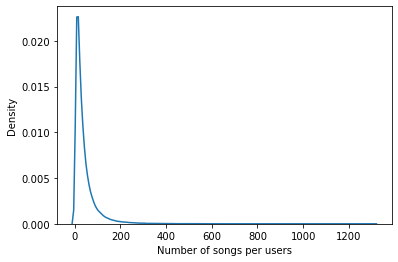

In [68]:
plt.xlabel('Number of songs per users')
sns.kdeplot(total_songs_per_user['listen_count'])
plt.show()

In [69]:
quotient = len(active_users)/unique_user_ids
percentage = quotient*100
print(percentage)

1.9900000000000002


* <b>1.99%</b> users listen a songs <b>more than 200</b> times
* <b>98%</b> users listen a songs <b>less than 200</b> times

## 5. Which Artists most liked by people?

In [70]:
artists = dataset.groupby(['artist_name']).sum()
artists.head()

,listen_count
artist_name,
!!!,325
!Deladap,8
& And Oceans,9
'68 Comeback,49
'N Sync/Phil Collins,344


In [71]:
unique_artist

28361

In [72]:
artists.sort_values('listen_count').head()

,listen_count
artist_name,
Özlem Tekin,1
Freeway / Rick Ross,1
Bjørn Afzelius,1
Bjørn Berge,1
Scott Reeder,1


In [73]:
artists.sort_values('listen_count').tail()

,listen_count
artist_name,
Florence + The Machine,28224
Coldplay,32135
Björk,35210
Dwight Yoakam,35688
Kings Of Leon,35857


In [74]:
famous_artists = artists.sort_values('listen_count').tail(105)
famous_artists

,listen_count
artist_name,
Cage The Elephant,5052
Natiruts,5069
Band Of Horses,5114
La Roux,5168
The Verve,5185
...,...
Florence + The Machine,28224
Coldplay,32135
Björk,35210


* 105 artists out of 28,361 artists has more than 5,000 listens on thier songs.

In [75]:
quotient = len(famous_artists)/unique_artist
percentage = quotient*100
print(percentage)

0.37022671979126265


* 0.37 percent artists has more than 5000 listening on thier songs

## 6. Which song of the artists people like?

In [76]:
artists = dataset.groupby(['artist_name'])
artists.head(20)

,user_id,song_id,listen_count,artist_name,release
0,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOBONKR12A58A7A7E0,1,Dwight Yoakam,You're The One
1,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOEGIYH12A6D4FC0E3,1,Barry Tuckwell/Academy of St Martin-in-the-Fie...,Horn Concerto No. 4 in E flat K495: II. Romanc...
2,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOFLJQZ12A6D4FADA6,1,Cartola,Tive Sim
3,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SOHTKMO12AB01843B0,1,Lonnie Gordon,Catch You Baby (Steve Pitron & Max Sanna Radio...
4,fd50c4007b68a3737fe052d5a4f78ce8aa117f3d,SODQZCY12A6D4F9D11,1,Miguel Calo,El Cuatrero
...,...,...,...,...,...
1450817,50425152daa590af3c61b517f21ec755f08b3406,SOOMYKI12A8C13943C,1,L.S.G.,Into Deep (Clubmix 2)
1450818,50425152daa590af3c61b517f21ec755f08b3406,SODNPCR12AB0183FF0,1,Emerson_ Lake & Palmer,Canario
1450843,6b6d43eb0a1a6bdf471cebe380524946884746c6,SOTWZNN12A5829170A,1,Mick Jagger and Joss Stone,Lonely Without You (This Christmas)
1450903,fc072bde2043756ea30ff07e4a5311e34825b4df,SOSLFKR12A8C1410BB,6,Puscifer (MJ Keenan),Holiday On The Moon


In [77]:
names = list(df['artist_name'].unique())
print('Which song of the artists people like?')
for i in names:
    print('**************************************************************')
    print(' most listened song of --------'+ i)
    d = artists.get_group(i)
    n = d[d['listen_count'] == d['listen_count'].max()]
    print(n['artist_name'], n['user_id'], n['listen_count'],n['release'],n['song_id'])
    print('**************************************************************')

Which song of the artists people like?
**************************************************************
 most listened song of --------Dwight Yoakam
651009    Dwight Yoakam
Name: artist_name, dtype: object 651009    28caa9baa2203b0b3d97f9e51f17965cf26ff7e4
Name: user_id, dtype: object 651009    234
Name: listen_count, dtype: int64 651009    You're The One
Name: release, dtype: object 651009    SOBONKR12A58A7A7E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Barry Tuckwell/Academy of St Martin-in-the-Fields/Sir Neville Marriner
578544    Barry Tuckwell/Academy of St Martin-in-the-Fie...
Name: artist_name, dtype: object 578544    3af25aaf58d9bf84fa7a1df0c4c8868649973029
Name: user_id, dtype: object 578544    174
Name: listen_count, dtype: int64 578544    Horn Concerto No. 4 in E flat K495: II. Romanc...
Name: release, dtype: object 578544    SOEGIYH12A

Name: artist_name, dtype: object 162374    56f2881b87677075825aef256f7ae05dd6fd1656
Name: user_id, dtype: object 162374    47
Name: listen_count, dtype: int64 162374    Todo O Amor Que Houver Nessa Vida
Name: release, dtype: object 162374    SOKLKQO12AB0184237
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Christophe Maé
741670    Christophe Maé
Name: artist_name, dtype: object 741670    32c636bd557eee54df5d255fdc97e045466a2c05
Name: user_id, dtype: object 741670    34
Name: listen_count, dtype: int64 741670    J'ai Laissé
Name: release, dtype: object 741670    SORXCCE12AB0186870
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Elliott Smith
1198187    Elliott Smith
Name: artist_name, dtype: object 1198187    1d824

826727    Black Eyed Peas
Name: artist_name, dtype: object 826727    b3be10f437924444b15778a3bae55ed1b23eb795
Name: user_id, dtype: object 826727    308
Name: listen_count, dtype: int64 826727    Pump It
Name: release, dtype: object 826727    SOMEUED12A6701DBEA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Skillet
690625    Skillet
Name: artist_name, dtype: object 690625    aec8e9cc4881b8704414203657a91ae6282e3bce
Name: user_id, dtype: object 690625    255
Name: listen_count, dtype: int64 690625    Rebirthing (Album Version)
Name: release, dtype: object 690625    SOKSREW12A6D4F926D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Group 1 Crew
729219    Group 1 Crew
Name: artist_name, dtype: object 729219    6872d1

Name: release, dtype: object 299021    SODKKNZ12A8C13E383
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------G Unit ft. 50 Cent
1029134    G Unit ft. 50 Cent
Name: artist_name, dtype: object 1029134    b0136e0e7e2d05e11835356e574cf664ca8afcc2
Name: user_id, dtype: object 1029134    5
Name: listen_count, dtype: int64 1029134    U Should Be Here
Name: release, dtype: object 1029134    SOMKRGT12A8C132B92
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Marques Houston
1268589    Marques Houston
Name: artist_name, dtype: object 1268589    f3229166add6c3a3c0d35b4f1f7fa8a46b35965b
Name: user_id, dtype: object 1268589    98
Name: listen_count, dtype: int64 1268589    Clubbin' featuring Joe Budden (Remix) (Bonus T...
Name: rel

816095    The Killers
Name: artist_name, dtype: object 816095    46d989f4c613362ed3fc681e5cb7ccacd6991248
Name: user_id, dtype: object 816095    98
Name: listen_count, dtype: int64 816095    Spaceman
Name: release, dtype: object 816095    SOQWZAB12AB017C6F7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Limp Bizkit
641897    Limp Bizkit
Name: artist_name, dtype: object 641897    34db20a7491c10018531f0fecec6cb23e96ca6bc
Name: user_id, dtype: object 641897    88
Name: listen_count, dtype: int64 641897    Behind Blue Eyes
Name: release, dtype: object 641897    SOVDLVT12A58A7B988
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Muse
997417    Muse
Name: artist_name, dtype: object 997417    d1d845a92cd34456423e781512bdb

561294    Miley Cyrus
Name: artist_name, dtype: object 561294    7b9dc7e88fe337c33727ca7b13486f68d37f8fa0
Name: user_id, dtype: object 561294    91
Name: listen_count, dtype: int64 561294    Party In The U.S.A.
Name: release, dtype: object 561294    SOVWADY12AB0189C63
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alicia Keys
481542    Alicia Keys
Name: artist_name, dtype: object 481542    de2e0424ffef9bf3af6703eea2fc8cf0d73acbc5
Name: user_id, dtype: object 481542    196
Name: listen_count, dtype: int64 481542    Try Sleeping With A Broken Heart
Name: release, dtype: object 481542    SOVRMZU12AB017FE90
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Britney Spears
719844    Britney Spears
Name: artist_name, dtype

552    The Kabeedies
Name: artist_name, dtype: object 552    6493c305190b52657d4ea3f4adf367ffcf3427af
Name: user_id, dtype: object 552    12
Name: listen_count, dtype: int64 552    Palindromes
Name: release, dtype: object 552    SOQQALT12AC4689364
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Echo And The Bunnymen
489712    Echo And The Bunnymen
959009    Echo And The Bunnymen
Name: artist_name, dtype: object 489712    39ec5c54ff80d2c85315676f022229aad30fac98
959009    692211c8f616adfb52f8007652410c7c10592758
Name: user_id, dtype: object 489712    92
959009    92
Name: listen_count, dtype: int64 489712    New Direction (Original Version)
959009    New Direction (Original Version)
Name: release, dtype: object 489712    SOMCHRF12A6D4FA1B7
959009    SOMCHRF12A6D4FA1B7
Name: song_id, dtype: object
*******************************************************

Name: artist_name, dtype: object 114179    a23c7173eb36f69d0151ff75bb755e51700c1b85
Name: user_id, dtype: object 114179    58
Name: listen_count, dtype: int64 114179    Dear Bobbie
Name: release, dtype: object 114179    SOVQEOQ12A81C2323D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Steve Ouimette
869897    Steve Ouimette
Name: artist_name, dtype: object 869897    49070e5043e3db91110acac781adc3dc02b24327
Name: user_id, dtype: object 869897    11
Name: listen_count, dtype: int64 869897    The Devil Went Down To Georgia
Name: release, dtype: object 869897    SOYYQZF12A8C1309D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Weird Al Yankovic
227440    Weird Al Yankovic
Name: artist_name, dtype: object 227440    ed

**************************************************************
**************************************************************
 most listened song of --------Graham Coxon
420035    Graham Coxon
Name: artist_name, dtype: object 420035    7fa364da8b63bbc43f9c5b179edf0e20e829ff5f
Name: user_id, dtype: object 420035    24
Name: listen_count, dtype: int64 420035    I'm Goin' Away
Name: release, dtype: object 420035    SORCTZI12A6D4F7B13
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Neno Belan
776639    Neno Belan
Name: artist_name, dtype: object 776639    19f82880c3040e549889143b96477f1207b40584
Name: user_id, dtype: object 776639    27
Name: listen_count, dtype: int64 776639    Zaboravi
Name: release, dtype: object 776639    SOICQPB12AC9072AAC
Name: song_id, dtype: object
**************************************************************
*******************

938475    Garbage
938480    Garbage
Name: artist_name, dtype: object 938475    ced0e417b5dd9a945f1f409446e238b21263f915
938480    ced0e417b5dd9a945f1f409446e238b21263f915
Name: user_id, dtype: object 938475    42
938480    42
Name: listen_count, dtype: int64 938475            Parade
938480    So Like A Rose
Name: release, dtype: object 938475    SOTZHST12A6701F9C3
938480    SOODVDL12A6701F9C6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Dresden Dolls
436348    The Dresden Dolls
Name: artist_name, dtype: object 436348    59e7cd095a17b6735d63d1f3d4116ba1ae43ac30
Name: user_id, dtype: object 436348    67
Name: listen_count, dtype: int64 436348    The Jeep Song
Name: release, dtype: object 436348    SOIRUMG12A6D4F5242
Name: song_id, dtype: object
**************************************************************
***************************************

941758    Fokofpolisiekar
Name: artist_name, dtype: object 941758    466ae56af7ee9f3bcc38beada909c73a97123db7
Name: user_id, dtype: object 941758    55
Name: listen_count, dtype: int64 941758    Hemel Op Die Platteland
Name: release, dtype: object 941758    SORGNNV12AB0181818
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kato
1001629    Kato
Name: artist_name, dtype: object 1001629    1f8246971d0ce50d3caf3f0ee35d92092d0de6dd
Name: user_id, dtype: object 1001629    17
Name: listen_count, dtype: int64 1001629    Turn The Lights Off (Feat. Jon)
Name: release, dtype: object 1001629    SODRVED12AB0184359
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Céline Dion
357314    Céline Dion
Name: artist_name, dtype: object 

1319181    Les Humphries Singers
1319187    Les Humphries Singers
Name: artist_name, dtype: object 1319181    26b72a10dbafedd608ae93df2c5206449b412a7d
1319187    26b72a10dbafedd608ae93df2c5206449b412a7d
Name: user_id, dtype: object 1319181    8
1319187    8
Name: listen_count, dtype: int64 1319181      Mexico
1319187    Mama Loo
Name: release, dtype: object 1319181    SOSIQOR12A6D4FA9F2
1319187    SODQPBJ12A8C13EFCC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jimmie Lunceford
1159      Jimmie Lunceford
770604    Jimmie Lunceford
Name: artist_name, dtype: object 1159      8e7adf66027e61993062af5214153d3f55db2e8a
770604    f39b25ed35a4302f82072c3b194e737bc8dd074a
Name: user_id, dtype: object 1159      1
770604    1
Name: listen_count, dtype: int64 1159      For Dancers Only
770604    For Dancers Only
Name: release, dtype: object 1159      SOQVMYH12

Name: listen_count, dtype: int64 1347880    Calabria 2007
Name: release, dtype: object 1347880    SOUKTVI12A8C13BF74
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stars
254742    Stars
Name: artist_name, dtype: object 254742    f3b7d4737f2e2eacc957bcf652d39f78672ee9ab
Name: user_id, dtype: object 254742    82
Name: listen_count, dtype: int64 254742    Calendar girl
Name: release, dtype: object 254742    SOQTANJ12A6D4FCD07
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alex Gaudino Feat. Crystal Waters
427081    Alex Gaudino Feat. Crystal Waters
Name: artist_name, dtype: object 427081    30cd59a70c4dd1e7dd87186077641862f7621b6d
Name: user_id, dtype: object 427081    26
Name: listen_count, dtype: int64 427081    D

878461     Mastodon
1098916    Mastodon
Name: artist_name, dtype: object 878461     9516cd94b2fef58a55f3225a2d07f18d4854d23b
1098916    a47f50ab0f1c03f11035f9408de9fd71e945c3fd
Name: user_id, dtype: object 878461     8
1098916    8
Name: listen_count, dtype: int64 878461            Divinations (Album Version)
1098916    Colony Of Birchmen (Album Version)
Name: release, dtype: object 878461     SOMWBKM12A8C142BE6
1098916    SOESBOJ12A6D4F791D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Lonely Island / Jack Black
794935    The Lonely Island / Jack Black
Name: artist_name, dtype: object 794935    6924010b316cf4bbaf10ec5124d444d372e2b22a
Name: user_id, dtype: object 794935    29
Name: listen_count, dtype: int64 794935    Sax Man
Name: release, dtype: object 794935    SONZSIP12A8C144B42
Name: song_id, dtype: object
********************************

Name: listen_count, dtype: int64 1314572    Radar Detector
Name: release, dtype: object 1314572    SOECCQW12AC468675B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ulrich Schnauss
858339    Ulrich Schnauss
Name: artist_name, dtype: object 858339    0f192adfc91c4615648d5701940075e2028fcb05
Name: user_id, dtype: object 858339    62
Name: listen_count, dtype: int64 858339    Stars
Name: release, dtype: object 858339    SOLRBTP12A6D4F6F22
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mylène Farmer
379848    Mylène Farmer
Name: artist_name, dtype: object 379848    18b2c6d59f63edc35b0d1189b240fa7548950aad
Name: user_id, dtype: object 379848    40
Name: listen_count, dtype: int64 379848    Porno Graphique
Name: releas

Name: listen_count, dtype: int64 212061    Ms. Jackson
Name: release, dtype: object 212061    SOLRDEI12A8C13AAA2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Shwayze
855460    Shwayze
855464    Shwayze
855469    Shwayze
Name: artist_name, dtype: object 855460    6435bfa968b0771452641881ac724cfed825e5a7
855464    6435bfa968b0771452641881ac724cfed825e5a7
855469    6435bfa968b0771452641881ac724cfed825e5a7
Name: user_id, dtype: object 855460    24
855464    24
855469    24
Name: listen_count, dtype: int64 855460      Lazy Susan
855464         Roamin'
855469    Lost My Mind
Name: release, dtype: object 855460    SOVNVSD12A8C13E86A
855464    SOYKDKV12A58A818B3
855469    SOQOLIO12AF729FBDA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listen

Name: artist_name, dtype: object 711162    aee044ca480fd7ccab37b80af12b69dd6bd2f392
Name: user_id, dtype: object 711162    25
Name: listen_count, dtype: int64 711162    Stephanie Knows Who (LP/Stereo Version)
Name: release, dtype: object 711162    SOIJUNP12B0B808342
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------N.W.A.
1201421    N.W.A.
Name: artist_name, dtype: object 1201421    31447bcfe9401add32d45916d747fb2de3da3736
Name: user_id, dtype: object 1201421    34
Name: listen_count, dtype: int64 1201421    Fuck Tha Police
Name: release, dtype: object 1201421    SOLIVXX12A6D4F7950
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fat Joe
86030    Fat Joe
Name: artist_name, dtype: object 86030    379b1e1ba47fb7d6342f5d

Name: artist_name, dtype: object 1404484    09675ac16a8040e5a46a2ea883879c7330702318
Name: user_id, dtype: object 1404484    22
Name: listen_count, dtype: int64 1404484    Love Sensation
Name: release, dtype: object 1404484    SOLFDEF12A6D4F70DA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Harold Budd And Brian Eno
952247    Harold Budd And Brian Eno
Name: artist_name, dtype: object 952247    4f3a7008213d45ee9842c7f92c5eeab3a9ec08d0
Name: user_id, dtype: object 952247    4
Name: listen_count, dtype: int64 952247    An Echo Of Night (2005 Digital Remaster)
Name: release, dtype: object 952247    SOZRSHP12A67AD8117
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Admiral Freebee
1378328    Admiral Freebee
Name: arti

917158    Tommy Sands
Name: artist_name, dtype: object 917158    3b16668a8fe0161f5d671095593fe4b7e67bcc51
Name: user_id, dtype: object 917158    115
Name: listen_count, dtype: int64 917158    Teenage Crush
Name: release, dtype: object 917158    SOSYVNJ12AB01829E8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nebula
771114    Nebula
Name: artist_name, dtype: object 771114    4cfba507e58be2782d6f8a8f4ae49164617f847b
Name: user_id, dtype: object 771114    17
Name: listen_count, dtype: int64 771114    The Way To Venus
Name: release, dtype: object 771114    SORZCZQ12A8C13D4D9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------CKY
206476    CKY
Name: artist_name, dtype: object 206476    ae4d1f162e74da8679eaec03d50216e3436

Name: listen_count, dtype: int64 186150     Polythene
716274    In My Mind
Name: release, dtype: object 186150    SOIHRQZ12A8C13F736
716274    SOCXUNO12A8C142988
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Los Auténticos Decadentes
947747    Los Auténticos Decadentes
Name: artist_name, dtype: object 947747    2caff6852b5be0397ab9402d8a40d25287dc91fd
Name: user_id, dtype: object 947747    80
Name: listen_count, dtype: int64 947747    Los Piratas
Name: release, dtype: object 947747    SOXTWUQ12AB0181B88
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tom Petty And The Heartbreakers
1002900    Tom Petty And The Heartbreakers
Name: artist_name, dtype: object 1002900    edbb163a7648dbb2555a5771a443f83606dcebb9
Name:

Name: artist_name, dtype: object 710582    880726a199f5497cc8c7ede4412575cbbe064390
Name: user_id, dtype: object 710582    18
Name: listen_count, dtype: int64 710582    They Might Follow You
Name: release, dtype: object 710582    SOBUBLL12A58A795A8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mirah
294326    Mirah
Name: artist_name, dtype: object 294326    956f933ee70f3ae95f305deab5fe1e4c87e080ec
Name: user_id, dtype: object 294326    5
Name: listen_count, dtype: int64 294326    Take Me Out Riding
Name: release, dtype: object 294326    SOQVKDH12A8AE450EF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lykke Li
1047394    Lykke Li
Name: artist_name, dtype: object 1047394    230b6fed7545eb2730f69ab2a46a1fbe38c8cb3

Name: artist_name, dtype: object 1166836    2f94027b3bdcfcdd710fd623c97b18b86554cf31
Name: user_id, dtype: object 1166836    74
Name: listen_count, dtype: int64 1166836    Feeling This
Name: release, dtype: object 1166836    SOCRVWC12A6310F991
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Christina Aguilera / Lil' Kim / Mya / Pink
1341800    Christina Aguilera / Lil' Kim / Mya / Pink
Name: artist_name, dtype: object 1341800    7ae50f0ec57e466b059abce4539142846f7f7d61
Name: user_id, dtype: object 1341800    45
Name: listen_count, dtype: int64 1341800    Lady Marmalade
Name: release, dtype: object 1341800    SOYIBFQ12A6701C628
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mindy Smith
787086    Mindy Smith
Name: a

1252111    Keely Smith
Name: artist_name, dtype: object 1252111    5ddb4e6ff47df650950afba703e0c37da5a4d7c0
Name: user_id, dtype: object 1252111    11
Name: listen_count, dtype: int64 1252111    You Go To My Head
Name: release, dtype: object 1252111    SOVSTAJ12A6D4F5F5E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Darren Styles
2716    Darren Styles
Name: artist_name, dtype: object 2716    2d207588092c7abe24392897a658879047213d5a
Name: user_id, dtype: object 2716    53
Name: listen_count, dtype: int64 2716    Paradise & Dreams
Name: release, dtype: object 2716    SOZQSVB12A8C13C271
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Los Originales De San Juan
176965    Los Originales De San Juan
Name: artist_name, 

Name: listen_count, dtype: int64 1078279    Pibe Cantina
Name: release, dtype: object 1078279    SOBQCVI12A8C135AFD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------La Base
1255060    La Base
Name: artist_name, dtype: object 1255060    ede687e71e605d6edab159d5c934bb74a9858432
Name: user_id, dtype: object 1255060    14
Name: listen_count, dtype: int64 1255060    Sabroson
Name: release, dtype: object 1255060    SORKHKM12AB018B83D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bersuit Vergarabat
243879    Bersuit Vergarabat
Name: artist_name, dtype: object 243879    68c2d6aac20deab25a37db38a612432d729b82f0
Name: user_id, dtype: object 243879    28
Name: listen_count, dtype: int64 243879    Shit Shit Money Money
Name: 

881540    Lamb Of God
Name: artist_name, dtype: object 881540    39543da9207b7843ec1cd7e57eb88451214f1823
Name: user_id, dtype: object 881540    60
Name: listen_count, dtype: int64 881540    Choke Sermon (Album Version)
Name: release, dtype: object 881540    SOXRIGJ12AAFF44466
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Clint Mansell
1089933    Clint Mansell
Name: artist_name, dtype: object 1089933    2738bb46d41b65c1b28b016ad4063805b7204354
Name: user_id, dtype: object 1089933    48
Name: listen_count, dtype: int64 1089933    Ghosts of a Future Lost
Name: release, dtype: object 1089933    SOWABBH12A6701BFF6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Codec & Flexor
1214594    Codec & Flexor
Name: artist_na

Name: user_id, dtype: object 247208    22
Name: listen_count, dtype: int64 247208    Lo que más quiero
Name: release, dtype: object 247208    SOPDJWO12A8C13D1AC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Metronomy
562117    Metronomy
Name: artist_name, dtype: object 562117    eb011fd67297163769e281091661fe7cb703b699
Name: user_id, dtype: object 562117    12
Name: listen_count, dtype: int64 562117    Back On The Motorway
Name: release, dtype: object 562117    SOEFBAU12A8C142D3B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ricky Martin
477217    Ricky Martin
Name: artist_name, dtype: object 477217    17444b6be4e28eaa63927583de4ac6dc80dfbecb
Name: user_id, dtype: object 477217    34
Name: listen_count, dtype: 

Name: artist_name, dtype: object 826966    05d58dc4d75c116c7e637f595b64c93eaebdecad
Name: user_id, dtype: object 826966    22
Name: listen_count, dtype: int64 826966    Private Eye
Name: release, dtype: object 826966    SOHRIZP12A8C13CD32
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Soilwork
1187253    Soilwork
Name: artist_name, dtype: object 1187253    c21f6a53db875a40e50ac70a13e8ab6dd164bb81
Name: user_id, dtype: object 1187253    49
Name: listen_count, dtype: int64 1187253    As we speak
Name: release, dtype: object 1187253    SOXKVNB12AF72A7A16
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Helstar
539630    Helstar
Name: artist_name, dtype: object 539630    ee92e95c50badb5606f93dc0cc4ad922506d20d2
Name: u

22094    Frankie Goes To Hollywood
Name: artist_name, dtype: object 22094    3b0514c295357e01f28a2f62eda2e626e8c60d1c
Name: user_id, dtype: object 22094    65
Name: listen_count, dtype: int64 22094    Relax
Name: release, dtype: object 22094    SOZFYTZ12AB018565D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Faithless
843346    Faithless
Name: artist_name, dtype: object 843346    0941f7d73d3d721d50867a8af724579e77832e69
Name: user_id, dtype: object 843346    59
Name: listen_count, dtype: int64 843346    Drifting Away
Name: release, dtype: object 843346    SOWTCLZ12A8AE4572F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Modjo
1029369    Modjo
Name: artist_name, dtype: object 1029369    f3dde2b717415818bcc27469d6

Name: artist_name, dtype: object 219843    5bba2376666a9003c12ffbe6cff5f2bcd7491ab2
Name: user_id, dtype: object 219843    55
Name: listen_count, dtype: int64 219843    Modern world
Name: release, dtype: object 219843    SOJUEFU12AC3DF97C2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Keisha White
1294700    Keisha White
Name: artist_name, dtype: object 1294700    56b430089e37f621dc856979a8197e6065052dd4
Name: user_id, dtype: object 1294700    50
Name: listen_count, dtype: int64 1294700    Brother
Name: release, dtype: object 1294700    SOAUDET12A6D4F96B7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------They Might Be Giants
953035    They Might Be Giants
Name: artist_name, dtype: object 953035    5d60be241cb825ae9

Name: listen_count, dtype: int64 180708    When There Was Me And You
458410    When There Was Me And You
Name: release, dtype: object 180708    SOWOKGK12A6D4F98DC
458410    SOWOKGK12A6D4F98DC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Killswitch Engage
1135318    Killswitch Engage
Name: artist_name, dtype: object 1135318    0ad7cf2420b38cb98f592e6e108008b8039c1639
Name: user_id, dtype: object 1135318    239
Name: listen_count, dtype: int64 1135318    The Arms of Sorrow (Album Version)
Name: release, dtype: object 1135318    SOOBYJS12A6D4FAB2E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mae
486394    Mae
Name: artist_name, dtype: object 486394    fb403bc1bc7db27e09fc5376d6bdf6dca12a9b9b
Name: user_id, dtype

514663    Poisonblack
Name: artist_name, dtype: object 514663    b69868b344e9fccfb237cd2a99d1281981a37511
Name: user_id, dtype: object 514663    15
Name: listen_count, dtype: int64 514663    Nothing Else ReMayns
Name: release, dtype: object 514663    SOEEIVX12A6D4F667D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Michèle Arnaud
757374    Michèle Arnaud
Name: artist_name, dtype: object 757374    5ff70cf1a95c08aeaee7eee6f3b8a041f669b4f1
Name: user_id, dtype: object 757374    59
Name: listen_count, dtype: int64 757374    La Chabraque
Name: release, dtype: object 757374    SONEUJQ12A6D4F8725
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fear Factory
415628    Fear Factory
Name: artist_name, dtype: object 415628   

Name: artist_name, dtype: object 166473    53a38681be22ffb7ea4439e8fa4937033b7b2cab
Name: user_id, dtype: object 166473    67
Name: listen_count, dtype: int64 166473    Fight On (2002 Digital Remaster)
Name: release, dtype: object 166473    SOEELNH12A6D4F6522
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bachman-Turner Overdrive
821763    Bachman-Turner Overdrive
Name: artist_name, dtype: object 821763    582477aff3121e2ee972e9996c215d12eb2585c3
Name: user_id, dtype: object 821763    74
Name: listen_count, dtype: int64 821763    Roll On Down The Highway
Name: release, dtype: object 821763    SOWMBCE12A58A7B377
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Joni Mitchell
355719    Joni Mitchell
Name: artist_name,

Name: artist_name, dtype: object 1370234    43f52923a109a9754f3e404aa7619fc386733012
Name: user_id, dtype: object 1370234    15
Name: listen_count, dtype: int64 1370234    Equation #6
Name: release, dtype: object 1370234    SOPUETR12A8C140D38
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Feist + Ben Gibbard
491767     Feist + Ben Gibbard
1262134    Feist + Ben Gibbard
Name: artist_name, dtype: object 491767     d09f5073b38136f55e7ed31610d80e567ab865f8
1262134    384cb1197fac83563f371435da53a3f4db505ab9
Name: user_id, dtype: object 491767     6
1262134    6
Name: listen_count, dtype: int64 491767     Train Song
1262134    Train Song
Name: release, dtype: object 491767     SOQCCOM12A8C14363C
1262134    SOQCCOM12A8C14363C
Name: song_id, dtype: object
**************************************************************
***************************************

Name: release, dtype: object 841978    SOMGJAD12A8C13A9A6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Africando
853712    Africando
Name: artist_name, dtype: object 853712    220608e9f5dc3c8bbf76918112079474fd5ca098
Name: user_id, dtype: object 853712    33
Name: listen_count, dtype: int64 853712    Katiana
Name: release, dtype: object 853712    SORZCMU12A8C138C32
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Soul Hooligan
4722    Soul Hooligan
Name: artist_name, dtype: object 4722    cc9d1b7883123f703247a3376023838269acb7b0
Name: user_id, dtype: object 4722    8
Name: listen_count, dtype: int64 4722    Evil Woman [Featuring Diana King] (Album Version)
Name: release, dtype: object 4722    SOYJBGP12A58A7C712
N

Name: release, dtype: object 221107    SOKJQYT12A67ADD8B2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Carnal Forge
1381527    Carnal Forge
Name: artist_name, dtype: object 1381527    29eeab33f1a553dac2aa02c83d83cbfcc8a7b715
Name: user_id, dtype: object 1381527    311
Name: listen_count, dtype: int64 1381527    Sacred Flame
Name: release, dtype: object 1381527    SOFTHHP12A6D4F8B4E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Carl Dobkins_ Jr.
1354618    Carl Dobkins_ Jr.
Name: artist_name, dtype: object 1354618    b4d079c37ad19e67f7ff01a319d82af1ccc5f0d4
Name: user_id, dtype: object 1354618    20
Name: listen_count, dtype: int64 1354618    My Heart Is An Open Book
Name: release, dtype: object 1354618    SOGY

939938    Staind
Name: artist_name, dtype: object 939938    a6f011275ee55a0892217c869ab4b8229852597b
Name: user_id, dtype: object 939938    63
Name: listen_count, dtype: int64 939938    Right Here (Album Version)
Name: release, dtype: object 939938    SOQAILR12A67020740
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blue October
288984    Blue October
Name: artist_name, dtype: object 288984    a83dc195090509a294e3edc7fd3b9d47ef8494ff
Name: user_id, dtype: object 288984    74
Name: listen_count, dtype: int64 288984    Into The Ocean
Name: release, dtype: object 288984    SOKOTZG12A6D4F9519
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Throw Rag
1270190    Throw Rag
Name: artist_name, dtype: object 1270190    0253

1401797    First Aid Kit
Name: artist_name, dtype: object 1401797    97a20d5a5a6277bff946eb51773397598af425d7
Name: user_id, dtype: object 1401797    18
Name: listen_count, dtype: int64 1401797    Tangerine
Name: release, dtype: object 1401797    SOZXVIM12AC9072DE7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Junip
325428    Junip
Name: artist_name, dtype: object 325428    b56ce93ec067b7c16529475b1e8fda6c70a91fff
Name: user_id, dtype: object 325428    55
Name: listen_count, dtype: int64 325428    Black Refuge
Name: release, dtype: object 325428    SOXOTQH12AC3DFB2F2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------PAULA COLE
519864    PAULA COLE
Name: artist_name, dtype: object 519864    e83105ac76f20dbc27188f615

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chick Corea / Gary Burton
162142    Chick Corea / Gary Burton
Name: artist_name, dtype: object 162142    82b58223fc2142723d272b7cb3c00447f2d88242
Name: user_id, dtype: object 162142    6
Name: listen_count, dtype: int64 162142    No Mystery
Name: release, dtype: object 162142    SODFHUY12A8C138853
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Murder By Death
76370    Murder By Death
Name: artist_name, dtype: object 76370    d4f7f75ca36788a47bda5651e1281302d0e177ee
Name: user_id, dtype: object 76370    62
Name: listen_count, dtype: int64 76370    Those Who Stayed
Name: release, dtype: object 76370    SOAKQAS12A6D4F8AE6
Name: song_id, dtype: object
*******************

6015    Luiz Bonfa / Oscar Castro Neves / Lalo Schifrin
Name: artist_name, dtype: object 6015    d127a4988fda0695a1bfc392078ac6439a8c8b73
Name: user_id, dtype: object 6015    15
Name: listen_count, dtype: int64 6015    Bossa Nova Cha Cha
Name: release, dtype: object 6015    SOJWEHL12A6D4FAB2B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sheree Brown
6021    Sheree Brown
Name: artist_name, dtype: object 6021    d127a4988fda0695a1bfc392078ac6439a8c8b73
Name: user_id, dtype: object 6021    5
Name: listen_count, dtype: int64 6021    It's A Pleasure
Name: release, dtype: object 6021    SOOETUI12A58A7DCC8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Wavves
1213873    Wavves
Name: artist_name, dtype: object 1213873 

Name: user_id, dtype: object 553360    2
Name: listen_count, dtype: int64 553360    Monkey Boy Highway
Name: release, dtype: object 553360    SOOSPOV12AB018001F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Trademarc
76628    Trademarc
Name: artist_name, dtype: object 76628    36b68e80b57e39be1af6d939db5637d2efcc9bdd
Name: user_id, dtype: object 76628    17
Name: listen_count, dtype: int64 76628    It Went Like This
Name: release, dtype: object 76628    SOPVMQB12AB01877A9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Residents
781561    The Residents
Name: artist_name, dtype: object 781561    400624d515816d6f316a2577dc7fb9c9273f2da7
Name: user_id, dtype: object 781561    45
Name: listen_count, dtype: int64 

1162863    Crystal Fighters
Name: artist_name, dtype: object 1162863    d26d2062555b7ccdaec5d0bdc7e8bbe8cc11ec26
Name: user_id, dtype: object 1162863    59
Name: listen_count, dtype: int64 1162863    I Love London
Name: release, dtype: object 1162863    SOFUBBX12AB018A2E5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------S'Express
1164162    S'Express
Name: artist_name, dtype: object 1164162    8ee2503160af51997f7b060ec9dd343b3c73cce6
Name: user_id, dtype: object 1164162    7
Name: listen_count, dtype: int64 1164162    Theme From S'Express
Name: release, dtype: object 1164162    SOKVVVJ12A8C139CA7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Broder Daniel
790496    Broder Daniel
Name: artist_name, dtype: object 79

Name: listen_count, dtype: int64 278705    I Don't Think About It
Name: release, dtype: object 278705    SORVFMS12A58A7D73B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rachel Portman
1450193    Rachel Portman
1450211    Rachel Portman
Name: artist_name, dtype: object 1450193    f30198d7d45a33aad84e2f49853dc12ba180a701
1450211    f30198d7d45a33aad84e2f49853dc12ba180a701
Name: user_id, dtype: object 1450193    34
1450211    34
Name: listen_count, dtype: int64 1450193    Guillaume's Confession
1450211       Vianne Sets Up Shop
Name: release, dtype: object 1450193    SOBLVER12A8C1392A6
1450211    SOONNRH12A8C1368AD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sanctus Real
838086    Sanctus Real
Name: artist_name

490799    Dane Cook
Name: artist_name, dtype: object 490799    ea8c5622dc70acdbe8e30302c0ddc38cd291aaf2
Name: user_id, dtype: object 490799    18
Name: listen_count, dtype: int64 490799    Car Accident (LP Version)
Name: release, dtype: object 490799    SOCZTTS12A6D4F7B76
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blue Foundation
1255342    Blue Foundation
Name: artist_name, dtype: object 1255342    0a26625f1fc3ad6467391408dab9eaa2950d06f2
Name: user_id, dtype: object 1255342    35
Name: listen_count, dtype: int64 1255342    Eyes On Fire
Name: release, dtype: object 1255342    SOYNEAI12A8C14172D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Finger Eleven
183621    Finger Eleven
Name: artist_name, dtype: obje

Name: release, dtype: object 1301798    SOFLTPK12A8C13A8EC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Trashmen
1078144    The Trashmen
Name: artist_name, dtype: object 1078144    e134b1a3ea1a81280c015826c26228a160258369
Name: user_id, dtype: object 1078144    20
Name: listen_count, dtype: int64 1078144    Surfin' Bird
Name: release, dtype: object 1078144    SOFOZKT12AB01875D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Oleta Adams
681808     Oleta Adams
1217604    Oleta Adams
Name: artist_name, dtype: object 681808     77f99c000d9a5a9d5078fd4dcd9fbb074160d126
1217604    f815e05e651ecf6df4a72cd9e8f79dfa2c336974
Name: user_id, dtype: object 681808     11
1217604    11
Name: listen_count, dtype: int64 681

471647    Christy Nockels
Name: artist_name, dtype: object 471647    188e60f4fb51a91dfaf5118e8df46cb2739ea2e2
Name: user_id, dtype: object 471647    50
Name: listen_count, dtype: int64 471647    Healing Is In Your Hands
Name: release, dtype: object 471647    SOLLIRG12B35055B4C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Charlie McCoy
1200686    Charlie McCoy
Name: artist_name, dtype: object 1200686    be433bea34a9265ec5a2d8f8feceef32b30d47c4
Name: user_id, dtype: object 1200686    29
Name: listen_count, dtype: int64 1200686    Softly And Tenderly
Name: release, dtype: object 1200686    SONKMQE12AB0187B50
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hanna Marsh
516213    Hanna Marsh
Name: artist_name, dtype: 

178743    R. Kelly
892740    R. Kelly
Name: artist_name, dtype: object 178743    f76a9ec201617297e253c7bf94a3c801268ca587
892740    72e4442fb50d32acbe48252313f784c9182a0165
Name: user_id, dtype: object 178743    69
892740    69
Name: listen_count, dtype: int64 178743            Gotham City
892740    Your Body's Callin'
Name: release, dtype: object 178743    SOQBRFC12AF72A7B63
892740    SONCDZK12A58A7C32A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chrisette Michele
480767    Chrisette Michele
Name: artist_name, dtype: object 480767    234461dc5ecad0eb85d7c5f1e83f2175ca5b29b6
Name: user_id, dtype: object 480767    30
Name: listen_count, dtype: int64 480767    Notebook
Name: release, dtype: object 480767    SOGLYIX12A58A7C821
Name: song_id, dtype: object
**************************************************************
********************************

Name: artist_name, dtype: object 1424830    ede4e7761b3bbbd69db596bee131943bc3aa1c8f
Name: user_id, dtype: object 1424830    23
Name: listen_count, dtype: int64 1424830    Flatline
Name: release, dtype: object 1424830    SOBFCNM12A58A7B745
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Atomic Rooster
489724    Atomic Rooster
Name: artist_name, dtype: object 489724    0ab7b78cfdb21482bdb289d75d118a81b54afa1f
Name: user_id, dtype: object 489724    32
Name: listen_count, dtype: int64 489724    And So to Bed
Name: release, dtype: object 489724    SOGWRWQ12AB0187CE3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jello Biafra & The Melvins
361194    Jello Biafra & The Melvins
Name: artist_name, dtype: object 361194    

600776    JayMay
Name: artist_name, dtype: object 600776    43754400956a190a1359601fc9e2f2aafe6c97be
Name: user_id, dtype: object 600776    71
Name: listen_count, dtype: int64 600776    Sea Green_ See Blue
Name: release, dtype: object 600776    SOLJDVO12A8C140FE9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Guasones
1089628    Guasones
Name: artist_name, dtype: object 1089628    022d704524956b9916ee0a754a2f7ba0a747d42f
Name: user_id, dtype: object 1089628    25
Name: listen_count, dtype: int64 1089628    Reyes De La Noche
Name: release, dtype: object 1089628    SOIVTBS12A6D4FE10F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nonpalidece
1104486    Nonpalidece
Name: artist_name, dtype: object 1104486    23a7c66

1250677    Tigers That Talked
Name: artist_name, dtype: object 1250677    39d641beaefda92596d55df46899b288dee3f8d2
Name: user_id, dtype: object 1250677    35
Name: listen_count, dtype: int64 1250677    23 Fears
Name: release, dtype: object 1250677    SOHTANU12A58A7C47E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zeke
8645    Zeke
Name: artist_name, dtype: object 8645    63e860778bcef03ea38a392c4e86cdf153573a39
Name: user_id, dtype: object 8645    11
Name: listen_count, dtype: int64 8645    Slut
Name: release, dtype: object 8645    SOOECHN12A8C1410E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Macaco
599231    Macaco
Name: artist_name, dtype: object 599231    845add9535abbfa10306624043da89cd632345bc
Name: us

**************************************************************
 most listened song of --------Mangataot
901597    Mangataot
Name: artist_name, dtype: object 901597    9517f3d11843d77ab6862e64fc067f8a22e58c7f
Name: user_id, dtype: object 901597    13
Name: listen_count, dtype: int64 901597    Kalidafun Parts 1&2
Name: release, dtype: object 901597    SOCBQXB12AB0183988
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mint Condition
1154264    Mint Condition
Name: artist_name, dtype: object 1154264    b2e27a50357b67face90dcb8d179321fe8c0c6fb
Name: user_id, dtype: object 1154264    19
Name: listen_count, dtype: int64 1154264    Nothing Left To Say
Name: release, dtype: object 1154264    SOKDKZG12AB0180273
Name: song_id, dtype: object
**************************************************************
***********************************************************

Name: artist_name, dtype: object 348567    cb8722c9c616e7122d87d4f202aafe413a392c1c
Name: user_id, dtype: object 348567    88
Name: listen_count, dtype: int64 348567    Strong Enough To Save
Name: release, dtype: object 348567    SOMAUGM12AB0184785
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Russell Watson / Royal Philharmonic Orchestra / John Lubbock
221819    Russell Watson / Royal Philharmonic Orchestra ...
Name: artist_name, dtype: object 221819    b5b724a3ecfbe72e8740c45364ea74cd487c9e7f
Name: user_id, dtype: object 221819    34
Name: listen_count, dtype: int64 221819    Bohemian Rhapsody
Name: release, dtype: object 221819    SORKXSR12A6310DBB8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gin Blossoms


1258216    Underoath
Name: artist_name, dtype: object 1258216    addcc9fc87dcb39cccb6d9359868c7797decb183
Name: user_id, dtype: object 1258216    33
Name: listen_count, dtype: int64 1258216    Desperate Times_ Desperate Measures
Name: release, dtype: object 1258216    SOXXBZK12A8C141A8F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Special AKA
858111    The Special AKA
Name: artist_name, dtype: object 858111    c7591cc996a26a8b67841c4b0c7f2e1cb86dbae1
Name: user_id, dtype: object 858111    64
Name: listen_count, dtype: int64 858111    Bright Lights (Instrumental)
Name: release, dtype: object 858111    SONPCAF12A81C21DE9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jamie Foxx featuring T-Pain
1028428    Jam

Name: artist_name, dtype: object 27376    dfe25058e9225488bd376f263ab38cbe9664fa1d
Name: user_id, dtype: object 27376    51
Name: listen_count, dtype: int64 27376    Flawless (Radio Edit)
Name: release, dtype: object 27376    SOCDINI12A6D4F7215
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jadakiss / Kanye West
1187701    Jadakiss / Kanye West
Name: artist_name, dtype: object 1187701    8dca0e2ee7f3a657be530525797d60649ef50e5f
Name: user_id, dtype: object 1187701    3
Name: listen_count, dtype: int64 1187701    Gettin' It In
Name: release, dtype: object 1187701    SOBOPFK12AB0180A2B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jack Johnson / Matt Costa / Zach Gill / Dan Lebowitz / Steve Adams
247615    Jack Jo

Name: artist_name, dtype: object 269318    9e04ce78ca00adea53a4987986389accf53cf8cb
Name: user_id, dtype: object 269318    6
Name: listen_count, dtype: int64 269318    Sabes A Chocolate (Featuring Pee Wee Gonzalez)
Name: release, dtype: object 269318    SOITUIZ12A6BD537CA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Wolfgang Press
627577    The Wolfgang Press
Name: artist_name, dtype: object 627577    68247c5249cd4e60f00eca8766efc511b441d255
Name: user_id, dtype: object 627577    10
Name: listen_count, dtype: int64 627577    A Girl Like You
Name: release, dtype: object 627577    SOZNEZH12A8C14664B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sir Neville Marriner
594399    Sir Neville Marriner
Name: artist

Name: artist_name, dtype: object 1139392    4a803df276f69ad57fd1fe26d9bf3f84de2b7f95
Name: user_id, dtype: object 1139392    22
Name: listen_count, dtype: int64 1139392    Cast Your Fate To The Wind
Name: release, dtype: object 1139392    SOAMMNL12A8C13AEB4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Havana Black
755506    Havana Black
Name: artist_name, dtype: object 755506    fe84356b961db847f2620a0d09d27d8eda7a6e6b
Name: user_id, dtype: object 755506    19
Name: listen_count, dtype: int64 755506    KILL CITY BLUES
Name: release, dtype: object 755506    SOGJYIE12A6D4F8C61
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Crayons
126412    Crayons
Name: artist_name, dtype: object 126412    884209dadff69fe1c73f54

Name: artist_name, dtype: object 1072692    471cd3478e3195acde0ed54e8e24389d97c59b41
Name: user_id, dtype: object 1072692    25
Name: listen_count, dtype: int64 1072692    Un Grande Amore E Niente Più
Name: release, dtype: object 1072692    SONZTSO12AB01894F3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vivian Stanshall
398632    Vivian Stanshall
Name: artist_name, dtype: object 398632    d75eeb29b52788b5dedfaefaf49160ec2c09bad3
Name: user_id, dtype: object 398632    7
Name: listen_count, dtype: int64 398632    Bewilderbeeste
Name: release, dtype: object 398632    SORKQTN12A8C13DFE7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bobaflex
10728    Bobaflex
Name: artist_name, dtype: object 10728    a1e251e9222536

1367745    Xploding Plastix
Name: artist_name, dtype: object 1367745    f8a4a794544c6eaa275dfa96620dd89b4efd0f2b
Name: user_id, dtype: object 1367745    78
Name: listen_count, dtype: int64 1367745    Rattlechaser
Name: release, dtype: object 1367745    SOKXFUV12A58A7BF5B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Frizzell
875880    David Frizzell
Name: artist_name, dtype: object 875880    57e77f61670c71d2b55c2a59f7ce2bfcf086033a
Name: user_id, dtype: object 875880    8
Name: listen_count, dtype: int64 875880    She's Gone_ Gone_ Gone
Name: release, dtype: object 875880    SODTERH12A58A76FEC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kejsi Tola
18584    Kejsi Tola
Name: artist_name, dtype: object 185

428416    Straight No Chaser
514910    Straight No Chaser
Name: artist_name, dtype: object 428416    47aaf1ecb5c294b15dc2dafac96157c698e8759c
514910    5ced40382b584d958eac203848e7a27e2da8c9ac
Name: user_id, dtype: object 428416    16
514910    16
Name: listen_count, dtype: int64 428416    I'm Yours / Somewhere Over The Rainbow (EP Ver...
514910    I'm Yours / Somewhere Over The Rainbow (EP Ver...
Name: release, dtype: object 428416    SOYDXIO12AB018343A
514910    SOYDXIO12AB018343A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Trae_ Lil B._ Lil Boss_ Jay'ton
11294     Trae_ Lil B._ Lil Boss_ Jay'ton
637906    Trae_ Lil B._ Lil Boss_ Jay'ton
670192    Trae_ Lil B._ Lil Boss_ Jay'ton
878712    Trae_ Lil B._ Lil Boss_ Jay'ton
946457    Trae_ Lil B._ Lil Boss_ Jay'ton
Name: artist_name, dtype: object 11294     7a91f558d59e0bb21e5ff0fc9bd53ad13f35efe6


Name: artist_name, dtype: object 1398147    8b06344a5ad390faabfbe8cc287f7141ca4c2a2e
Name: user_id, dtype: object 1398147    5
Name: listen_count, dtype: int64 1398147    I Can Feel My Love Risin'
Name: release, dtype: object 1398147    SOKGTJR12A6D4F86CA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lee Rocker
477618    Lee Rocker
Name: artist_name, dtype: object 477618    b7c8d740f8ad9113655d976ae93d722507010540
Name: user_id, dtype: object 477618    16
Name: listen_count, dtype: int64 477618    Hard Rain
Name: release, dtype: object 477618    SOLJHVC12A58A7A8FF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chihiro Onitsuka
340946    Chihiro Onitsuka
Name: artist_name, dtype: object 340946    321c6e5d279c0615

532533    Allan Sherman
Name: artist_name, dtype: object 532533    8031ce0da93ca6df838b05fc7b6d8e0694dda60a
Name: user_id, dtype: object 532533    18
Name: listen_count, dtype: int64 532533    Your Mother's Here To Stay  (LP Version)
Name: release, dtype: object 532533    SOYDZZJ12A6D4F878F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Liah
1372546    Liah
Name: artist_name, dtype: object 1372546    48f5e45c6aca23359e047e4fd5e2857bb95bf0a9
Name: user_id, dtype: object 1372546    82
Name: listen_count, dtype: int64 1372546    Em Qualquer Lugar
Name: release, dtype: object 1372546    SOPHSKF12A6D4F7341
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Monrose
537713    Monrose
Name: artist_name, dtype: object 537713 

Name: user_id, dtype: object 12278      10
1413155    10
Name: listen_count, dtype: int64 12278      Road Of Many Signs
1413155    Road Of Many Signs
Name: release, dtype: object 12278      SOKAJTI12B0B806230
1413155    SOKAJTI12B0B806230
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lethal Rockerz feat. Adiam
264786    Lethal Rockerz feat. Adiam
Name: artist_name, dtype: object 264786    a6558f34254c693b3cf1f21dbfb09ea92aec841b
Name: user_id, dtype: object 264786    19
Name: listen_count, dtype: int64 264786    Don't Call Me Baby (Max Flavour Remix)
Name: release, dtype: object 264786    SONJMVZ12AB0185A4A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dobie Gray
263713    Dobie Gray
Name: artist_name, dtype: o

Name: release, dtype: object 12608    SOFIQHP12A8C140BB9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Glen Hansard and Marketa Irglova
1364534    Glen Hansard and Marketa Irglova
Name: artist_name, dtype: object 1364534    5a30f5f279ce6121e4b6ad59675585baae6596c5
Name: user_id, dtype: object 1364534    36
Name: listen_count, dtype: int64 1364534    Falling Slowly
Name: release, dtype: object 1364534    SOEAAEQ12A8AE47F59
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Travolta / Olivia Newton-John
336339    John Travolta / Olivia Newton-John
Name: artist_name, dtype: object 336339    850643b3d197fd0cdfd80d161edf1a4f6bb9f302
Name: user_id, dtype: object 336339    24
Name: listen_count, dtype: int64 336339   

Name: listen_count, dtype: int64 253812    Nuclear Abomination (live)
Name: release, dtype: object 253812    SOXOBZN12AB017F2FC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Valeria
348322    Valeria
Name: artist_name, dtype: object 348322    1ea6e653710e925e113055f7e9c9ddd3c0e77d70
Name: user_id, dtype: object 348322    7
Name: listen_count, dtype: int64 348322    Rhythm Of The Night
Name: release, dtype: object 348322    SOFUMLX12A6701D222
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Prime Movers
12926    The Prime Movers
Name: artist_name, dtype: object 12926    355700e052c22797bb381cbcc83c2cc4690c1e04
Name: user_id, dtype: object 12926    9
Name: listen_count, dtype: int64 12926    In Shreds
Name: rele

Name: release, dtype: object 1168007    SOTRSXO12A58A7C211
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------PURPLE RIBBON ALL-STARS
1450113    PURPLE RIBBON ALL-STARS
Name: artist_name, dtype: object 1450113    aeb0c6a6a96f4372ec21401bd36c3db0b7a2aced
Name: user_id, dtype: object 1450113    47
Name: listen_count, dtype: int64 1450113    Body Rock
Name: release, dtype: object 1450113    SOTHHRK12A6D4F719D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sirenia
1025436    Sirenia
Name: artist_name, dtype: object 1025436    82eab4d737adaa62c06ac95e635a5b98cf48ea27
Name: user_id, dtype: object 1025436    40
Name: listen_count, dtype: int64 1025436    Lost in Life
Name: release, dtype: object 1025436    SOLGYBF12AB01884B

568830    Girl Talk
Name: artist_name, dtype: object 568830    8529f5c397436ac07033cabdcf1c98b64824c856
Name: user_id, dtype: object 568830    324
Name: listen_count, dtype: int64 568830    Give and Go
Name: release, dtype: object 568830    SOZHRXQ12A8C136EC4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------88 Fingers Louie
949507     88 Fingers Louie
1099121    88 Fingers Louie
Name: artist_name, dtype: object 949507     b70429f4eb5f7b4c91a533ec909382bba4b94f43
1099121    65f5f31249f38571ea6d5a1409a5c68d05a5d7d8
Name: user_id, dtype: object 949507     5
1099121    5
Name: listen_count, dtype: int64 949507                      Blink
1099121    Something I Don?t Know
Name: release, dtype: object 949507     SOFLAWE12A8C13EECE
1099121    SOJNJQZ12A8C13EED6
Name: song_id, dtype: object
**************************************************************
*******

409973    The Away Team
409977    The Away Team
Name: artist_name, dtype: object 409973    6515f710310624de08a303c91281f507d75639e0
409977    6515f710310624de08a303c91281f507d75639e0
Name: user_id, dtype: object 409973    5
409977    5
Name: listen_count, dtype: int64 409973    Make It Hot (Featuring Phonte And Joe Scudda)
409977           Come On Down (Featuring Smif-N-Wessun)
Name: release, dtype: object 409973    SOQFBQL12AB018261D
409977    SOLDBRR12AB01818D4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Skids
161698    Skids
Name: artist_name, dtype: object 161698    576399d76fb7edd1ebbda4132f8118c6156eb735
Name: user_id, dtype: object 161698    34
Name: listen_count, dtype: int64 161698    Hurry On Boys
Name: release, dtype: object 161698    SOLMWWI12A6D4F8266
Name: song_id, dtype: object
******************************************************

Name: listen_count, dtype: int64 253984    Cold Is Being (Album Version)
Name: release, dtype: object 253984    SOAFCNP12A6D4FADCD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Yellowman
1293093    Yellowman
Name: artist_name, dtype: object 1293093    82d8165d4db954a6434f59dff53771395b8e4111
Name: user_id, dtype: object 1293093    5
Name: listen_count, dtype: int64 1293093    Galster
Name: release, dtype: object 1293093    SOGUEAX12AF72A764C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Marisa Monte/Par.Especial:Arnaldo Antunes
15441     Marisa Monte/Par.Especial:Arnaldo Antunes
748070    Marisa Monte/Par.Especial:Arnaldo Antunes
Name: artist_name, dtype: object 15441     cbe491db11972b7e2258fd5a6da0f38991da24b

Name: artist_name, dtype: object 541755    4625ea2a09d967461a957bf67066fcfa047d5687
Name: user_id, dtype: object 541755    55
Name: listen_count, dtype: int64 541755    In Brooklyn After Dark
Name: release, dtype: object 541755    SONUSPE12A8C13CA0C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Delirious
110979    Delirious
Name: artist_name, dtype: object 110979    68290d63274f8ab112a79ac69c9c98adca15d1a7
Name: user_id, dtype: object 110979    78
Name: listen_count, dtype: int64 110979    Dance Flow
Name: release, dtype: object 110979    SOMHKRF12AC3DF60C1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Schwervon!
1432921    Schwervon!
Name: artist_name, dtype: object 1432921    61c8053726e7f4cfae787065c27ab3713

Name: artist_name, dtype: object 65657    aa691f9beba357dd7d1f7dacd9598be721ce0a73
Name: user_id, dtype: object 65657    10
Name: listen_count, dtype: int64 65657    Backyard
Name: release, dtype: object 65657    SOJYDZB12AF72A812B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Charly García
509636    Charly García
Name: artist_name, dtype: object 509636    1dae19b1070f6dd87eb6a0e788fd31f0c3ca2cb4
Name: user_id, dtype: object 509636    57
Name: listen_count, dtype: int64 509636    Asesíname
Name: release, dtype: object 509636    SOPEGIG12A6D4F8CAB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stina Stina
913249    Stina Stina
Name: artist_name, dtype: object 913249    93ce91edb9865dd530ee8a111c65cdcab7ee0a17
Nam

Name: release, dtype: object 1122629    SOBIPDF12A8C1360A2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------IQ
190149    IQ
Name: artist_name, dtype: object 190149    c34f3146c5271562db159cbfa12f331ae26d59de
Name: user_id, dtype: object 190149    3
Name: listen_count, dtype: int64 190149    Shooting Angels
Name: release, dtype: object 190149    SOFBTTO12A8C141691
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Heaven 17
600119    Heaven 17
Name: artist_name, dtype: object 600119    3e480c835ccffb6d32dfe860b9de18345312c2c6
Name: user_id, dtype: object 600119    79
Name: listen_count, dtype: int64 600119    Temptation
Name: release, dtype: object 600119    SOZJCET12A6D4F7672
Name: song_id, dtype: object
**************

873229    The Supremes
Name: artist_name, dtype: object 873229    16f1936ef16ee5aa99fa15000acbbe6e51201395
Name: user_id, dtype: object 873229    40
Name: listen_count, dtype: int64 873229    Baby Love
Name: release, dtype: object 873229    SOKWRCB12A670214F5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Julie Mcknight
35144    Julie Mcknight
Name: artist_name, dtype: object 35144    06698df9cb54e91314d44a0fc3620a5682018805
Name: user_id, dtype: object 35144    5
Name: listen_count, dtype: int64 35144    Home [Knee Deep Club Mix]
Name: release, dtype: object 35144    SOGMMFH12A8AE46E0D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Angélique Kidjo
901593    Angélique Kidjo
Name: artist_name, dtype: object 901593

Name: artist_name, dtype: object 15838    bc1aa4972ee6e7c164ad5a3cc485678987a31e08
Name: user_id, dtype: object 15838    15
Name: listen_count, dtype: int64 15838    Mr. Lenox
Name: release, dtype: object 15838    SOAZUHY12AB0182E28
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Information Society
1307246    Information Society
Name: artist_name, dtype: object 1307246    b4216593b8f1755816dafd34c00c118cab661218
Name: user_id, dtype: object 1307246    13
Name: listen_count, dtype: int64 1307246    Somnambulistic
Name: release, dtype: object 1307246    SOPDUMJ12A58A78D2F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Small Leaks Sink Ships
1272901    Small Leaks Sink Ships
Name: artist_name, dtype: object 1272901 

Name: artist_name, dtype: object 274108    05cc69df3028002bbc0242c1eb2b7281fe3807ef
Name: user_id, dtype: object 274108    17
Name: listen_count, dtype: int64 274108    Hunger For Holiness (LP Version)
Name: release, dtype: object 274108    SOEEYDR12A58A78583
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Deadlock
16288    Deadlock
Name: artist_name, dtype: object 16288    7609b5f0f78fc947466c37a3aeba4afbb8c5d226
Name: user_id, dtype: object 16288    21
Name: listen_count, dtype: int64 16288    Kingdom Of The Dead
Name: release, dtype: object 16288    SOJDBLV12A8C136EC9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cece Winans
203607    Cece Winans
Name: artist_name, dtype: object 203607    dc9dc96f517eeb2aa829d

43031    Talib Kweli / Mary J. Blige
Name: artist_name, dtype: object 43031    75f21ebb6e7cbc2816197d80dfa66c7a8a069b5f
Name: user_id, dtype: object 43031    20
Name: listen_count, dtype: int64 43031    I Try
Name: release, dtype: object 43031    SOLKOYH12A8C135EF8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Linda Arnold
16794    Linda Arnold
Name: artist_name, dtype: object 16794    336c306c5df497a9cb4067c14d5b840ba1a1e272
Name: user_id, dtype: object 16794    1
Name: listen_count, dtype: int64 16794    Gartan Mother's Lullaby
Name: release, dtype: object 16794    SOYIVVS12AB018352E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------SFDK
520762    SFDK
Name: artist_name, dtype: object 520762    96769e8ab891d83371

**************************************************************
 most listened song of --------Jennifer Hudson
62752    Jennifer Hudson
Name: artist_name, dtype: object 62752    b248d1872ac3788347ad5e9b3fbf94809dc4d3b4
Name: user_id, dtype: object 62752    68
Name: listen_count, dtype: int64 62752    If This Isn't Love
Name: release, dtype: object 62752    SONELPS12A8C14385A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Young Knives
25018    The Young Knives
Name: artist_name, dtype: object 25018    5a4d2feda4c0ddd685bd7c091d8a3b41ceca0214
Name: user_id, dtype: object 25018    34
Name: listen_count, dtype: int64 25018    Weekends And Bleak Days [Hot Summer] (album ve...
Name: release, dtype: object 25018    SOUNCSG12A58A7A193
Name: song_id, dtype: object
**************************************************************
*****************************

276051    Brisa Roché
740281    Brisa Roché
Name: artist_name, dtype: object 276051    d441cb9b3d15e130265cb31a3ceafc05b07d6319
740281    39bf297f817e057ccee9644c4f69ab756f46ab9a
Name: user_id, dtype: object 276051    17
740281    17
Name: listen_count, dtype: int64 276051    Intermission 1
740281    Intermission 1
Name: release, dtype: object 276051    SOZQLLE12A6D4F7170
740281    SOZQLLE12A6D4F7170
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stryper
1100495    Stryper
Name: artist_name, dtype: object 1100495    3e2a8ac6f487108e2509c76a2f4e4c609dca501c
Name: user_id, dtype: object 1100495    25
Name: listen_count, dtype: int64 1100495    Calling On You
Name: release, dtype: object 1100495    SOMVRXW12A8C13BB23
Name: song_id, dtype: object
**************************************************************
*********************************************

Name: artist_name, dtype: object 39344    18232878c1b6986968b00bc8c4efedfae86b0219
Name: user_id, dtype: object 39344    50
Name: listen_count, dtype: int64 39344    Strajk Zeljeznicara
Name: release, dtype: object 39344    SODQRGC12AB0186060
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fruko Y Sus Tesos
309357     Fruko Y Sus Tesos
1228695    Fruko Y Sus Tesos
Name: artist_name, dtype: object 309357     68a1f1c2724dd8438cc6989dc45ab5e76a6d74d4
1228695    c2410df32e932b3bb3652a23423c026150698165
Name: user_id, dtype: object 309357     10
1228695    10
Name: listen_count, dtype: int64 309357     A La Memoria Del Muerto
1228695    A La Memoria Del Muerto
Name: release, dtype: object 309357     SOWCGOU12A81C2194D
1228695    SOWCGOU12A81C2194D
Name: song_id, dtype: object
**************************************************************
*****************

Name: artist_name, dtype: object 234782    0500667fdbdd9e4af28a735e265e8569e47d8a90
Name: user_id, dtype: object 234782    6
Name: listen_count, dtype: int64 234782    No Me Amenaces
Name: release, dtype: object 234782    SOBEMUS12AB0183B42
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ella Baila Sola
170241    Ella Baila Sola
Name: artist_name, dtype: object 170241    fe89fb17f324e108cc2f4ddbd7f22536a6ad81f2
Name: user_id, dtype: object 170241    62
Name: listen_count, dtype: int64 170241    No Lo Vuelvas A Hacer
Name: release, dtype: object 170241    SOODEUL12A6D4FA0E2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hilltop Hoods
67641    Hilltop Hoods
Name: artist_name, dtype: object 67641    2b42d4e9124133e73

Name: artist_name, dtype: object 1015424    5455229c3eab68cbaf58ec2c124376856d1ba7d4
Name: user_id, dtype: object 1015424    25
Name: listen_count, dtype: int64 1015424    Never Let Me Down
Name: release, dtype: object 1015424    SOOAOKL12A6D4FA253
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Maura O'connell
1334556    Maura O'connell
Name: artist_name, dtype: object 1334556    11464b3f24c84e5b8d5551a969cbfe62cd17d1e3
Name: user_id, dtype: object 1334556    9
Name: listen_count, dtype: int64 1334556    For No One (LP Version)
Name: release, dtype: object 1334556    SOMYMSD12AB0189431
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Margot & The Nuclear So And So's
865801    Margot & The Nuclear So And So's
Name: 

830618    Dam Funk
Name: artist_name, dtype: object 830618    04383d89810d0113066c28b631097711d2550b04
Name: user_id, dtype: object 830618    144
Name: listen_count, dtype: int64 830618    Killdat aka Killdatmuthafu*ka
Name: release, dtype: object 830618    SONFUBW12AB017F5FD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------X-Raided
1017132    X-Raided
Name: artist_name, dtype: object 1017132    483a1cd40ddf4d68593c3a2845fcf0cd1ffea4d4
Name: user_id, dtype: object 1017132    22
Name: listen_count, dtype: int64 1017132    Open Tha Casket
Name: release, dtype: object 1017132    SOGDBDG12A8C13A9F9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hype
19253    Hype
Name: artist_name, dtype: object 19253    fd61bb1ec0bb69

Name: listen_count, dtype: int64 1121665    A Message...
Name: release, dtype: object 1121665    SOZFTFS12AB0187128
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Roger Whittaker
19603    Roger Whittaker
Name: artist_name, dtype: object 19603    4a6ddf5982526526978ce7a21b621191c8bde37d
Name: user_id, dtype: object 19603    2
Name: listen_count, dtype: int64 19603    God Rest Ye Merry Gentlemen
Name: release, dtype: object 19603    SOHPMUY12A8C1385AD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jim Rivers
19605    Jim Rivers
Name: artist_name, dtype: object 19605    4a6ddf5982526526978ce7a21b621191c8bde37d
Name: user_id, dtype: object 19605    22
Name: listen_count, dtype: int64 19605    By Any Means
Name: relea

Name: artist_name, dtype: object 1293143    39148bbfce6dd2f01c7264c254502c825cee49ee
Name: user_id, dtype: object 1293143    62
Name: listen_count, dtype: int64 1293143    Opus 23
Name: release, dtype: object 1293143    SOFCXIL12A8C137B68
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------La Mancha De Rolando
713476    La Mancha De Rolando
Name: artist_name, dtype: object 713476    c9b1d0ca8401f7ec6bf8dcbd238c6f340a6ca7aa
Name: user_id, dtype: object 713476    25
Name: listen_count, dtype: int64 713476    Donde Vamos
Name: release, dtype: object 713476    SOSPQAO12A6D4FCAF9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Stitches
20059    The Stitches
Name: artist_name, dtype: object 20059    a87466710869cddb3e33d

693078    Thelma Houston
Name: artist_name, dtype: object 693078    ca952ec0299f0e1b2ccc70f7ebea5018f48607f0
Name: user_id, dtype: object 693078    43
Name: listen_count, dtype: int64 693078    Don't Leave Me This Way
Name: release, dtype: object 693078    SOYKUPI12A6D4F60C6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kim Richey
722492    Kim Richey
722509    Kim Richey
Name: artist_name, dtype: object 722492    0194851fa3d2a889de65f98ee35062e903cdd695
722509    0194851fa3d2a889de65f98ee35062e903cdd695
Name: user_id, dtype: object 722492    26
722509    26
Name: listen_count, dtype: int64 722492    The Absence Of Your Company
722509                        Turn Me
Name: release, dtype: object 722492    SOQQOUM12AB017F9FF
722509    SOYQFOH12AB0180454
Name: song_id, dtype: object
**************************************************************
*******

Name: artist_name, dtype: object 1427647    a8a2ed94ef19ab9075e84ee58754ad1b344a8861
Name: user_id, dtype: object 1427647    29
Name: listen_count, dtype: int64 1427647    Under Your Spell
Name: release, dtype: object 1427647    SOLQFBS12AF729BCCA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tinie Tempah
412346    Tinie Tempah
Name: artist_name, dtype: object 412346    23eb3d43c098c87962364b5553675f991d458660
Name: user_id, dtype: object 412346    26
Name: listen_count, dtype: int64 412346    Pass Out (Instrumental)
Name: release, dtype: object 412346    SOKCEWP12AB01881D9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------With Honor
937782     With Honor
1314256    With Honor
Name: artist_name, dtype: object 93778

Name: artist_name, dtype: object 21419     d36e11365036681f0b44fb0f76061c36c05c95d2
117807    f5a28123680982d9551f6b9d81c11667e6a175dd
307505    725a46ebf8099f80246ada26e04c76b7c94726db
307695    7abada45747fc6680c2c44b07bbbba39dbc899c7
Name: user_id, dtype: object 21419     1
117807    1
307505    1
307695    1
Name: listen_count, dtype: int64 21419        Shoot Outs
117807    One More Step
307505    One More Step
307695       Shoot Outs
Name: release, dtype: object 21419     SOKATCM12AF729ED34
117807    SOBJTZB12AB0180A3B
307505    SOBJTZB12AB0180A3B
307695    SOKATCM12AF729ED34
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jadakiss / Anthony Hamilton
45211    Jadakiss / Anthony Hamilton
Name: artist_name, dtype: object 45211    232a06bed0933d4e00f1d234c6bb0fa26d81b0c4
Name: user_id, dtype: object 45211    3
Name: listen_count, dtype: int64 45211

99774    Juana Molina
Name: artist_name, dtype: object 99774    75fb1983a6c18966bcb40e15e3fd164481cea149
Name: user_id, dtype: object 99774    16
Name: listen_count, dtype: int64 99774    ¡Que llueva!
Name: release, dtype: object 99774    SOXQAYO12A81C23A08
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------ALL SHALL PERISH
1210336    ALL SHALL PERISH
Name: artist_name, dtype: object 1210336    1ea35c0487691d437fcf54fa07381c4455e69ca7
Name: user_id, dtype: object 1210336    40
Name: listen_count, dtype: int64 1210336    Laid to rest
Name: release, dtype: object 1210336    SOYNUJK12A8AE47BBC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alesha Dixon
827988    Alesha Dixon
Name: artist_name, dtype: object 827988    50

Name: artist_name, dtype: object 22531    a138ae0d66ed2a59b31b664e5d1c2c0469fb2ed0
Name: user_id, dtype: object 22531    23
Name: listen_count, dtype: int64 22531    Parliament Lights
Name: release, dtype: object 22531    SOAWROI12AC3DF61E7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thirsty Merc
703582    Thirsty Merc
Name: artist_name, dtype: object 703582    5ed14faf75148cc68889e81523aa3ee6fb881990
Name: user_id, dtype: object 703582    21
Name: listen_count, dtype: int64 703582    Someday_ Someday
Name: release, dtype: object 703582    SOUXSWK12A8AE45904
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Andrew Gold
1132939    Andrew Gold
Name: artist_name, dtype: object 1132939    19dfc36f189be9c8b78c1cf5eaae

Name: listen_count, dtype: int64 59968      I'll Be There For You/ You're All I Need To Ge...
1018866    I'll Be There For You/ You're All I Need To Ge...
Name: release, dtype: object 59968      SOUFBIL12A6D4F8EC0
1018866    SOUFBIL12A6D4F8EC0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Young Dubliners
1152619    Young Dubliners
Name: artist_name, dtype: object 1152619    9732867b1564bc4a86e09b4d1f656e7951aa0055
Name: user_id, dtype: object 1152619    24
Name: listen_count, dtype: int64 1152619    Confusion
Name: release, dtype: object 1152619    SOBUMLB12A6D4F8089
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Desiderii Marginis
1374054    Desiderii Marginis
Name: artist_name, dtype: object 1374054    50117a2

217300    The Features
Name: artist_name, dtype: object 217300    266f49a043609b7f5250c7ee36af0eb930a78478
Name: user_id, dtype: object 217300    18
Name: listen_count, dtype: int64 217300    Whatever Gets You By
Name: release, dtype: object 217300    SOIGNTI12A8C140D95
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Leftover Crack
1357733    Leftover Crack
Name: artist_name, dtype: object 1357733    6f2ef7eace65a362d7af614a137eeadbf97d50f7
Name: user_id, dtype: object 1357733    44
Name: listen_count, dtype: int64 1357733    Gang Control
Name: release, dtype: object 1357733    SOMREOC12A8C13C150
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Spiritual Front
411657    Spiritual Front
Name: artist_name, dtype: obje

Name: artist_name, dtype: object 1302124    dd546bc3abbd86a8bf716d46c01bfd3dbc47aa33
Name: user_id, dtype: object 1302124    13
Name: listen_count, dtype: int64 1302124    Anyone Else But You
Name: release, dtype: object 1302124    SOSZNRJ12A8AE46E38
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Les Yeux Noirs
674502     Les Yeux Noirs
1004416    Les Yeux Noirs
1349948    Les Yeux Noirs
Name: artist_name, dtype: object 674502     67b69b10fa175f422ca48ca703f40ec95a1d54aa
1004416    27ab55f08137b6f7b3e6d7fda08dff5ee5424aae
1349948    7037f18d3e94d42a5a387508f5a83a52be9db645
Name: user_id, dtype: object 674502     2
1004416    2
1349948    2
Name: listen_count, dtype: int64 674502     Joc De Loop
1004416    Joc De Loop
1349948    Joc De Loop
Name: release, dtype: object 674502     SODJEQD12A6D4F947F
1004416    SODJEQD12A6D4F947F
1349948    SODJEQD12A6

Name: artist_name, dtype: object 1296372    a4663ac8cb769a81e6976dd64571205dc21b226d
Name: user_id, dtype: object 1296372    30
Name: listen_count, dtype: int64 1296372    Other Ways
Name: release, dtype: object 1296372    SOVAJNX12A6D4F6E2F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chris Brown featuring Tank
880306    Chris Brown featuring Tank
Name: artist_name, dtype: object 880306    4287a9ec3cb8f14003f7d300dc9c1bb14bb1f272
Name: user_id, dtype: object 880306    17
Name: listen_count, dtype: int64 880306    Take My Time
Name: release, dtype: object 880306    SOKSIVS12AB0182AB7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hello Saferide
763310    Hello Saferide
Name: artist_name, dtype: object 763310   

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alice Russell
244022    Alice Russell
Name: artist_name, dtype: object 244022    9be24176271e1054da349c9368b9c47050eb5e23
Name: user_id, dtype: object 244022    2
Name: listen_count, dtype: int64 244022    Universe
Name: release, dtype: object 244022    SOXIJRR12AB017E50F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kristian Stanfill
538557    Kristian Stanfill
Name: artist_name, dtype: object 538557    e5cd7e4a483f557cbce43c77544d001748b93a44
Name: user_id, dtype: object 538557    31
Name: listen_count, dtype: int64 538557    Say_ Say
Name: release, dtype: object 538557    SOELMZO12AB0189218
Name: song_id, dtype: object
********************************************

Name: artist_name, dtype: object 44370    7fcb35767fdec30f0eccd8041f42521ee057a63f
Name: user_id, dtype: object 44370    53
Name: listen_count, dtype: int64 44370    Wrong 4 Dat
Name: release, dtype: object 44370    SONXLUB12A67020395
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------taylor deupree + christopher willits
334641     taylor deupree + christopher willits
1194909    taylor deupree + christopher willits
Name: artist_name, dtype: object 334641     3915643580e12ef996fb18a42d199d1e40175856
1194909    15536e5ce8e44aabe7a314348f9ba5118a635dc3
Name: user_id, dtype: object 334641     15
1194909    15
Name: listen_count, dtype: int64 334641     Hybrid
1194909    Hybrid
Name: release, dtype: object 334641     SOLJOHX12AB017C3C6
1194909    SOLJOHX12AB017C3C6
Name: song_id, dtype: object
**************************************************************
**

910951    Little River Band
Name: artist_name, dtype: object 910951    90e865b8a9c23398c7674a01df125f4b0e311b43
Name: user_id, dtype: object 910951    22
Name: listen_count, dtype: int64 910951    Help Is On Its Way
Name: release, dtype: object 910951    SOJWEBW12A8C13AEEC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gatsbys American Dream
25479    Gatsbys American Dream
Name: artist_name, dtype: object 25479    5a6bc3681c4dd00eefdd2219ef398024a15d18e2
Name: user_id, dtype: object 25479    14
Name: listen_count, dtype: int64 25479    you all everybody
Name: release, dtype: object 25479    SOMYGNQ12A8C13CA55
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Calvin Harris
1302036    Calvin Harris
Name: artist_name, 

Name: artist_name, dtype: object 26178     324ff7f876d8955edf201b72195a2aca9bed2654
199802    3fffc808bd0ccfe0da2e37234524f5dca024ef61
427882    b5e32cde7dfbf995c759b6bab72a1a526f9d1da6
966985    0dd9cd9a3ee1f0fff60e99b49fd84e5efc1ea0c4
Name: user_id, dtype: object 26178     1
199802    1
427882    1
966985    1
Name: listen_count, dtype: int64 26178     Ghetto Soldier
199802    Ghetto Soldier
427882    Ghetto Soldier
966985    Ghetto Soldier
Name: release, dtype: object 26178     SOEBZQZ12AB018D0F8
199802    SOEBZQZ12AB018D0F8
427882    SOEBZQZ12AB018D0F8
966985    SOEBZQZ12AB018D0F8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MxPx
1106890    MxPx
Name: artist_name, dtype: object 1106890    ad5ce2e2398912e520ee9b1071abda4144443814
Name: user_id, dtype: object 1106890    57
Name: listen_count, dtype: int64 1106890    Invitation To Understanding
N

Name: artist_name, dtype: object 1033143    c96d870ef6a1a0fe46dd1f173f79d32262a70b6a
Name: user_id, dtype: object 1033143    23
Name: listen_count, dtype: int64 1033143    Taking Us Home
Name: release, dtype: object 1033143    SORIPDH12A58A7A3A9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Artist Unknown
946481    Artist Unknown
Name: artist_name, dtype: object 946481    997cda83722f883993d3abaa3b0554d264eb16db
Name: user_id, dtype: object 946481    65
Name: listen_count, dtype: int64 946481    Siechen
Name: release, dtype: object 946481    SODFNPU12A8C139974
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Umberto Tozzi
1202406    Umberto Tozzi
Name: artist_name, dtype: object 1202406    4aeaa2d737c8503ae7b682ab

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Restless
980729     Restless
1178611    Restless
Name: artist_name, dtype: object 980729     4a16569320881e72e421bc8ac084f544d0ca1d5c
1178611    9b2222031c518a8fb3ff5ef09bc6bc210f843440
Name: user_id, dtype: object 980729     5
1178611    5
Name: listen_count, dtype: int64 980729     Baby please don't go
1178611    Baby please don't go
Name: release, dtype: object 980729     SOQYAFX12AB0180BC3
1178611    SOQYAFX12AB0180BC3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------These United States
295358    These United States
Name: artist_name, dtype: object 295358    c1bfe4d4fb5f7ba48fbaf66929366bb9e3ee4452
Name: user_id, dtype: object 295358    37
Name: listen_count, dtype

Name: artist_name, dtype: object 1420656    a29d25e9b5f32e37e6c1708184154ad150ab12e3
Name: user_id, dtype: object 1420656    11
Name: listen_count, dtype: int64 1420656    Penge Naman Ako N'yan
Name: release, dtype: object 1420656    SOCYJCO12A8AE47813
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------True Faith
412444    True Faith
Name: artist_name, dtype: object 412444    396dcaebc08e66bf2c0579d27ff64809046844f0
Name: user_id, dtype: object 412444    6
Name: listen_count, dtype: int64 412444    Crazy Wisdom
Name: release, dtype: object 412444    SOKSUOW12AB018312D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sass Jordan
186118    Sass Jordan
Name: artist_name, dtype: object 186118    f4edec7f8131a20169c7d0f070e

151050    The Kingsbury Manx
Name: artist_name, dtype: object 151050    9d1a3409803399b141edf3fc4215c6e3d1006f3a
Name: user_id, dtype: object 151050    34
Name: listen_count, dtype: int64 151050    Zero G
Name: release, dtype: object 151050    SOVVEUB12AB0184EED
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Little Joe And The Thrillers
27983     Little Joe And The Thrillers
222465    Little Joe And The Thrillers
Name: artist_name, dtype: object 27983     d6f43fd87ee128780f132c118079857e30764299
222465    3c98d583934c67c8ec3dcf4ea603288bc60b6892
Name: user_id, dtype: object 27983     1
222465    1
Name: listen_count, dtype: int64 27983     Peanuts
222465    Peanuts
Name: release, dtype: object 27983     SOZGUIS12AB0188C04
222465    SOZGUIS12AB0188C04
Name: song_id, dtype: object
**************************************************************
********

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sister Sledge
309010    Sister Sledge
Name: artist_name, dtype: object 309010    d09309f4c10e1ef6c13ca5b82faf8a428dc5569f
Name: user_id, dtype: object 309010    14
Name: listen_count, dtype: int64 309010    Blockbuster Boy
Name: release, dtype: object 309010    SOHSQUB12AB0184299
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brooklyn Funk Essentials
86963    Brooklyn Funk Essentials
Name: artist_name, dtype: object 86963    06ad9e0b269be5639b0a5cb17e66c2009581e65e
Name: user_id, dtype: object 86963    25
Name: listen_count, dtype: int64 86963    Date With Baby
Name: release, dtype: object 86963    SOGPSLA12A81C2399B
Name: song_id, dtype: object
*********************

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ozark Mountain Daredevils
50649    Ozark Mountain Daredevils
Name: artist_name, dtype: object 50649    015aa0d205801d1f4c9699123b58e05764b43558
Name: user_id, dtype: object 50649    20
Name: listen_count, dtype: int64 50649    Fly Away Home
Name: release, dtype: object 50649    SOMTAWG12A8C142BAB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Babe Ruth
29135    Babe Ruth
Name: artist_name, dtype: object 29135    04a3cf001048b04d5ef7ae73f1067b9a290d3794
Name: user_id, dtype: object 29135    15
Name: listen_count, dtype: int64 29135    Joker (1994 Digital Remaster)
Name: release, dtype: object 29135    SOQQIAY12A8C138FCB
Name: song_id, dtype: object
*******************

613427    Oscar Brown Jr.
Name: artist_name, dtype: object 613427    bb00124f9c020634ead67bc47b0d42c344db1b6e
Name: user_id, dtype: object 613427    26
Name: listen_count, dtype: int64 613427    Watermelon Man
Name: release, dtype: object 613427    SOVABIW12A8C1341B9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Phil Keaggy
1301992    Phil Keaggy
Name: artist_name, dtype: object 1301992    4a5a2773465cfb5e7a2b615c9ff04e445c1c81a7
Name: user_id, dtype: object 1301992    38
Name: listen_count, dtype: int64 1301992    Paintin' The Town (Album Version)
Name: release, dtype: object 1301992    SOIQIJB12AB01838DD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Enchant
562656    Enchant
Name: artist_name, dtype: object 5

**************************************************************
**************************************************************
 most listened song of --------Main Flow
30053    Main Flow
Name: artist_name, dtype: object 30053    18ce4434756f5d546ee32431e07442e6e6860d50
Name: user_id, dtype: object 30053    1
Name: listen_count, dtype: int64 30053    Hip Hop Worth Dying For (Feat. Talib Kweli)
Name: release, dtype: object 30053    SOEBKAZ12AB0184FA7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Apathy
429426    Apathy
Name: artist_name, dtype: object 429426    9c1eec43ecd13c16666c6add8aea2aca83d9b3aa
Name: user_id, dtype: object 429426    41
Name: listen_count, dtype: int64 429426    Premonitions Of Winter
Name: release, dtype: object 429426    SOHKFAS12A58A7DE5E
Name: song_id, dtype: object
***********************************************************

Name: artist_name, dtype: object 624902    e5d96a3376dd161321e9e45b4e3101c1e7d58f37
Name: user_id, dtype: object 624902    6
Name: listen_count, dtype: int64 624902    Fico Assim Sem Você
Name: release, dtype: object 624902    SOMCHFV12AB0182ABB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Roberto Silva
1112721    Roberto Silva
Name: artist_name, dtype: object 1112721    5ec4ade93f2c35b6364d57aa3fed94ede9f8f4ca
Name: user_id, dtype: object 1112721    2
Name: listen_count, dtype: int64 1112721    Escurinho
Name: release, dtype: object 1112721    SOIWOHS12A6D4F80A6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Full Blown Chaos
350997     Full Blown Chaos
1142677    Full Blown Chaos
Name: artist_name, dtype: obje

Name: artist_name, dtype: object 1014623    d59607bd9ef6a54f53740efd1d6d3041c21dbe93
Name: user_id, dtype: object 1014623    4
Name: listen_count, dtype: int64 1014623    Push
Name: release, dtype: object 1014623    SOTNNAY12A6D4F77D3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MF Doom
1191538    MF Doom
Name: artist_name, dtype: object 1191538    ef26da598af03b9466dd85b0e2ff6ad5bffc34f5
Name: user_id, dtype: object 1191538    17
Name: listen_count, dtype: int64 1191538    Potholderz (feat. Count Bass D)
Name: release, dtype: object 1191538    SOJGLPC12A8C13B77E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Madvillain_ MED aka Medaphor
1217492    Madvillain_ MED aka Medaphor
Name: artist_name, dtype: object 1

Name: artist_name, dtype: object 972590    c8905aa3376f59a658a8d6a5290f0d21ccb7fc83
Name: user_id, dtype: object 972590    34
Name: listen_count, dtype: int64 972590    Damn I Wish I Was Your Lover
Name: release, dtype: object 972590    SOQXHYA12A8C1344C5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------M|A|R|R|S
383106     M|A|R|R|S
1184667    M|A|R|R|S
Name: artist_name, dtype: object 383106     336ddbf6ec2fc7c64244f2a081b79116a8028a23
1184667    a3a5846785b456e950217ea5b3962b9f85b19f27
Name: user_id, dtype: object 383106     3
1184667    3
Name: listen_count, dtype: int64 383106     Pump Up The Volume (UK 12" Remix)
1184667    Pump Up The Volume (UK 12" Remix)
Name: release, dtype: object 383106     SOKVJAW12AAF3B272C
1184667    SOKVJAW12AAF3B272C
Name: song_id, dtype: object
**************************************************************
**********

Name: release, dtype: object 75467    SOSIUDG12A6D4FA950
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tasavallan Presidentti
130330    Tasavallan Presidentti
Name: artist_name, dtype: object 130330    322436b7ca29b3cadf9e4ec2f1680b4d0e6dbdd2
Name: user_id, dtype: object 130330    20
Name: listen_count, dtype: int64 130330    DEEP THINKER
Name: release, dtype: object 130330    SOOVUMU12A8C13456D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cardenales del Exito
568141    Cardenales del Exito
709999    Cardenales del Exito
Name: artist_name, dtype: object 568141    fbeb521fe6ed00204631978b639949e5eb08bcfd
709999    26843d7c03a59cc63b1dcc5137e435a15a9b4d5e
Name: user_id, dtype: object 568141    11
709999    11
Na

70328    Pnau
Name: artist_name, dtype: object 70328    fd0e47ff7a356fed31d0d5a7c111aec2605924f5
Name: user_id, dtype: object 70328    18
Name: listen_count, dtype: int64 70328    Embrace
Name: release, dtype: object 70328    SOHQYRY12A8C142D7D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tosca
1072201    Tosca
Name: artist_name, dtype: object 1072201    d48725bf818648770194b94ec0e70b8b2647b8fb
Name: user_id, dtype: object 1072201    13
Name: listen_count, dtype: int64 1072201    Rolf Royce
Name: release, dtype: object 1072201    SOUKOVB12AB018C5AA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Powerspace
566328    Powerspace
Name: artist_name, dtype: object 566328    db309dbe71eb9f236d7435fc40c79d69b803ce67
Na

Name: artist_name, dtype: object 1135747    7c5dc79e0613feb2379d22725c80de641816015c
Name: user_id, dtype: object 1135747    44
Name: listen_count, dtype: int64 1135747    California Stars (LP Version)
Name: release, dtype: object 1135747    SOZOSTH12A6D4FB48E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MoZella
459173    MoZella
Name: artist_name, dtype: object 459173    3369afe6ff15df147388f87ebceb478fbb5d08ef
Name: user_id, dtype: object 459173    46
Name: listen_count, dtype: int64 459173    Amnesia (Album Version)
Name: release, dtype: object 459173    SOLVDPL12A6D4FA71A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hank Snow
1369331    Hank Snow
Name: artist_name, dtype: object 1369331    f8fc549381fd861

Name: artist_name, dtype: object 1248378    5a92e4ae2cbb9b91c925f6928bdd3e29ea157ff2
Name: user_id, dtype: object 1248378    139
Name: listen_count, dtype: int64 1248378    History Erased
Name: release, dtype: object 1248378    SOIFMIK12A58A791B5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gustavo Cerati
235192    Gustavo Cerati
Name: artist_name, dtype: object 235192    7039c9737123f293de752f0b8c6bd5ae12e4ef31
Name: user_id, dtype: object 235192    10
Name: listen_count, dtype: int64 235192    Adios
Name: release, dtype: object 235192    SOBXLTA12AB017DE82
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Les Humphries Singers
1191727    The Les Humphries Singers
Name: artist_name, dtype: object 1191727    1

Name: artist_name, dtype: object 580658    83947a5cd1426b60c2917560dcc72b298c43f0f7
Name: user_id, dtype: object 580658    3
Name: listen_count, dtype: int64 580658    Happy Hands & Happy Feet
Name: release, dtype: object 580658    SOCKGOJ12A8C13FDA6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Riva Starr featuring Nôze
855676    Riva Starr featuring Nôze
Name: artist_name, dtype: object 855676    4e774773d8020bcb0753bec540b0a7265969492a
Name: user_id, dtype: object 855676    8
Name: listen_count, dtype: int64 855676    I Was Drunk [Original Mix]
Name: release, dtype: object 855676    SONPLGZ12AB017D409
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Amebix
308485    Amebix
Name: artist_name, dtype: object 30848

Name: artist_name, dtype: object 34340     e689b83d5ef2641a313f49347aac03c528a61b08
170357    89b8e608b5716f444f008156a92fb96d5a8509bb
340941    321c6e5d279c06151475388b094336f02503ea8c
Name: user_id, dtype: object 34340     1
170357    1
340941    1
Name: listen_count, dtype: int64 34340           Keep The Fire Burning
170357                      Prejudice
340941    The Street Where I'm Living
Name: release, dtype: object 34340     SOTFKDR12A6D4FA7DC
170357    SOAJUYL12A6D4FA7DB
340941    SOQYWDK12A6D4FA7D6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bow Wow feat. Johntá Austin
1100056    Bow Wow feat. Johntá Austin
Name: artist_name, dtype: object 1100056    27c02f1b913387ac9e0dc88f80d46e42ef11d39f
Name: user_id, dtype: object 1100056    14
Name: listen_count, dtype: int64 1100056    You Can Get It All
Name: release, dtype: object 1100056    SO

Name: artist_name, dtype: object 1229920    cd25c9a584f14bed6bd3a0f78eaa5c1e2480f781
Name: user_id, dtype: object 1229920    6
Name: listen_count, dtype: int64 1229920    Shakey Dog Starring Lolita
Name: release, dtype: object 1229920    SOKCUJH12A81C2169A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Prem Joshua
449181    Prem Joshua
Name: artist_name, dtype: object 449181    5bab711262f2d5a559fbf75f943fe01ae8d85fc6
Name: user_id, dtype: object 449181    48
Name: listen_count, dtype: int64 449181    Bolo Hari
Name: release, dtype: object 449181    SOPWDTA12A8C13B812
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Method Man / Raekwon / La The Darkman
805634    Method Man / Raekwon / La The Darkman
Name: artist_n

Name: release, dtype: object 678714    SOIRRSV12A6D4FAE47
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------La Decada Prodigiosa
802907    La Decada Prodigiosa
Name: artist_name, dtype: object 802907    4247a206eeefb2e9ccc654a2a073b8d2f6ec6391
Name: user_id, dtype: object 802907    11
Name: listen_count, dtype: int64 802907    Libertad Sin Ira
Name: release, dtype: object 802907    SONMRCZ12A8C13A925
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tickley Feather
635071    Tickley Feather
Name: artist_name, dtype: object 635071    b6467ad12470056959892c8a25d4b761646ee701
Name: user_id, dtype: object 635071    9
Name: listen_count, dtype: int64 635071    Don't Call_ Marylin
Name: release, dtype: object 635071    SODNM

Name: artist_name, dtype: object 35407    494f5774b62bbc0b72da06d3aaa80516902d8856
Name: user_id, dtype: object 35407    13
Name: listen_count, dtype: int64 35407    Best Days
Name: release, dtype: object 35407    SOARATQ12A6D4F69C7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Moondog Jr.
292640    Moondog Jr.
Name: artist_name, dtype: object 292640    4ebf0b86a48acbcd08b3d01e6409a198db7076e0
Name: user_id, dtype: object 292640    282
Name: listen_count, dtype: int64 292640    Cachita
Name: release, dtype: object 292640    SODAMPH12A6D4F84F6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Black Moon
35421    Black Moon
Name: artist_name, dtype: object 35421    494f5774b62bbc0b72da06d3aaa80516902d8856
Name: user_

Name: release, dtype: object 35828      SOEAIMR12A8C135A00
382008     SOUEESL12A67AD937C
719722     SOEAIMR12A8C135A00
1427509    SOEAIMR12A8C135A00
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Singapore Sling
565586    Singapore Sling
Name: artist_name, dtype: object 565586    486a3cb3710435cd5684dc1655ff09c4fcae0fee
Name: user_id, dtype: object 565586    2
Name: listen_count, dtype: int64 565586    Martian Arts
Name: release, dtype: object 565586    SORUYMW12AB017D224
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thomas Newman;Hollywood Studio Symphony
421619    Thomas Newman;Hollywood Studio Symphony
Name: artist_name, dtype: object 421619    83555219c653312a34633efbd7b0b9926536c798
Name: user_id, dtype: ob

Name: artist_name, dtype: object 393468    2926983e990944b92914b3c2153e45c6efdcf93a
Name: user_id, dtype: object 393468    32
Name: listen_count, dtype: int64 393468    Come And Get These Memories
Name: release, dtype: object 393468    SOPMKMZ12A6D4F813D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------98 Mute
348584    98 Mute
Name: artist_name, dtype: object 348584    b592b826d47a1d1abab4c5e6fd43adc1b6205396
Name: user_id, dtype: object 348584    25
Name: listen_count, dtype: int64 348584    If We Quit
Name: release, dtype: object 348584    SOUMJTD12A8AE47055
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------UMOJA
1297710    UMOJA
Name: artist_name, dtype: object 1297710    1cb390d80fb07f1ed4be3944b7b3f56102e382b5
N

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Frank Ifield
1136470    Frank Ifield
Name: artist_name, dtype: object 1136470    c9c03d28a3000e091985f75edaa2e6183dd5efd7
Name: user_id, dtype: object 1136470    10
Name: listen_count, dtype: int64 1136470    Troubled Heart (2002 Digital Remaster)
Name: release, dtype: object 1136470    SOAXHIO12A6D4F7466
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alan Menken
140525    Alan Menken
Name: artist_name, dtype: object 140525    2d9c4ec530dfdbfa81b36b6b053a8556fdf4c56c
Name: user_id, dtype: object 140525    16
Name: listen_count, dtype: int64 140525    The Cave Of Wonders
Name: release, dtype: object 140525    SOKNKDQ12A8C14372C
Name: song_id, dtype: object
***********

260990    Barry McGuire
Name: artist_name, dtype: object 260990    0228f80b61ae0c20be9560b6a1b848569bd16d3a
Name: user_id, dtype: object 260990    27
Name: listen_count, dtype: int64 260990    Peace (Hart/Davis)
Name: release, dtype: object 260990    SOUQUHI12A6D4FB64B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Wendy & Lisa
1063662    Wendy & Lisa
Name: artist_name, dtype: object 1063662    b06864f181f92b1bc82b2efffc6d6c790fa38d56
Name: user_id, dtype: object 1063662    65
Name: listen_count, dtype: int64 1063662    Fire and Regeneration
Name: release, dtype: object 1063662    SOAXPKC12A8C13EB18
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Annie Lennox
253345    Annie Lennox
Name: artist_name, dtype: object

Name: artist_name, dtype: object 1052686    3880b03e96f38ffb5087ef18b60b1e3904ac67d5
Name: user_id, dtype: object 1052686    5
Name: listen_count, dtype: int64 1052686    Nobody's Hero
Name: release, dtype: object 1052686    SOEQMTI12A670208BD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------GHINZU
1179641    GHINZU
Name: artist_name, dtype: object 1179641    0ae581f75513e9eb9ea75191c10e0adabc58a0c8
Name: user_id, dtype: object 1179641    21
Name: listen_count, dtype: int64 1179641    Dragster Wave
Name: release, dtype: object 1179641    SONEJTR12AB017CCAA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Taylor Dayne
1382602    Taylor Dayne
Name: artist_name, dtype: object 1382602    f33bed31dd515dcf9c98ecb80cc292e96

38151    Jimmy Thackery And The Drivers
Name: artist_name, dtype: object 38151    984e587efd9341cee8b3f622f6bfe9e7fa3dcae8
Name: user_id, dtype: object 38151    2
Name: listen_count, dtype: int64 38151    Paying The Cost To Be The Boss
Name: release, dtype: object 38151    SOJQBCY12A8C1330FF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------De Saloon
1310521    De Saloon
Name: artist_name, dtype: object 1310521    affc3fa8696e14903fe032621f76b393f44cccc3
Name: user_id, dtype: object 1310521    32
Name: listen_count, dtype: int64 1310521    Miel
Name: release, dtype: object 1310521    SOOXXQO12AB0184820
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Patti Drew
1425613    Patti Drew
Name: artist_name, dtype: object 14

Name: user_id, dtype: object 1149620    46
Name: listen_count, dtype: int64 1149620    Nebolo to nahodou
Name: release, dtype: object 1149620    SODTYPY12A6D4FB706
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vico-C
1047233    Vico-C
Name: artist_name, dtype: object 1047233    484f6a3b99be8a743ac11ee7bf8c5185d654e17b
Name: user_id, dtype: object 1047233    16
Name: listen_count, dtype: int64 1047233    Xplosion
Name: release, dtype: object 1047233    SOSQLNC12AAF3B51EB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vico C feat. Eddie Dee
293959    Vico C feat. Eddie Dee
Name: artist_name, dtype: object 293959    f02f52a4cf1d8ab0075456dde7119c052de2080a
Name: user_id, dtype: object 293959    7
Name: listen_count

Name: user_id, dtype: object 1225313    64
Name: listen_count, dtype: int64 1225313    I'll Never Get Over You
Name: release, dtype: object 1225313    SODYMGH12A6D4F823E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hot Water Music
528969    Hot Water Music
Name: artist_name, dtype: object 528969    6a17a2b0705bdb7a37066ad07c076439164d5f24
Name: user_id, dtype: object 528969    60
Name: listen_count, dtype: int64 528969    Translocation
Name: release, dtype: object 528969    SOYITVU12A8C1398F9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Torch
380961    Torch
Name: artist_name, dtype: object 380961    b7d923ab0b9a56fad54b8a92981454ff00ba880d
Name: user_id, dtype: object 380961    7
Name: listen_count, dtype: i

**************************************************************
**************************************************************
 most listened song of --------Nightcrawlers
590822    Nightcrawlers
Name: artist_name, dtype: object 590822    920e292984140d7d3060b41971780c5f934ce95f
Name: user_id, dtype: object 590822    22
Name: listen_count, dtype: int64 590822    Push The Feeling On
Name: release, dtype: object 590822    SOAOVVR12A8C134360
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Goksel Baktagir
1028194    Goksel Baktagir
1028206    Goksel Baktagir
1331744    Goksel Baktagir
Name: artist_name, dtype: object 1028194    9098269ccd67c1292d8a82ae68dfce25c7e1001e
1028206    9098269ccd67c1292d8a82ae68dfce25c7e1001e
1331744    26650cbeca4e4db680b7b252bd0b11f545074895
Name: user_id, dtype: object 1028194    2
1028206    2
1331744    2
Name: listen_count

Name: artist_name, dtype: object 637262    c60cd29b5d182c05d2dfa3c29eca492f9787de7c
Name: user_id, dtype: object 637262    9
Name: listen_count, dtype: int64 637262    Restless
Name: release, dtype: object 637262    SOFZXYQ12A8C13D56C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ceca - Svetlana Raznatovic
1048577    Ceca - Svetlana Raznatovic
Name: artist_name, dtype: object 1048577    90aeb21b2f36eb46d1c5d48fa030b4b8fa818b52
Name: user_id, dtype: object 1048577    8
Name: listen_count, dtype: int64 1048577    Bruka
Name: release, dtype: object 1048577    SOIICMD12AB017D24F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Abe Duque feat. Virginia
40347    Abe Duque feat. Virginia
Name: artist_name, dtype: object 

Name: artist_name, dtype: object 730585    342ff5682ad09daa0482c194326b9c5cb3bb205b
Name: user_id, dtype: object 730585    18
Name: listen_count, dtype: int64 730585    Egypt_ Egypt
Name: release, dtype: object 730585    SOHZDFT12A8C13BBA4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Poncho Sanchez
308858    Poncho Sanchez
Name: artist_name, dtype: object 308858    88920328c19e779fd6d990aad725e06680e05eaf
Name: user_id, dtype: object 308858    14
Name: listen_count, dtype: int64 308858    Con Migo
Name: release, dtype: object 308858    SOKOEBH12AAF3B277D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hazel O'Connor
40863    Hazel O'Connor
Name: artist_name, dtype: object 40863    c946ce34c86ab4f91744fd965293bb5

Name: listen_count, dtype: int64 434377    Journey 4
Name: release, dtype: object 434377    SOOILAG12A6D4FBC86
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Stooges
806357    The Stooges
Name: artist_name, dtype: object 806357    315d5c5e08976a8b3c59fb99695402b3b2ce6224
Name: user_id, dtype: object 806357    13
Name: listen_count, dtype: int64 806357    1969
Name: release, dtype: object 806357    SOXCIUF12A6D4FADCF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Utah Saints
242620    Utah Saints
Name: artist_name, dtype: object 242620    b2bb2d00e19a788d44fde8df6b8bec6148aced7d
Name: user_id, dtype: object 242620    11
Name: listen_count, dtype: int64 242620    Something Good '08 [Bonus Track]
Name: release, 

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------M.O.P.
880149    M.O.P.
Name: artist_name, dtype: object 880149    48a36584fd98c6e94a527bb5f200d5c467a259c3
Name: user_id, dtype: object 880149    63
Name: listen_count, dtype: int64 880149    Ante Up (Robbin Hoodz Theory)
Name: release, dtype: object 880149    SOHNDOZ12A8C13684C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------White Hills
358777    White Hills
711932    White Hills
988082    White Hills
Name: artist_name, dtype: object 358777    413e422a63b5b6794184e82b2ba9e4fa02e9ef40
711932    d72a2c687c674068061de79d15d80298b2ca8cc3
988082    554185bec37898787a3b5507d564e68dba6df000
Name: user_id, dtype: object 358777    5
711932    5
988082    5
Name: listen_count

Name: artist_name, dtype: object 1129262    470a83f66e8272bdcde7ec99a22340be56271297
Name: user_id, dtype: object 1129262    46
Name: listen_count, dtype: int64 1129262    What's In The Box? (See Whatcha Got)
Name: release, dtype: object 1129262    SOUSKYH12A8C134308
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brainstorm
165355    Brainstorm
Name: artist_name, dtype: object 165355    1b0d28f1c954d770e701b295dab0f24370c29eb6
Name: user_id, dtype: object 165355    37
Name: listen_count, dtype: int64 165355    Try
Name: release, dtype: object 165355    SOIDFAN12A8C136374
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bill & Gloria Gaither
923824    Bill & Gloria Gaither
Name: artist_name, dtype: object 923824    

Name: user_id, dtype: object 660325    26
Name: listen_count, dtype: int64 660325    We'll Sing In The Sunshine
Name: release, dtype: object 660325    SOOOYQH12A8C139C66
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bobby Rydell
1065738    Bobby Rydell
Name: artist_name, dtype: object 1065738    2cc44ebcc8eb4dd4e8e7c8ff813955f1b9b57388
Name: user_id, dtype: object 1065738    14
Name: listen_count, dtype: int64 1065738    Forget Him
Name: release, dtype: object 1065738    SOONHGO12AB017F969
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stockard Channing
404063    Stockard Channing
Name: artist_name, dtype: object 404063    6330812c3671431e332c79958174b3117bd0e5f3
Name: user_id, dtype: object 404063    18
Name: l

1450531    Circa Survive
Name: artist_name, dtype: object 1450531    b98e6137741a5ed1ffd03d81e0ade159ba4eeeeb
Name: user_id, dtype: object 1450531    25
Name: listen_count, dtype: int64 1450531    Spirit of The Stairwell (Album Version)
Name: release, dtype: object 1450531    SOQIXOQ12AC4689B00
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Killers / Lou Reed
327780    The Killers / Lou Reed
Name: artist_name, dtype: object 327780    d4a2373802ed3a9daa0162b72b3c62e505f56ce6
Name: user_id, dtype: object 327780    26
Name: listen_count, dtype: int64 327780    Tranquilize
Name: release, dtype: object 327780    SOLCSYN12AF72A049D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Deadly Snakes
1242240    The Dead

Name: artist_name, dtype: object 893552    8464a0d75dbe5dffa3dfcd676da8f573473a1158
Name: user_id, dtype: object 893552    14
Name: listen_count, dtype: int64 893552    Torn
Name: release, dtype: object 893552    SOXPNRI12A5891F8EB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gino D'Auri
43660    Gino D'Auri
Name: artist_name, dtype: object 43660    90eb63228f2da174a3c302c623676ce19941c609
Name: user_id, dtype: object 43660    3
Name: listen_count, dtype: int64 43660    Ida Y Vuelta (Colombianas)
Name: release, dtype: object 43660    SOEMVAG12AC468C3DB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Montefiori Cocktail
1004733    Montefiori Cocktail
Name: artist_name, dtype: object 1004733    615b5b84e99a10a83f9

Name: artist_name, dtype: object 1378344    75f8baab423962003e91c1c65c49d67ff61e672e
Name: user_id, dtype: object 1378344    8
Name: listen_count, dtype: int64 1378344    We've Got Tonight
Name: release, dtype: object 1378344    SOWKICA12A67AD874C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Something Happens
1406684    Something Happens
Name: artist_name, dtype: object 1406684    5b31c624d49704ffd3f432dc7257ea42d0370ea3
Name: user_id, dtype: object 1406684    35
Name: listen_count, dtype: int64 1406684    Are You Going To Suffer It
Name: release, dtype: object 1406684    SOFPWXW12A81C223CA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Los Umbrellos
854171    Los Umbrellos
Name: artist_name, dtype: object 8541

Name: artist_name, dtype: object 945402    7d942429e70d6011bf485628f15897618dc2e888
Name: user_id, dtype: object 945402    61
Name: listen_count, dtype: int64 945402    I Pity the Fool
Name: release, dtype: object 945402    SOIEBGY12AB018F529
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Avant / Nicole Scherzinger
1292816    Avant / Nicole Scherzinger
Name: artist_name, dtype: object 1292816    2f0064d889e3d660643bd18b416d7ce79e157831
Name: user_id, dtype: object 1292816    14
Name: listen_count, dtype: int64 1292816    Lie About Us
Name: release, dtype: object 1292816    SOSOTRB12A67AD827B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Looptroop
1285917    Looptroop
Name: artist_name, dtype: object 1285917    4

Name: release, dtype: object 1104345    SODQQGB12A58A7E663
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Arcade Fire featuring the Alvino Rey Orchestra
643616    Arcade Fire featuring the Alvino Rey Orchestra
685115    Arcade Fire featuring the Alvino Rey Orchestra
Name: artist_name, dtype: object 643616    6da84d9e3f86012162d3b7a3dc555ddb081f5763
685115    922e4c38ebb0ef83c9a8add9aa7729caa4fe6869
Name: user_id, dtype: object 643616    5
685115    5
Name: listen_count, dtype: int64 643616    My Buddy
685115    My Buddy
Name: release, dtype: object 643616    SOOLJBD12A8C1402E7
685115    SOOLJBD12A8C1402E7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Band Aid
219673     Band Aid
1345380    Band Aid
Name: artist_

Name: release, dtype: object 1155079    SOOSSVG12A8C140046
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Midnight Beast
241945    The Midnight Beast
Name: artist_name, dtype: object 241945    f0d1dc6531c7150bb18628b7bfc0a5442d1e3a5a
Name: user_id, dtype: object 241945    26
Name: listen_count, dtype: int64 241945    Ninjas
Name: release, dtype: object 241945    SOMLKJY12AB01854B7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------LMNT
308889    LMNT
Name: artist_name, dtype: object 308889    21ef91c135703f2a05d0ab3ad20821241edff842
Name: user_id, dtype: object 308889    8
Name: listen_count, dtype: int64 308889    It's Just You
Name: release, dtype: object 308889    SOAAXEQ12A6D4F7B4C
Name: song_id, dtype: objec

352320    War Of Ages
Name: artist_name, dtype: object 352320    6ee7a374ec9187d189aec92fbc58a74f1a7a9b6d
Name: user_id, dtype: object 352320    54
Name: listen_count, dtype: int64 352320    Absence of Fear
Name: release, dtype: object 352320    SORONWE12AB0188FB3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------YACHT
1170052    YACHT
Name: artist_name, dtype: object 1170052    bb907d3ae5f4772ca44f9e127995fa6fc1562196
Name: user_id, dtype: object 1170052    8
Name: listen_count, dtype: int64 1170052    Psychic City
Name: release, dtype: object 1170052    SOPZAXP12AB01900E9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------SKOLD vs. KMFDM
191302    SKOLD vs. KMFDM
Name: artist_name, dtype: object 191302    fbc1cbcfce5f

Name: artist_name, dtype: object 107499    a68c3b3b044b4494e6f6407ed6fc547caa529fc9
Name: user_id, dtype: object 107499    7
Name: listen_count, dtype: int64 107499    Think I'll Go Somewhere And Cry Myself To Sleep
Name: release, dtype: object 107499    SOPHLBR12A8C143E52
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------2raumwohnung
149678     2raumwohnung
1161005    2raumwohnung
Name: artist_name, dtype: object 149678     ee37ef66296a69c98e3ed1f490a38cebae9a1237
1161005    9b1e92fd17b47ce1a417bf12b0ddb4cc8299ad41
Name: user_id, dtype: object 149678     19
1161005    19
Name: listen_count, dtype: int64 149678                                            Ja
1161005    Lotus (Gabriel Ananda & Alice Rose Remix)
Name: release, dtype: object 149678     SOAONDV12A6D4F703D
1161005    SOETGXR12A8C13C37C
Name: song_id, dtype: object
****************************

Name: artist_name, dtype: object 512679    37b423d6f7833582e7285cef468283a64f705699
Name: user_id, dtype: object 512679    7
Name: listen_count, dtype: int64 512679    Jailhouse Rock (Early Version)
Name: release, dtype: object 512679    SOZUSET12812D07238
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MANDRAGORA SCREAM
1021023    MANDRAGORA SCREAM
Name: artist_name, dtype: object 1021023    a580153b0a3844240a7ab7a3a94f3d0ca1015601
Name: user_id, dtype: object 1021023    16
Name: listen_count, dtype: int64 1021023    Velvet Eyes
Name: release, dtype: object 1021023    SOVQMVQ12A8C13291A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------O.V. Wright
991945    O.V. Wright
Name: artist_name, dtype: object 991945    104f

Name: release, dtype: object 48587    SOFRWXM12AB017CC0E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Time Bandits
48591    Time Bandits
Name: artist_name, dtype: object 48591    d8692be3dec32c5c0c26fe0747ded7f220d6853e
Name: user_id, dtype: object 48591    10
Name: listen_count, dtype: int64 48591    Live it Up
Name: release, dtype: object 48591    SOJSYZT12A8C141DBA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Royal Gigolos
265696    Royal Gigolos
Name: artist_name, dtype: object 265696    cb74710aa8aacab4e3086160c7c66c5e94ae1187
Name: user_id, dtype: object 265696    27
Name: listen_count, dtype: int64 265696    Funky
Name: release, dtype: object 265696    SOTYXYP12AB0185C9A
Name: song_id, dtype: object
**

Name: artist_name, dtype: object 1302043    bb641e5b4286112749ef2429d3ad6b6965de539e
Name: user_id, dtype: object 1302043    6
Name: listen_count, dtype: int64 1302043    Everything
Name: release, dtype: object 1302043    SOVCDPS12AB0184491
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rally
49104     Rally
446607    Rally
653907    Rally
Name: artist_name, dtype: object 49104     ded259e4e66a7b97244f6fe86c85c79edc3e8223
446607    ab0b992d96b8a170ecea135ff559dab9c73428a3
653907    4f5bf12b1583718fa602291adb83f7d1f77a7b97
Name: user_id, dtype: object 49104     1
446607    1
653907    1
Name: listen_count, dtype: int64 49104       Ittma Hohah
446607    Panta Nå Mera
653907      Pungssången
Name: release, dtype: object 49104     SOKBDET12AB018AE76
446607    SOPMATJ12AB018AE70
653907    SOHITNA12AB018D3E5
Name: song_id, dtype: object
******************

Name: artist_name, dtype: object 755978    35314a5176e1e2cd517948da91674c136aab7122
Name: user_id, dtype: object 755978    10
Name: listen_count, dtype: int64 755978    Cuesta Abajo
Name: release, dtype: object 755978    SODMHRM12A8C138D97
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ric Ocasek
49737     Ric Ocasek
236010    Ric Ocasek
Name: artist_name, dtype: object 49737     9a5085c6e6fbae101cae1af9e3581d217cb7df72
236010    9a10ea9c2bceb73d02cdfcf66b6a954faf215ec2
Name: user_id, dtype: object 49737     1
236010    1
Name: listen_count, dtype: int64 49737     Mister Meaner
236010     What's On TV
Name: release, dtype: object 49737     SOSBUSO12A58A796F3
236010    SOWHBIG12A58A7A5D4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most list

1387360    Luscious Jackson
Name: artist_name, dtype: object 1387360    4da2d86f1500054a2aa4c2f6b7f809a2ff707812
Name: user_id, dtype: object 1387360    42
Name: listen_count, dtype: int64 1387360    Stardust
Name: release, dtype: object 1387360    SOANRDA12A6D4F685F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tom Aragon
319196    Tom Aragon
Name: artist_name, dtype: object 319196    03370ce86f6e6855bbbc94e0a24bb6764b6e77b5
Name: user_id, dtype: object 319196    9
Name: listen_count, dtype: int64 319196    Falling Darkness
Name: release, dtype: object 319196    SORVDSR12A8C13F625
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juliana Hatfield
588612    Juliana Hatfield
Name: artist_name, dtype: object 588612  

1421870    Blackalicious / Saul Williams / Lyrics Born
Name: artist_name, dtype: object 1421870    bf38a69db5ced2c1e44aa193aac1a90fe1be6007
Name: user_id, dtype: object 1421870    6
Name: listen_count, dtype: int64 1421870    Release
Name: release, dtype: object 1421870    SOCOOUF12AB0181713
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Junior Senior
858118    Junior Senior
Name: artist_name, dtype: object 858118    c7591cc996a26a8b67841c4b0c7f2e1cb86dbae1
Name: user_id, dtype: object 858118    20
Name: listen_count, dtype: int64 858118    Move Your Feet
Name: release, dtype: object 858118    SOXWJCX12A6D4F81AF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dreamcatcher
577939    Dreamcatcher
Name: artist_name, 

149169    Robert Plant / Alison Krauss
Name: artist_name, dtype: object 149169    54e1e0e0ba8834389a8948aa710a775b2125d769
Name: user_id, dtype: object 149169    9
Name: listen_count, dtype: int64 149169    Sister Rosetta Goes Before Us
Name: release, dtype: object 149169    SOMQRBN12AB017FAC3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Theory of A Dead Man
539340    Theory of A Dead Man
Name: artist_name, dtype: object 539340    3e29f637ce94827432db44abe3fd3388b2210976
Name: user_id, dtype: object 539340    27
Name: listen_count, dtype: int64 539340    Invisible Man
Name: release, dtype: object 539340    SOIFSZR12AB017F86A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Werner Rudolph
1276217    Werner Rudolph

Name: artist_name, dtype: object 91209    adb8add0ee45caf90f85d9e1cfa3b91b066bbac5
Name: user_id, dtype: object 91209    9
Name: listen_count, dtype: int64 91209    Wishbone Ascension (2002 Digital Remaster)
Name: release, dtype: object 91209    SOWWCMN12A6D4F85BC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bill Perry
320087     Bill Perry
1220362    Bill Perry
Name: artist_name, dtype: object 320087     a71c04c04d545e059ff44f08d8db947884576cc9
1220362    a740b491b10ef4113bb6e46a8e87c4ee182cc98d
Name: user_id, dtype: object 320087     2
1220362    2
Name: listen_count, dtype: int64 320087                  Pressure
1220362    Darkness Of Your Love
Name: release, dtype: object 320087     SORADIV12A8C12FE37
1220362    SOXUWFM12A6D4F831C
Name: song_id, dtype: object
**************************************************************
**********************

Name: listen_count, dtype: int64 52642    Last Dance
Name: release, dtype: object 52642    SOTHBHX12AB017E847
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lee Van Cliff
52644    Lee Van Cliff
Name: artist_name, dtype: object 52644    0051b37d4665b4e6e2e1f048b671c19618c0a931
Name: user_id, dtype: object 52644    12
Name: listen_count, dtype: int64 52644    Bam Salute
Name: release, dtype: object 52644    SOQPRQZ12AB0183F56
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alborosie [feat. I.Eye]
216002    Alborosie [feat. I.Eye]
Name: artist_name, dtype: object 216002    a20c6b3417ed6be217e36b127cf4e6574b95584b
Name: user_id, dtype: object 216002    2
Name: listen_count, dtype: int64 216002    Mama She Don't Like Y

687897    Rush Of Fools
Name: artist_name, dtype: object 687897    b39947501f8cd8aee6bd60d5d165d3c0838a4a00
Name: user_id, dtype: object 687897    21
Name: listen_count, dtype: int64 687897    Undo (Digital Single Version)
Name: release, dtype: object 687897    SOKOWYA12A8AE46AA5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pedro Suárez-Vértiz
224279    Pedro Suárez-Vértiz
Name: artist_name, dtype: object 224279    ec1fcfef9eb6fdc3c91efb0e16ce166ebf488356
Name: user_id, dtype: object 224279    35
Name: listen_count, dtype: int64 224279    Talkshow
Name: release, dtype: object 224279    SOIGHAN12A8C13AD56
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Moguai
334989    Moguai
Name: artist_name, dtype: object 3349

Name: listen_count, dtype: int64 923673    Longing For Lullabies  (John Dahlbäck Remix) (...
Name: release, dtype: object 923673    SORQVIH12AB018B32B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rebecca St. James
1174302    Rebecca St. James
Name: artist_name, dtype: object 1174302    6f488fd159b10557a2c2bb208d1085a8f46d5480
Name: user_id, dtype: object 1174302    14
Name: listen_count, dtype: int64 1174302    Pray
Name: release, dtype: object 1174302    SONVWIA12A6D4F9AE7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rave Allstars
510530    Rave Allstars
Name: artist_name, dtype: object 510530    6467238176fc70deb4846c3099f3569fa34b3e59
Name: user_id, dtype: object 510530    19
Name: listen_count, dtype: int

Name: artist_name, dtype: object 907736    f47c68db4ee4c8266c437ce3245c44e6cd1ff204
Name: user_id, dtype: object 907736    33
Name: listen_count, dtype: int64 907736    Bombay Theme Finale & Radha's Soul
Name: release, dtype: object 907736    SOIGIDN12AB0180A7C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DZ
54450    DZ
Name: artist_name, dtype: object 54450    a0c9c66cc284f5ee3b0caa07e6c24486be9e2331
Name: user_id, dtype: object 54450    19
Name: listen_count, dtype: int64 54450    Cuzz Cuzz
Name: release, dtype: object 54450    SOJMZDZ12AB0184278
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gigi
1373616    Gigi
Name: artist_name, dtype: object 1373616    bb38c38f001161025a879afe3c2d056e525a1f70
Name: user_i

**************************************************************
 most listened song of --------Tracie Spencer
1069190    Tracie Spencer
Name: artist_name, dtype: object 1069190    6bd901c524dc33f5b0fb4e22cc6b3a8739b374ca
Name: user_id, dtype: object 1069190    53
Name: listen_count, dtype: int64 1069190    If U Wanna Get Down
Name: release, dtype: object 1069190    SOPDNMT12A6D4F944F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Arkenstone
796386    David Arkenstone
865020    David Arkenstone
Name: artist_name, dtype: object 796386    9441e5fd5e468c89627c577a4f39751e7a259a35
865020    0960509a06d2bc864e71a35e99460697d780b678
Name: user_id, dtype: object 796386    10
865020    10
Name: listen_count, dtype: int64 796386                    Prelude
865020    Waltz Of The Snowflakes
Name: release, dtype: object 796386    SOIOJPL12A8C138274
865020  

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rahat Feteh Ali Khan
767197    Rahat Feteh Ali Khan
Name: artist_name, dtype: object 767197    d5aa28515c883f8970d83a93091507329c2b68d8
Name: user_id, dtype: object 767197    4
Name: listen_count, dtype: int64 767197    Mann ki Lagan
Name: release, dtype: object 767197    SOJMRUM12A8C136265
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Silver
610779    Silver
Name: artist_name, dtype: object 610779    f988f33964657880abe555b9a0681d75f66461b9
Name: user_id, dtype: object 610779    3
Name: listen_count, dtype: int64 610779    Dark Dark Diary
Name: release, dtype: object 610779    SOFZYEE12AB018248F
Name: song_id, dtype: object
*****************************************

Name: artist_name, dtype: object 56295      d69a53dc4eb6d5fc8b0158240318816706b1e5fb
219091     63c3e456e75110579c1b10e4e434dc3484f461b6
594495     f74d78233e44bcbe948a4161b49b0851ed065ffb
594638     fecc6a9d3feb93b71c2eeb8254bb83817f3d5d67
1130912    a1a877dc1986859bfdf328fe4e4960c813591df1
Name: user_id, dtype: object 56295      1
219091     1
594495     1
594638     1
1130912    1
Name: listen_count, dtype: int64 56295      Let's Think About Living
219091     Let's Think About Living
594495     Let's Think About Living
594638     Let's Think About Living
1130912    Let's Think About Living
Name: release, dtype: object 56295      SOOBEHB12A8C14381A
219091     SOOBEHB12A8C14381A
594495     SOOBEHB12A8C14381A
594638     SOOBEHB12A8C14381A
1130912    SOOBEHB12A8C14381A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Cheetah Girls
1360619    The Ch

342736     Karen Elson
1265164    Karen Elson
Name: artist_name, dtype: object 342736     3c7a606108f0edebc877a989f9e9e6b89459d10f
1265164    4e1c7d2175bf4c2b87d2a9bf4f31c9b1e40bb6da
Name: user_id, dtype: object 342736     9
1265164    9
Name: listen_count, dtype: int64 342736     Garden
1265164    Lunasa
Name: release, dtype: object 342736     SOUKRLI12AB018AAEF
1265164    SOMEMLC12AB018AAE4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Good_ The Bad and The Queen
851977    The Good_ The Bad and The Queen
Name: artist_name, dtype: object 851977    d9fcb619bde080bac8a01570b37c5bc9a280257a
Name: user_id, dtype: object 851977    10
Name: listen_count, dtype: int64 851977    Kingdom Of Doom
Name: release, dtype: object 851977    SODVNDS12A6D4FBE59
Name: song_id, dtype: object
**************************************************************
*********

Name: user_id, dtype: object 533623    5
Name: listen_count, dtype: int64 533623    This Too Shall Pass Away (Chat)
Name: release, dtype: object 533623    SOUIIFH12A6BD53CD5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dieter Nuhr
70889    Dieter Nuhr
Name: artist_name, dtype: object 70889    3ee8432203ff6dccdc635560e71949a053c9a6de
Name: user_id, dtype: object 70889    6
Name: listen_count, dtype: int64 70889    Keine Zugabe
Name: release, dtype: object 70889    SOBDEOL12AB0182EF8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jean Ferrat
57754      Jean Ferrat
1363735    Jean Ferrat
Name: artist_name, dtype: object 57754      abd5d7b6e890d7a7394734e803df1529ed01c813
1363735    cf868a1f007cecccdc356a70027d74bb

777217    Finley Quaye;Beth Orton
Name: artist_name, dtype: object 777217    c0667474da6e2496322390932bef7370d6821771
Name: user_id, dtype: object 777217    54
Name: listen_count, dtype: int64 777217    Dice
Name: release, dtype: object 777217    SOKDPMJ12A8C130578
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Elms
1449552    The Elms
Name: artist_name, dtype: object 1449552    eb76833594167cfb1c90fd0e0a1de48e4f43d039
Name: user_id, dtype: object 1449552    9
Name: listen_count, dtype: int64 1449552    Hey_ Hey.
Name: release, dtype: object 1449552    SOYLWZN12A6D4FB269
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vince Gill / Lee Ann Womack
579126    Vince Gill / Lee Ann Womack
Name: artist_name, dtype: o

502614    Carlos Varela
Name: artist_name, dtype: object 502614    426dc65d7ee7d6c85c8e77d68dddc150df24c2eb
Name: user_id, dtype: object 502614    17
Name: listen_count, dtype: int64 502614    Una Palabra
Name: release, dtype: object 502614    SOTVKSH12A8C1347F1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Severin Blazer
59482    Severin Blazer
Name: artist_name, dtype: object 59482    d517159d0c7b9c24df57f26089d75900cfa33dd4
Name: user_id, dtype: object 59482    1
Name: listen_count, dtype: int64 59482    Furioso and Waltzes in D Minor
Name: release, dtype: object 59482    SOYOMFH12AB0186222
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zap Mama
69448    Zap Mama
Name: artist_name, dtype: object 69448    8170

Name: artist_name, dtype: object 1348114    051e1875720b36ed2d3198795522ccd378c2e176
Name: user_id, dtype: object 1348114    22
Name: listen_count, dtype: int64 1348114    Lonesome Road
Name: release, dtype: object 1348114    SOHRJHN12A6D4FCA67
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Electronic
388004    Electronic
Name: artist_name, dtype: object 388004    4c886410757889e70fa6f6fdeee7dafa9fb0f70e
Name: user_id, dtype: object 388004    22
Name: listen_count, dtype: int64 388004    Flicker
Name: release, dtype: object 388004    SOORYZR12A6D4F8A57
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Keyshia Cole / Jadakiss
92085    Keyshia Cole / Jadakiss
Name: artist_name, dtype: object 92085    dc8e1e33bc5acfa9c

Name: artist_name, dtype: object 806353    315d5c5e08976a8b3c59fb99695402b3b2ce6224
Name: user_id, dtype: object 806353    10
Name: listen_count, dtype: int64 806353    Midnight Hour
Name: release, dtype: object 806353    SOVZOWW12A8C1431AA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------BBQ
276135    BBQ
Name: artist_name, dtype: object 276135    bf0de71e678ca9614fb3ff6b0040487ad03e110a
Name: user_id, dtype: object 276135    9
Name: listen_count, dtype: int64 276135    Waddlin' Around
Name: release, dtype: object 276135    SOBVBIY12AB018A24B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sharleen Spiteri
110111     Sharleen Spiteri
973244     Sharleen Spiteri
981309     Sharleen Spiteri
1166001    Sharleen Spiter

Name: artist_name, dtype: object 916295    bcbd02467317ee0130dd731e29fcc5be81bfb609
Name: user_id, dtype: object 916295    8
Name: listen_count, dtype: int64 916295    All Of Me
Name: release, dtype: object 916295    SOHIMPV12AB018D047
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Meaghan Martin
486551    Meaghan Martin
Name: artist_name, dtype: object 486551    cf6eccf9a60b6a469ca20c72aa983326f40fa642
Name: user_id, dtype: object 486551    7
Name: listen_count, dtype: int64 486551    Too Cool
Name: release, dtype: object 486551    SODXUXW12A6D4FDC7F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Amaran's Plight
79117      Amaran's Plight
477904     Amaran's Plight
829889     Amaran's Plight
1212769    Amaran's 

1385535    Code Of Ethics
Name: artist_name, dtype: object 1385535    9966be89adf57906f168b9b6b5675d5fce17bcd6
Name: user_id, dtype: object 1385535    18
Name: listen_count, dtype: int64 1385535    Just A Man (Arms Around The World Album Version)
Name: release, dtype: object 1385535    SOMKSFY12A6D4F9E08
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------James & Bobby Purify
281137    James & Bobby Purify
Name: artist_name, dtype: object 281137    031fb7928ab9edb69a3d298d5b44b6e28ba2348f
Name: user_id, dtype: object 281137    95
Name: listen_count, dtype: int64 281137    I'm Your Puppet
Name: release, dtype: object 281137    SOSHWEM12AB017A7A5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lymbyc Systym
750181    Lym

Name: artist_name, dtype: object 1177241    9ac897edd5f1321bab1c9f7bcb97e9b6010a5efa
Name: user_id, dtype: object 1177241    49
Name: listen_count, dtype: int64 1177241    When The Blues Catch Up To You
Name: release, dtype: object 1177241    SOHWGSV12AB0189BBE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Neffa
1313580    Neffa
Name: artist_name, dtype: object 1313580    069451c27c4cfee43c6fd5cf1e6ec34bf01d580c
Name: user_id, dtype: object 1313580    10
Name: listen_count, dtype: int64 1313580    Bellissima
Name: release, dtype: object 1313580    SORXQLD12AB017C92B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Billy Childish
252804    Billy Childish
670297    Billy Childish
Name: artist_name, dtype: object 252

Name: artist_name, dtype: object 304334    4e7154d04304a6b83cc285b6d1f8a542dc5d31c6
Name: user_id, dtype: object 304334    14
Name: listen_count, dtype: int64 304334    Walking Down Their Outlook (2006 Digital Remas...
Name: release, dtype: object 304334    SOMCEKT12A6D4F7441
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jay Landers/Matthew Gerrard/Robbie Nevil
399514    Jay Landers/Matthew Gerrard/Robbie Nevil
Name: artist_name, dtype: object 399514    848a0f22d6a5b89bb79ffa6e2b3b0725c4e66ea7
Name: user_id, dtype: object 399514    9
Name: listen_count, dtype: int64 399514    Who Said (Karaoke)
Name: release, dtype: object 399514    SODUSYA12A58A79308
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tom Novy feat.

Name: user_id, dtype: object 278878    74
Name: listen_count, dtype: int64 278878    The Lamentation Of Turlough O'Carolan
Name: release, dtype: object 278878    SOGMXAI12AB017BB97
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Djelem
325725    Djelem
Name: artist_name, dtype: object 325725    b16b58ae8ce21e68dc250530b1c014c878cdd08c
Name: user_id, dtype: object 325725    2
Name: listen_count, dtype: int64 325725    Nostalgia
Name: release, dtype: object 325725    SOAHAGX12A3F1EBF93
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daniel Boone
64662    Daniel Boone
Name: artist_name, dtype: object 64662    3fadf3c8c6f287ee00b8a44f97a7331ff1e49bb5
Name: user_id, dtype: object 64662    10
Name: listen_count, dtype: i

190169    Ill Nino
Name: artist_name, dtype: object 190169    64e14410596cfc624f6e8a0ec9aa9b4108379212
Name: user_id, dtype: object 190169    72
Name: listen_count, dtype: int64 190169    When It Cuts (Album Version)
Name: release, dtype: object 190169    SOYFAEB12A6D4F5254
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Debbie Harry
505911    Debbie Harry
Name: artist_name, dtype: object 505911    4621831ef1f8e89af94ed168c3d533cb32a669e7
Name: user_id, dtype: object 505911    15
Name: listen_count, dtype: int64 505911    Now I Know You Know
Name: release, dtype: object 505911    SOVAWRJ12A58A7A650
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Skank
194973    Skank
Name: artist_name, dtype: object 194973    a3afc

Name: artist_name, dtype: object 734391    707d89f1485ab4dc324ce9e866f7288cf80c51c5
Name: user_id, dtype: object 734391    31
Name: listen_count, dtype: int64 734391    Shake You Down
Name: release, dtype: object 734391    SOFNHCY12A8C13447F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------VAST
71973    VAST
Name: artist_name, dtype: object 71973    8459f243742d2ab224b849318edde1e62e975eec
Name: user_id, dtype: object 71973    52
Name: listen_count, dtype: int64 71973    Pretty When You Cry ( LP Version )
Name: release, dtype: object 71973    SOILBPW12B0B806A0E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Legend featuring Kanye west
65952    John Legend featuring Kanye west
Name: artist_name, dtype: object 6

Name: artist_name, dtype: object 1434435    b4c8ac048198570e717b09261c38dad83986e663
Name: user_id, dtype: object 1434435    5
Name: listen_count, dtype: int64 1434435    Exhaling Life
Name: release, dtype: object 1434435    SOCQMEX12AB0189DC8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sugarfist
678679    Sugarfist
Name: artist_name, dtype: object 678679    3c05b21274a8cd3783ee78e1bf100e4fd42fcff3
Name: user_id, dtype: object 678679    2
Name: listen_count, dtype: int64 678679    Big Kiss
Name: release, dtype: object 678679    SOJLWGX12A6D4F75E2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------B.T. Express
67069    B.T. Express
Name: artist_name, dtype: object 67069    32e311677e933bbb24ad609b096f2df941d2f533
N

Name: artist_name, dtype: object 1290870    7d31d91b63f9291a596271b9df3577e7a1c49208
Name: user_id, dtype: object 1290870    12
Name: listen_count, dtype: int64 1290870    Weil Ich Dich Liebe (Remastered)
Name: release, dtype: object 1290870    SOKPHDT12A6D4FB725
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------themselves
172891     themselves
276123     themselves
279118     themselves
522979     themselves
848478     themselves
1105706    themselves
1105713    themselves
1127477    themselves
Name: artist_name, dtype: object 172891     8cdd5bc4229b57920b41e103b344a82ea2e86433
276123     7a8936aa64fd19b60c4849fcbc4f5f1c6cb7f709
279118     f8f0cb15ff15bbb3faaa5d649ffce73baac2fe73
522979     aecbf673293d73aad7cf4371928db6033cc17353
848478     11c40d965ba3edf2ba7f046ba83d1baa9b76bcfc
1105706    939055f6063e5e52dcc3c4e5cc4a2d6b469a9d11
1105713    c6af723

Name: artist_name, dtype: object 690029    9e928f7d8da64295a4a8451a4a4368e52f98b630
Name: user_id, dtype: object 690029    4
Name: listen_count, dtype: int64 690029    The Mood That I'm In
Name: release, dtype: object 690029    SOECUMK12AB01871E7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------µ-ziq
455210    µ-ziq
Name: artist_name, dtype: object 455210    632621f835d1f43811741e680f8f78e91c3e85f1
Name: user_id, dtype: object 455210    3
Name: listen_count, dtype: int64 455210    Wergle The Proud
Name: release, dtype: object 455210    SOSUSJS12AB018C232
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alex Bueno
1357833    Alex Bueno
Name: artist_name, dtype: object 1357833    091627731deee5cb7e2417fca2b7a6330dcd2fb

Name: artist_name, dtype: object 276737    fe59392e984ea9dc6b9024752e75067462476be4
Name: user_id, dtype: object 276737    20
Name: listen_count, dtype: int64 276737    Circus
Name: release, dtype: object 276737    SOQDNFX12A8C144436
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jil Is Lucky
179490    Jil Is Lucky
Name: artist_name, dtype: object 179490    dc7e60d4e283af1899f4f5f3ac1060069924e6c7
Name: user_id, dtype: object 179490    28
Name: listen_count, dtype: int64 179490    The Wanderer
Name: release, dtype: object 179490    SOSOYFI12AB0189DA8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fireworks
968594    Fireworks
Name: artist_name, dtype: object 968594    684302816cd1df5d5fafcce42955b3338424af07
Name

Name: artist_name, dtype: object 1156093    b26baf4de89653087d5881332f42bd9346db5c20
Name: user_id, dtype: object 1156093    7
Name: listen_count, dtype: int64 1156093    The Good_ The Bad_ The Ugly
Name: release, dtype: object 1156093    SONGPNQ12A58A7C4A4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Carolina Chocolate Drops
294275    Carolina Chocolate Drops
Name: artist_name, dtype: object 294275    8296bca749a74d95f561ad48f3981d3f6ee5757c
Name: user_id, dtype: object 294275    17
Name: listen_count, dtype: int64 294275    Cornbread And Butterbeans (Album Version)
Name: release, dtype: object 294275    SOOREVH12AB018B54D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Xmal Deutschland
680405    Xmal Deutschla

Name: artist_name, dtype: object 71837    2bc4fe1c697308d8029fc896c1b5d44e54fb7ab3
Name: user_id, dtype: object 71837    5
Name: listen_count, dtype: int64 71837    Get Money (Remix)
Name: release, dtype: object 71837    SOJTOSN12A58A7C9C3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Fleshtones
194376    The Fleshtones
Name: artist_name, dtype: object 194376    9275199eb06393ed10dd4cddce73fa07a6b9711a
Name: user_id, dtype: object 194376    15
Name: listen_count, dtype: int64 194376    Shiney Hiney
Name: release, dtype: object 194376    SOLLSQR12AB0180A99
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Creepshow
1415631    The Creepshow
Name: artist_name, dtype: object 1415631    fb244fb1ad607d0eb40df4958

Name: artist_name, dtype: object 1372161    5e0396d7682026ea6b59b7daea8f2fd4d04dd91c
Name: user_id, dtype: object 1372161    42
Name: listen_count, dtype: int64 1372161    Liebe Zu Dritt
Name: release, dtype: object 1372161    SOJMWME12A6BD5578B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------GEORGE SOULE
72687    GEORGE SOULE
Name: artist_name, dtype: object 72687    b885cdd19f5d3e28a2e1460b70dc6f177346af16
Name: user_id, dtype: object 72687    5
Name: listen_count, dtype: int64 72687    TALKIN' 'BOUT LOVE
Name: release, dtype: object 72687    SOXNEMF12AB018ADBD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tarkio
187782    Tarkio
Name: artist_name, dtype: object 187782    f24d049fb688df2d81eebd4b8089502dfd4e1ae

Name: artist_name, dtype: object 209105    5d2f801955e8f3ec8cb7dd6fb40cdfd3179b4f26
Name: user_id, dtype: object 209105    7
Name: listen_count, dtype: int64 209105    Wombling Merry Christmas
Name: release, dtype: object 209105    SOFDBFN12A8AE4997C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Garou
669757    Garou
Name: artist_name, dtype: object 669757    531d1d0b66781028d346e0f0859713b982240382
Name: user_id, dtype: object 669757    6
Name: listen_count, dtype: int64 669757    Femme de société
Name: release, dtype: object 669757    SOXCEOX12AB018276B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Maximilian Hecker
379569    Maximilian Hecker
Name: artist_name, dtype: object 379569    32e67e8f59be39024e7b1be

Name: artist_name, dtype: object 1079178    a1c769ea9b9655183e9f6d5011eb64db6f4013d3
1168853    3c64238352a6b0cea5e3ae8e99205d37a45004cc
Name: user_id, dtype: object 1079178    2
1168853    2
Name: listen_count, dtype: int64 1079178    Serpens
1168853    Serpens
Name: release, dtype: object 1079178    SOUKPFL12A67AD9368
1168853    SOUKPFL12A67AD9368
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tanja More
732088    Tanja More
Name: artist_name, dtype: object 732088    92f3203a05ae260ceba9e1c1d32ff912b0d63da3
Name: user_id, dtype: object 732088    12
Name: listen_count, dtype: int64 732088    Oh Mama_ ich schenk' Dir dieses Lied (Instrume...
Name: release, dtype: object 732088    SONTRGK12A8C13C8DE
Name: song_id, dtype: object
**************************************************************
*************************************************************

Name: artist_name, dtype: object 316262     6256f988dd82afe2dbfcbf2b2b01f8eebb23ca58
434033     0efe670013941422f5abc41530a2c22678144c09
921281     192ec906322e50b46ea48e972979c85cf7e1d2cb
1396908    11601f1515370fb10adddb2d97d2f53c194014fb
Name: user_id, dtype: object 316262     5
434033     5
921281     5
1396908    5
Name: listen_count, dtype: int64 316262     Bitter Little Pill
434033     Bitter Little Pill
921281     Bitter Little Pill
1396908                 Faith
Name: release, dtype: object 316262     SOOJAIV12A8AE45D90
434033     SOOJAIV12A8AE45D90
921281     SOOJAIV12A8AE45D90
1396908    SORCZTL12A8C142F84
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Armor For Sleep
666226    Armor For Sleep
Name: artist_name, dtype: object 666226    b2461193f9e8c81ee19d6cbeb1b9cda22c70248b
Name: user_id, dtype: object 666226    110
Name: listen_count, d

730335    Pete Philly & Perquisite
Name: artist_name, dtype: object 730335    b6286a56055778513a737b983037861c5185023a
Name: user_id, dtype: object 730335    54
Name: listen_count, dtype: int64 730335    Conflicted
Name: release, dtype: object 730335    SOJYRMI12A8C13B6D9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------BG
1059146    BG
Name: artist_name, dtype: object 1059146    20daba28d3dc771286b4fc7825bf9e200120dd67
Name: user_id, dtype: object 1059146    5
Name: listen_count, dtype: int64 1059146    Bling Bling
Name: release, dtype: object 1059146    SOLFDET12A8AE48558
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Right Said Fred
1344527    Right Said Fred
Name: artist_name, dtype: object 1344527    b9e6503bd

 most listened song of --------Rachael Starr
77525    Rachael Starr
Name: artist_name, dtype: object 77525    e288c7841fb3f6e955ae2ecd9f171e14b1b6c7ca
Name: user_id, dtype: object 77525    123
Name: listen_count, dtype: int64 77525    Till There Was You (John Creamer & Stephane K ...
Name: release, dtype: object 77525    SODUSRP12A6D4FA762
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dekad
77528    Dekad
Name: artist_name, dtype: object 77528    e288c7841fb3f6e955ae2ecd9f171e14b1b6c7ca
Name: user_id, dtype: object 77528    2
Name: listen_count, dtype: int64 77528    Venus
Name: release, dtype: object 77528    SOLKXNJ12AB0183E0B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jerry Lewis
169813     Jerry Lewis
47

Name: artist_name, dtype: object 505007    07819255b66a216a178b3ea7294147d03076e813
Name: user_id, dtype: object 505007    13
Name: listen_count, dtype: int64 505007    Mighty Storm
Name: release, dtype: object 505007    SOJJAPH12A8C135006
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nural
1309251    Nural
Name: artist_name, dtype: object 1309251    1e47c7e87e9eb1a8af3cca29420b85ad59aeac0d
Name: user_id, dtype: object 1309251    42
Name: listen_count, dtype: int64 1309251    Stop Me When You've Had Enough
Name: release, dtype: object 1309251    SOJBWZN12AB017E867
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Carlo Resoort
78622      Carlo Resoort
1167449    Carlo Resoort
Name: artist_name, dtype: object 78622 

Name: artist_name, dtype: object 466726    4b3f024f7394223464adab5fc738f10b077cf000
Name: user_id, dtype: object 466726    90
Name: listen_count, dtype: int64 466726    Jessica´s Theme (Breaking In The Colt)
Name: release, dtype: object 466726    SOASDST12A8C1416D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------J.D. NATASHA
560575    J.D. NATASHA
Name: artist_name, dtype: object 560575    7de847cddfdbb8441b541421a572a1448f4c606a
Name: user_id, dtype: object 560575    11
Name: listen_count, dtype: int64 560575    Tanto (Live From Sesiones @ AOL)
Name: release, dtype: object 560575    SOTKDMR12A6D4F7B54
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jack Wall/Slovak National Symphony Orchestra/Crouch End Festival C

Name: artist_name, dtype: object 708288    bfdd43bce785c0e7cfd4b90b0962bbaacfc95382
Name: user_id, dtype: object 708288    3
Name: listen_count, dtype: int64 708288    Shake It
Name: release, dtype: object 708288    SOTNQVB12AB0181816
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stigmato Inc.
80923    Stigmato Inc.
Name: artist_name, dtype: object 80923    df2c8d1df2342b9d6b28d24b6af0d0b328c9cc82
Name: user_id, dtype: object 80923    6
Name: listen_count, dtype: int64 80923    Reality Check
Name: release, dtype: object 80923    SOVOLIJ12A8C1368D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ramadanman
869385    Ramadanman
Name: artist_name, dtype: object 869385    77f0df1a7b4c407a201be505aae22b8182013c17
Name

Name: artist_name, dtype: object 1421179    3dd46bce74873069fefff121796397a51dc18486
Name: user_id, dtype: object 1421179    10
Name: listen_count, dtype: int64 1421179    Fear No Evil
Name: release, dtype: object 1421179    SOOZWSS12A8C13B1EA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stijn
648662    Stijn
Name: artist_name, dtype: object 648662    2664d0684ec3333f8cd96c52e07432e66dafe0cc
Name: user_id, dtype: object 648662    27
Name: listen_count, dtype: int64 648662    GASOLINE&MATCHES
Name: release, dtype: object 648662    SOZRNEK12A6D4F8FA7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jan De Wilde
379797    Jan De Wilde
Name: artist_name, dtype: object 379797    187e08f5bb85d683fe3b31e402cfbfa4857f243

Name: release, dtype: object 82698    SOEGFOF12AB01806D3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Eelke Kleijn & Nick Hogendoorn
622079    Eelke Kleijn & Nick Hogendoorn
Name: artist_name, dtype: object 622079    1deb917bd186329b54f5909adc877b9300b5a508
Name: user_id, dtype: object 622079    6
Name: listen_count, dtype: int64 622079    Luigi's Magic Mushroom
Name: release, dtype: object 622079    SOFYGVW12AB0186DBB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rick Ross / R. Kelly
319122    Rick Ross / R. Kelly
Name: artist_name, dtype: object 319122    abf7724a5d37f62613b9506f0991626976cfe800
Name: user_id, dtype: object 319122    58
Name: listen_count, dtype: int64 319122    Speedin'
Name: release, dtype

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ryan Leslie / Pusha T / Pusha T
83662      Ryan Leslie / Pusha T / Pusha T
1032965    Ryan Leslie / Pusha T / Pusha T
Name: artist_name, dtype: object 83662      9d0731f658230ad2fe0f993bc71101fe9e76ea1c
1032965    45653eea6bc64b2ad50ed0da07dc53cfaa058d8c
Name: user_id, dtype: object 83662      1
1032965    1
Name: listen_count, dtype: int64 83662      Something That I Like
1032965    Something That I Like
Name: release, dtype: object 83662      SOBSVOH12AB017D6DA
1032965    SOBSVOH12AB017D6DA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brad Mehldau
625207    Brad Mehldau
Name: artist_name, dtype: object 625207    806200c4cf8262abbbe0a347d39023c53d3f5080
Name: user

Name: artist_name, dtype: object 548392    ebfcb428f94017d192cb3a0678d192b41e49da1e
Name: user_id, dtype: object 548392    8
Name: listen_count, dtype: int64 548392    King & Queen
Name: release, dtype: object 548392    SOXKNCA12A6D4F8EBD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Saratoga
665952    Saratoga
Name: artist_name, dtype: object 665952    c25a7bb6775c8e707ba3baf23c796530e3613725
Name: user_id, dtype: object 665952    17
Name: listen_count, dtype: int64 665952    Semillas de odio
Name: release, dtype: object 665952    SOQPIFV12AB017C713
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jupiter Jones
988399    Jupiter Jones
988402    Jupiter Jones
Name: artist_name, dtype: object 988399    f1568d5b717b

Name: artist_name, dtype: object 1297967    b9bc81f3b1b47dd380e884f416d1a024947fd344
Name: user_id, dtype: object 1297967    199
Name: listen_count, dtype: int64 1297967    Boa Vibe
Name: release, dtype: object 1297967    SOZQTAV12A58A80FF8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Paris Avenue
85588      Paris Avenue
134827     Paris Avenue
260083     Paris Avenue
1182032    Paris Avenue
1370731    Paris Avenue
1394432    Paris Avenue
Name: artist_name, dtype: object 85588      d0e092f0f6d52d63e04cf88eaf7b9b183d4f1ba3
134827     7a596e09f0c66f4de6f168d42b29f3787b6e46e6
260083     bfab4ac17cf10214f61a89288c48162bdeb6c459
1182032    438604a823f7297a2c546ee70e273b49a47065a1
1370731    473586f6611905e66a1ed311e251f7868d420ad9
1394432    500f74e36fbeffe3efce9c34f6fe0da169c48f71
Name: user_id, dtype: object 85588      1
134827     1
260083     1
118

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Panjabi MC
835535    Panjabi MC
Name: artist_name, dtype: object 835535    29e541d9e8f2137fccc45dfcae391418fa1478be
Name: user_id, dtype: object 835535    7
Name: listen_count, dtype: int64 835535    Dhol Jageero Da (The Raggae Remix)
Name: release, dtype: object 835535    SOOYFBR12A6D4F724C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mellow Trax
228498    Mellow Trax
Name: artist_name, dtype: object 228498    14a5e49a69a9fc9c12fd13197b47008328f0a71c
Name: user_id, dtype: object 228498    6
Name: listen_count, dtype: int64 228498    Outta Space
Name: release, dtype: object 228498    SONOYYT12AAFF44310
Name: song_id, dtype: object
**********************************

Name: user_id, dtype: object 1274459    15
Name: listen_count, dtype: int64 1274459    Pretty Little Angel
Name: release, dtype: object 1274459    SOFGYJV12A6D4F915E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alphonse Mouzon
573110    Alphonse Mouzon
Name: artist_name, dtype: object 573110    70358ceb2729bf8734c94d33d02c6802c01d15ee
Name: user_id, dtype: object 573110    52
Name: listen_count, dtype: int64 573110    Sunflower (aka Sunshower)
Name: release, dtype: object 573110    SOJYXFQ12A8C13E624
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mark Knight & Funkagenda
118546     Mark Knight & Funkagenda
1203876    Mark Knight & Funkagenda
Name: artist_name, dtype: object 118546     48ef7e7efa531660ed5cc3791c

Name: artist_name, dtype: object 1335949    f0872a2fdc9bb672584533fb7b52f51f7fa4ab3a
Name: user_id, dtype: object 1335949    39
Name: listen_count, dtype: int64 1335949    Night After Day
Name: release, dtype: object 1335949    SOYLLGM12AB0183CD2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jonathan King
402398    Jonathan King
Name: artist_name, dtype: object 402398    bbfb0ea7f9e49989fd4ec74a353ce0f8532236a2
Name: user_id, dtype: object 402398    2
Name: listen_count, dtype: int64 402398    Hooked On a Feeling
Name: release, dtype: object 402398    SOPUKTW12AB0189B84
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Slick Rick / Redman / Nas / Ed Lover / DJ Rev Run
88514    Slick Rick / Redman / Nas / Ed Lover /

Name: artist_name, dtype: object 896436    b7c4e9ce6430bfd05ff188ecf09dd1aa6dbd6a93
Name: user_id, dtype: object 896436    6
Name: listen_count, dtype: int64 896436    Everyone Else Is Already Taken
Name: release, dtype: object 896436    SOAATKL12AB018CF51
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juliet Roberts
1444690    Juliet Roberts
Name: artist_name, dtype: object 1444690    d530c1c09f1f8a869b58c002c7216e912badceda
Name: user_id, dtype: object 1444690    24
Name: listen_count, dtype: int64 1444690    Caught In The Middle
Name: release, dtype: object 1444690    SOJSVXR12AAF3B2615
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pierre's Pfantasy Club
89376    Pierre's Pfantasy Club
Name: artist_name, dtyp

Name: release, dtype: object 180127    SOLMDKO12AB017F8BA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Black Mighty Orchestra
90269     Black Mighty Orchestra
214713    Black Mighty Orchestra
292171    Black Mighty Orchestra
292172    Black Mighty Orchestra
Name: artist_name, dtype: object 90269     1b261da9243e42e96ecbf910533958387ae215de
214713    8249bed7beb85ff8ef2cada540b93b18ac71ed70
292171    f044a7b2e16fae9847c5f2a636c7422fdbf8f423
292172    f044a7b2e16fae9847c5f2a636c7422fdbf8f423
Name: user_id, dtype: object 90269     1
214713    1
292171    1
292172    1
Name: listen_count, dtype: int64 90269     Light My Fire
214713    Light My Fire
292171      Ocean Beach
292172    Light My Fire
Name: release, dtype: object 90269     SOMIOEG12AB0184037
214713    SOMIOEG12AB0184037
292171    SOKMHKA12A8C1372B9
292172    SOMIOEG12AB0184037
Name: song_id

 most listened song of --------Corrupted Ideals
91273    Corrupted Ideals
Name: artist_name, dtype: object 91273    7edcfa7e3b61bbae397ca7cbefb892a4f7ec4117
Name: user_id, dtype: object 91273    3
Name: listen_count, dtype: int64 91273    Telephone Numbers
Name: release, dtype: object 91273    SOHCIMM12A8C133372
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brian Setzer
742317    Brian Setzer
Name: artist_name, dtype: object 742317    89b6edddf95f2f02793eba2d1ac938265fef379f
Name: user_id, dtype: object 742317    65
Name: listen_count, dtype: int64 742317    Summertime Blues
Name: release, dtype: object 742317    SOPIAEV12A6D4F936C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dublex Inc.
91283      Dublex Inc.

Name: listen_count, dtype: int64 437981    Elevated States featuring Mustafa Akbar
Name: release, dtype: object 437981    SOYMSWO12A58A7B7CD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cara Dillon
536188    Cara Dillon
Name: artist_name, dtype: object 536188    4a592db028f092d7a810eab9050ff1e758ed7ee5
Name: user_id, dtype: object 536188    23
Name: listen_count, dtype: int64 536188    The Streets Of Derry
Name: release, dtype: object 536188    SOXFJXH12A8C140DDB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Milt Jackson
858450    Milt Jackson
Name: artist_name, dtype: object 858450    b78b7b961ef6674f0e21694d5a741577bc085503
Name: user_id, dtype: object 858450    5
Name: listen_count, dtype: int64 858450    D

Name: artist_name, dtype: object 640630    316b6e79f1205d2759e4377dfd7074ee7891c3f8
Name: user_id, dtype: object 640630    36
Name: listen_count, dtype: int64 640630    Summertime Blues
Name: release, dtype: object 640630    SOLBADI12A58A7B0BC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Allure Feat. Nas
726516    Allure Feat. Nas
Name: artist_name, dtype: object 726516    641efb3d49b1316afa7f65d37344802d5576c46b
Name: user_id, dtype: object 726516    6
Name: listen_count, dtype: int64 726516    Head Over Heels
Name: release, dtype: object 726516    SOCFXLE12A8C1321EC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------I-Wayne
93157    I-Wayne
Name: artist_name, dtype: object 93157    00c06db043337cd60415ab3538d8936

Name: artist_name, dtype: object 509248    1d2834f99b60e354cab050d5e5ab02c3132e0132
Name: user_id, dtype: object 509248    37
Name: listen_count, dtype: int64 509248    Till Dans Med Karlstadtoserna
Name: release, dtype: object 509248    SOGIKER12AB018F743
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Armand Amar
530017    Armand Amar
Name: artist_name, dtype: object 530017    e88b2de9019e6a90332ebd41725ea05a1b98e38d
Name: user_id, dtype: object 530017    3
Name: listen_count, dtype: int64 530017    Perdu dans la Neige
Name: release, dtype: object 530017    SOOQAIC12AB01860BE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Swayzak;Benjamin Zephaniah
94113    Swayzak;Benjamin Zephaniah
Name: artist_name, dtype: ob

Name: artist_name, dtype: object 846876    46b3a1d7a5fe5f78be08465de127f08f2f4282c3
Name: user_id, dtype: object 846876    32
Name: listen_count, dtype: int64 846876    Undisputed
Name: release, dtype: object 846876    SOJZTOF12AB018173E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------U-N-I
1356144    U-N-I
Name: artist_name, dtype: object 1356144    8049dd01da3f8d0abac891c9ae44ed87d9e60eeb
Name: user_id, dtype: object 1356144    6
Name: listen_count, dtype: int64 1356144    Lauren London
Name: release, dtype: object 1356144    SOGPKKY12AB018414C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Format
974105    Format
Name: artist_name, dtype: object 974105    d8fd2b78513efbb5ee96ab21c07d0350b4cf679c
Name: user_id, 

Name: artist_name, dtype: object 644657    de031d36cdef95715b95b244bf0f2dc80315d70b
Name: user_id, dtype: object 644657    5
Name: listen_count, dtype: int64 644657    The Dirty Sweet Smell Of The Summer
Name: release, dtype: object 644657    SOCSGEO12A8C1348E6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Shulman
96544     Shulman
263835    Shulman
Name: artist_name, dtype: object 96544     02f9ae55fc5dd2a5911eb24853bf01c5b2537ad1
263835    04ce5327e959c7deae6c6e041ef0976e71f9d84b
Name: user_id, dtype: object 96544     1
263835    1
Name: listen_count, dtype: int64 96544     Small Grey Creatures
263835    Small Grey Creatures
Name: release, dtype: object 96544     SOFUOZR12AC468AA65
263835    SOFUOZR12AC468AA65
Name: song_id, dtype: object
**************************************************************
**********************************************

Name: artist_name, dtype: object 241437    7f50bd1bc97d7cca44611fa3036ad3c130561d40
Name: user_id, dtype: object 241437    25
Name: listen_count, dtype: int64 241437    I'd Like
Name: release, dtype: object 241437    SONKQGC12A58A78781
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Foxy Brown / Method Man
574305     Foxy Brown / Method Man
1252830    Foxy Brown / Method Man
Name: artist_name, dtype: object 574305     18c5b665550c4a94527d12ceb591735f85f757f7
1252830    62a9e04761d8b01b8a656f7bab6450ffdabd99c2
Name: user_id, dtype: object 574305     4
1252830    4
Name: listen_count, dtype: int64 574305     Ill Na Na
1252830    Ill Na Na
Name: release, dtype: object 574305     SONDTQF12A6D4F985F
1252830    SONDTQF12A6D4F985F
Name: song_id, dtype: object
**************************************************************
************************************

Name: artist_name, dtype: object 98228    7b2959065d422c96cabfc5a5cd1b005b8b35a855
Name: user_id, dtype: object 98228    14
Name: listen_count, dtype: int64 98228    I'm The Man (Explicit) (Feat. Jeru The Damaja ...
Name: release, dtype: object 98228    SOIVSQZ12A6D4F68BF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gang Starr Featuring Nice and Smooth
803597    Gang Starr Featuring Nice and Smooth
Name: artist_name, dtype: object 803597    98f8fafcb950a14e9ba97b53299b36febcc28a6f
Name: user_id, dtype: object 803597    25
Name: listen_count, dtype: int64 803597    DWYCK (Explicit) (Feat. Nice and Smooth)
Name: release, dtype: object 803597    SOGLJLK12A6D4F623A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------GAN

Name: artist_name, dtype: object 926839    ebe202667321e2a1db54560fa27772f151a8ca2f
Name: user_id, dtype: object 926839    19
Name: listen_count, dtype: int64 926839    U Can Dance
Name: release, dtype: object 926839    SOWGDLD12AB0183622
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stor
453953    Stor
Name: artist_name, dtype: object 453953    682caf68e3c0e35be0558b7ec4850f70b4439d01
Name: user_id, dtype: object 453953    52
Name: listen_count, dtype: int64 453953    Samma Knas Varje Dag (Ft Kartellen_ Aki_ Fittj...
Name: release, dtype: object 453953    SOTIPTF12AB018A4EA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Steve Perry
1023133    Steve Perry
Name: artist_name, dtype: object 1023133    baff999a330ff

Name: artist_name, dtype: object 826684     f6ec9b3d5660fe5384eafd514f98db36f0b52f17
1241873    c0bda5b7fa5ab4859a86a522866b8ba59f5bba18
Name: user_id, dtype: object 826684     7
1241873    7
Name: listen_count, dtype: int64 826684     In This Mess
1241873    In This Mess
Name: release, dtype: object 826684     SOCZBGF12A8C133B14
1241873    SOCZBGF12A8C133B14
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Freddie King / George Terry / Jamie Oldaker / Dick Sims / Carl Radle / Eric Clapton
1315623    Freddie King / George Terry / Jamie Oldaker / ...
Name: artist_name, dtype: object 1315623    0b2e9b3d6d721edc135ee5076b2502e438d467d8
Name: user_id, dtype: object 1315623    9
Name: listen_count, dtype: int64 1315623    Sugar Sweet
Name: release, dtype: object 1315623    SOLFIQS12A6D4F7226
Name: song_id, dtype: object
************************************

Name: artist_name, dtype: object 100861     c7c60d5f8328967c15b4a5df1c30381198b9dd99
538534     1259258b03f45ffe74852d0131efac64807c866f
955242     cf076594ded194f228caef5a663418b0185bc17c
1004915    9df3885c3e97fa7fc7efefb53a1ed36b69690853
Name: user_id, dtype: object 100861     1
538534     1
955242     1
1004915    1
Name: listen_count, dtype: int64 100861     I Hope You Don't Get Raped In Cancun
538534                  Maybe the Earth Is Flat
955242                I Do My Crosswords In Pen
1004915                 Maybe the Earth Is Flat
Name: release, dtype: object 100861     SODMDHO12AB018B3F5
538534     SOYDHPJ12A58A7CED5
955242     SOLRAIM12AB0186234
1004915    SOYDHPJ12A58A7CED5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chyna Whyte
100864    Chyna Whyte
Name: artist_name, dtype: object 100864    c7c60d5f8328967c15b4a5df1c30381198b9dd99


**************************************************************
**************************************************************
 most listened song of --------Sibylle Baier
1012059    Sibylle Baier
Name: artist_name, dtype: object 1012059    78497336ab66739fdcf0b46937da24c283a71085
Name: user_id, dtype: object 1012059    2
Name: listen_count, dtype: int64 1012059    Tonight
Name: release, dtype: object 1012059    SOGYCGY12AB018056C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Freundeskreis feat. Joy Denalane
300353    Freundeskreis feat. Joy Denalane
Name: artist_name, dtype: object 300353    5a541935741c62baba8d22a6e2513f1ba30ccd10
Name: user_id, dtype: object 300353    19
Name: listen_count, dtype: int64 300353    Mit Dir
Name: release, dtype: object 300353    SOUSOKA12AB017D60C
Name: song_id, dtype: object
****************************************

Name: artist_name, dtype: object 102973    d7590bf290e814f3da8a500c83f75320be8ee851
790026    cb6290c3757c7151154058d4a5d723879626c9d9
Name: user_id, dtype: object 102973    2
790026    2
Name: listen_count, dtype: int64 102973                   Blow
790026    Teen Scream Machine
Name: release, dtype: object 102973    SOGCTJK12A8C13B3E3
790026    SOYTTVS12AB0186ED7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Disco Boys Feat. Manfred Manns Earth Band
248310    The Disco Boys Feat. Manfred Manns Earth Band
Name: artist_name, dtype: object 248310    3ac6cbad6ea805aa58b5d5155b56d41b0693b86d
Name: user_id, dtype: object 248310    17
Name: listen_count, dtype: int64 248310    For You
Name: release, dtype: object 248310    SOPQLXP12A6D4FC0F0
Name: song_id, dtype: object
**************************************************************
***************

Name: artist_name, dtype: object 505086     ef077e24f4980530e089b17aeb1648dc619d691f
1442928    85592f545b41a80a14f0058beacde62fc6db380a
1442940    85592f545b41a80a14f0058beacde62fc6db380a
Name: user_id, dtype: object 505086     2
1442928    2
1442940    2
Name: listen_count, dtype: int64 505086     All the Love In All the World
1442928                             If I
1442940    All the Love In All the World
Name: release, dtype: object 505086     SOHDGNO12A58A7CCAF
1442928    SOQGURJ12A8C13A55B
1442940    SOHDGNO12A58A7CCAF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dredg
1377687    Dredg
Name: artist_name, dtype: object 1377687    157169437de6977722ea9ac948fbdd30663c2d48
Name: user_id, dtype: object 1377687    4
Name: listen_count, dtype: int64 1377687    Same Ol' Road
Name: release, dtype: object 1377687    SOEGOPD12AF729D917
Name: song_id, 

**************************************************************
**************************************************************
 most listened song of --------Mara Tremblay
105110    Mara Tremblay
105112    Mara Tremblay
Name: artist_name, dtype: object 105110    79c76f999ed00dcb76504eda2a1281c1c807f9b7
105112    79c76f999ed00dcb76504eda2a1281c1c807f9b7
Name: user_id, dtype: object 105110    2
105112    2
Name: listen_count, dtype: int64 105110    D'un côté ou de l'autre
105112             Plexus solaire
Name: release, dtype: object 105110    SOTSARG12AB0189C0E
105112    SOBEKZQ12AB0189C1D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Languis
1356050    Languis
Name: artist_name, dtype: object 1356050    5dbe0ec96bc0fff0605551dd2a656a277dcf0877
Name: user_id, dtype: object 1356050    9
Name: listen_count, dtype: int64 1356050    Never Now
Name: relea

Name: artist_name, dtype: object 106159    c6e7de98cf8d5bce48803912bbbacc04e5c83efe
539795    91e2cca1a2d4d11185f14df7ca1ee49129e88caa
Name: user_id, dtype: object 106159    1
539795    1
Name: listen_count, dtype: int64 106159    Reminder (original)
539795    Reminder (original)
Name: release, dtype: object 106159    SOUDYSG12AC4688D24
539795    SOUDYSG12AC4688D24
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cadaveria
765298    Cadaveria
Name: artist_name, dtype: object 765298    cfa777852c5ba6de046e2ab663a402852f671979
Name: user_id, dtype: object 765298    32
Name: listen_count, dtype: int64 765298    Queen Of Forgotten
Name: release, dtype: object 765298    SOTEDIA12A58A7B7EC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened 

Name: artist_name, dtype: object 258882     6de4191d86810b6d4588ebad93b9251eb7311ded
795835     c8c5eb05ad723ec497288cd2c89755b3e630d40e
1150891    a75f7544d695ef7659187ac79ab9209c6c4b8d6b
Name: user_id, dtype: object 258882     2
795835     2
1150891    2
Name: listen_count, dtype: int64 258882            Ayer Te Ví
795835              Rumbo a&
1150891    Un Actor Mejicano
Name: release, dtype: object 258882     SOAKHFU12A8AE486F4
795835     SOILNXX12A8AE4771D
1150891    SOXPJVU12A8AE476FB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jadakiss / Mary J. Blige
181200    Jadakiss / Mary J. Blige
Name: artist_name, dtype: object 181200    f76c5c36950d8f58ee1771e14b75997dc08fef4c
Name: user_id, dtype: object 181200    19
Name: listen_count, dtype: int64 181200    Grind Hard
Name: release, dtype: object 181200    SOIXPRO12AB0180A29
Name: song_id, dtype

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rocio Durcal
1090571    Rocio Durcal
Name: artist_name, dtype: object 1090571    90fe559ddaf92e646d493c95617371148eb75183
Name: user_id, dtype: object 1090571    68
Name: listen_count, dtype: int64 1090571    Marinero
Name: release, dtype: object 1090571    SOUDMEZ12AB018217B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Emmanuel
108837    Emmanuel
Name: artist_name, dtype: object 108837    8e6d97d95920dbf8d9886cb7c4ab652ec2889cb4
Name: user_id, dtype: object 108837    3
Name: listen_count, dtype: int64 108837    Vamos A Amarnos Despacio
Name: release, dtype: object 108837    SOZOHOY12AB018372A
Name: song_id, dtype: object
*******************************************

Name: artist_name, dtype: object 109853    fa9f85cc099055496f0db00af7c9c3cb4c9e1883
Name: user_id, dtype: object 109853    2
Name: listen_count, dtype: int64 109853    Vorrei Avere Il Becco
Name: release, dtype: object 109853    SOFDRZS12A8C13FE30
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sloppy Meateaters
109858    Sloppy Meateaters
Name: artist_name, dtype: object 109858    27b64d9f7cb875e753f83c1fba7e1d4eee2c9f6e
Name: user_id, dtype: object 109858    4
Name: listen_count, dtype: int64 109858    I Sing Like A Girl
Name: release, dtype: object 109858    SOIELWZ12A6D4FB9D7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------I HEART HUCKABEES
1372987    I HEART HUCKABEES
Name: artist_name, dtype: object 1372987  

Name: release, dtype: object 731302    SODJGLQ12A8C133604
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Supersister
115630    Supersister
Name: artist_name, dtype: object 115630    3903a311139eeb72b393472b4eeb8ab0b975da13
Name: user_id, dtype: object 115630    16
Name: listen_count, dtype: int64 115630    Radio
Name: release, dtype: object 115630    SOSUHNE12A8C144610
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Art In Manila
696880    Art In Manila
Name: artist_name, dtype: object 696880    ec26346fd929bece4130fe720fb80d9b10800ea5
Name: user_id, dtype: object 696880    8
Name: listen_count, dtype: int64 696880    The Abomination
Name: release, dtype: object 696880    SOHZCWJ12A58A812C6
Name: song_id, dtype: o

Name: artist_name, dtype: object 1090705    7eb781129bd5683ee5b080535a857ac00a441165
Name: user_id, dtype: object 1090705    25
Name: listen_count, dtype: int64 1090705    Hardcore Vibes
Name: release, dtype: object 1090705    SOMZTDA12AB017F105
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Basslovers United
1086991    Basslovers United
Name: artist_name, dtype: object 1086991    c72d08228e2833f168067481bb3a3cbb1ba20e00
Name: user_id, dtype: object 1086991    40
Name: listen_count, dtype: int64 1086991    Music
Name: release, dtype: object 1086991    SODIAXA12A81C21484
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ekowraith
112196    Ekowraith
Name: artist_name, dtype: object 112196    bf10fcd4796d57ae46ab729cf

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zapp
1344493    Zapp
Name: artist_name, dtype: object 1344493    047ef8569d5ed58a15eb4af233eb7bfdce7af880
Name: user_id, dtype: object 1344493    7
Name: listen_count, dtype: int64 1344493    More Bounce To The Ounce (LP Version)
Name: release, dtype: object 1344493    SOJRSOG12AB018D2D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zug Izland
909687    Zug Izland
Name: artist_name, dtype: object 909687    0c5b667b1ed7e97e970509cbe346460f42da14c8
Name: user_id, dtype: object 909687    2
Name: listen_count, dtype: int64 909687    We Live
Name: release, dtype: object 909687    SOAUDUG12AC392B622
Name: song_id, dtype: object
********************************************

Name: artist_name, dtype: object 454452    1e707457b6e65ba783927657cda7f51d894c7606
Name: user_id, dtype: object 454452    25
Name: listen_count, dtype: int64 454452    It´s not alloweb
Name: release, dtype: object 454452    SOFLASE12AB018CF03
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Skaos
893040    Skaos
Name: artist_name, dtype: object 893040    4b0f5f2914f7290295507164706a6c03b70d3fac
Name: user_id, dtype: object 893040    40
Name: listen_count, dtype: int64 893040    There She Goes
Name: release, dtype: object 893040    SOQQBSZ12A6D4FBE8C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Arctic Quest
280948    Arctic Quest
Name: artist_name, dtype: object 280948    d313ca415c1495544c562a51d976256b2127e76c


Name: artist_name, dtype: object 115389    53b021b40e45046319e4ee63b4acf42baae525e1
Name: user_id, dtype: object 115389    1
Name: listen_count, dtype: int64 115389    L'absente (Live)
Name: release, dtype: object 115389    SOYWMTR12AB0180541
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Get Shakes
293161    Get Shakes
Name: artist_name, dtype: object 293161    dc458723f2deda661e9955351e81731c29f23881
Name: user_id, dtype: object 293161    7
Name: listen_count, dtype: int64 293161    Sister Self Doubt
Name: release, dtype: object 293161    SOKJGHV12AF72A6BCE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daily Plannet
585369    Daily Plannet
Name: artist_name, dtype: object 585369    afc1b8ab668ea67795d9f91e6a53

Name: artist_name, dtype: object 963034    0baf5df86bbadf14f221283f2a92fec955c1291e
Name: user_id, dtype: object 963034    20
Name: listen_count, dtype: int64 963034    Money
Name: release, dtype: object 963034    SOJWLHK12A6D4FE328
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fabolous / Jeremih
762677    Fabolous / Jeremih
Name: artist_name, dtype: object 762677    1869d4ea13ddab2485c97f4bcfb0793a9effd4c6
Name: user_id, dtype: object 762677    43
Name: listen_count, dtype: int64 762677    My Time
Name: release, dtype: object 762677    SOPKPJH12A58A7B745
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jay-Z / M.O.P.
901106    Jay-Z / M.O.P.
Name: artist_name, dtype: object 901106    43a18a6ff593ce6e679c98fc03b7f

 most listened song of --------Bill Perkins
519620    Bill Perkins
Name: artist_name, dtype: object 519620    06a552362690fb3d55d3accc367731989feac5ff
Name: user_id, dtype: object 519620    20
Name: listen_count, dtype: int64 519620    Little Bird/Little Boat (Medley)
Name: release, dtype: object 519620    SOWBOQW12A6D4F71F2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bitman & Roban
407223    Bitman & Roban
521936    Bitman & Roban
Name: artist_name, dtype: object 407223    9d4ca2115088d55d2bd8c67d9a44a87f1d7c7e7c
521936    983509eadfbd0310369d405c074ac28e121cb8f6
Name: user_id, dtype: object 407223    6
521936    6
Name: listen_count, dtype: int64 407223          Geil
521936    Esa Musica
Name: release, dtype: object 407223    SOUKCGF12A8C13E7F8
521936    SOXIPJT12A8C13E7F4
Name: song_id, dtype: object
*******************************************

Name: artist_name, dtype: object 118573    12d4539f2afb259bb75d9e68ee8951d0b1bbad52
Name: user_id, dtype: object 118573    6
Name: listen_count, dtype: int64 118573    La Cucaracha
Name: release, dtype: object 118573    SOQPPQI12A6D4FCCE8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Immolation
1292654    Immolation
Name: artist_name, dtype: object 1292654    03ed8e7d438464465f1062e09140500ea5637e55
Name: user_id, dtype: object 1292654    20
Name: listen_count, dtype: int64 1292654    Bring Them Down
Name: release, dtype: object 1292654    SOFESLC12A58A7D118
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juliette Lewis
118581    Juliette Lewis
154577    Juliette Lewis
Name: artist_name, dtype: object 118581    1

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Francisco Foo
119359     Francisco Foo
1280078    Francisco Foo
1335371    Francisco Foo
Name: artist_name, dtype: object 119359     b49ac49b89bf21eecf0dbb6edc6dac9011a12a62
1280078    ffc1792e10684eedde8364f1bd875c781d887086
1335371    1482512c3976e340456abcbdea922f94d578cebe
Name: user_id, dtype: object 119359     1
1280078    1
1335371    1
Name: listen_count, dtype: int64 119359     Everything
1280078    Everything
1335371    Everything
Name: release, dtype: object 119359     SOPDTFF12A6D4F6AA3
1280078    SOPDTFF12A6D4F6AA3
1335371    SOPDTFF12A6D4F6AA3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------X-Ray Spex
1291348    X-Ray Spex
Name: artist_name, dtype: objec

Name: artist_name, dtype: object 818063    ee9a4b3d626db867a6b05d5a00859d2c38eee0ea
Name: user_id, dtype: object 818063    26
Name: listen_count, dtype: int64 818063    Gonna Getcha
Name: release, dtype: object 818063    SOWAYZD12AB0183EAA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The New Birth
693704    The New Birth
Name: artist_name, dtype: object 693704    4b51c1904807d7ec7c335344ce25e25a64f3721a
Name: user_id, dtype: object 693704    7
Name: listen_count, dtype: int64 693704    It's Been A Long Time
Name: release, dtype: object 693704    SOVEAKP12AB0180237
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Coldcut
805336    Coldcut
Name: artist_name, dtype: object 805336    5c08272081f52d35571a67453bfcfeb2c

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Pop Rivets
121602    The Pop Rivets
Name: artist_name, dtype: object 121602    997f2fa6ac05dc0a1a32b52dcfa0e53afa616cf2
Name: user_id, dtype: object 121602    15
Name: listen_count, dtype: int64 121602    I Looked Twice
Name: release, dtype: object 121602    SOOTRUE12AC9072DCD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Adam F
573652    Adam F
Name: artist_name, dtype: object 573652    07e072178d1438bdc060f80b439a0959c68e75ab
Name: user_id, dtype: object 573652    3
Name: listen_count, dtype: int64 573652    Dirty Harry (Grooverider Remix)
Name: release, dtype: object 573652    SOHVNWQ12A8C1371AB
Name: song_id, dtype: object
***********************************

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brendan Perry
122766    Brendan Perry
Name: artist_name, dtype: object 122766    8ffc3de00df6a66262edf38b42863a736f3756a8
Name: user_id, dtype: object 122766    2
Name: listen_count, dtype: int64 122766    I Must Have Been Blind
Name: release, dtype: object 122766    SOZXOYY12A8C133A6C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David "Honey Boy" Edwards
264947    David "Honey Boy" Edwards
Name: artist_name, dtype: object 264947    657f383b26ec50200ce2ee9e34fa3b2d2972fa09
Name: user_id, dtype: object 264947    5
Name: listen_count, dtype: int64 264947    Drop Down Mama
Name: release, dtype: object 264947    SOBUXLK12A8C13614F
Name: song_id, dtype: object
*********

 most listened song of --------Les Sages
728313    Les Sages
Name: artist_name, dtype: object 728313    33de7ef0d01ae9d88845990e3a666d127334333b
Name: user_id, dtype: object 728313    13
Name: listen_count, dtype: int64 728313    Rain City
Name: release, dtype: object 728313    SOSRDIN12AB0188BFA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dan Fogelberg
1291506    Dan Fogelberg
Name: artist_name, dtype: object 1291506    4633a8619929a46d902436c93609d876cd166532
Name: user_id, dtype: object 1291506    14
Name: listen_count, dtype: int64 1291506    The Power Of Gold
Name: release, dtype: object 1291506    SOWCORQ12A8C134E60
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gravity Kills
579633    Gravity Kills
8753

Name: artist_name, dtype: object 1399074    0be90782961a2db47fb1a54e305625c6fb075d06
Name: user_id, dtype: object 1399074    23
Name: listen_count, dtype: int64 1399074    Talk Is Drastik
Name: release, dtype: object 1399074    SOIAKYB12AB0188D4E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Magnet
1403713    Magnet
Name: artist_name, dtype: object 1403713    422d848d659976d1345c60d2329fd7512ef2e0fb
Name: user_id, dtype: object 1403713    23
Name: listen_count, dtype: int64 1403713    Where Happiness Lives
Name: release, dtype: object 1403713    SOKBXZF12A6D4F5414
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Reeko
124886    Reeko
Name: artist_name, dtype: object 124886    b02053ecc9df09b566a58f0c5eb392ba518198

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------YahZarah
126203    YahZarah
190442    YahZarah
698675    YahZarah
Name: artist_name, dtype: object 126203    c3a7f3b220636576d5c5b3401bfd31f5eebc0c57
190442    9fd091f1eb94389134ed2a4c4a9b4184f75b28e7
698675    b2f15de6bebb262aaf097b34ad3242994808d1fe
Name: user_id, dtype: object 126203    1
190442    1
698675    1
Name: listen_count, dtype: int64 126203                     Shadow
190442    Love_ Come Save The Day
698675                     Shadow
Name: release, dtype: object 126203    SOQBJBO12AB0186D3F
190442    SOURQSI12AB0186D4A
698675    SOQBJBO12AB0186D3F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Leigh Jones
542950    Leigh Jones
Name: artist_name, dtype: 

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Grau
126895    Grau
150969    Grau
270449    Grau
520384    Grau
771317    Grau
Name: artist_name, dtype: object 126895    47334a0dc5c6b274468423d8660e26631201c92f
150969    bd2506bd9070bb7c6ac86d90f0c4a146576c11eb
270449    5d0e1458853be2c29aad40eaa35118b5ee98e4e4
520384    5f77cba584334308e73a68bf74ac114e46cb7648
771317    6d9ca2953a0d7f7dde94aa081e9c27b38c34d8fd
Name: user_id, dtype: object 126895    1
150969    1
270449    1
520384    1
771317    1
Name: listen_count, dtype: int64 126895    Crappy Music
150969    Crappy Music
270449    Crappy Music
520384    Crappy Music
771317    Crappy Music
Name: release, dtype: object 126895    SOANRVL12AB0184BCE
150969    SOANRVL12AB0184BCE
270449    SOANRVL12AB0184BCE
520384    SOANRVL12AB0184BCE
771317    SOANRVL12AB0184BCE
Name: song_id, dtype: object
******

Name: user_id, dtype: object 145016    13
Name: listen_count, dtype: int64 145016    Damn You Look Good And I'm Drunk [Scandalous] ...
Name: release, dtype: object 145016    SOHMIRA12A8C138AA7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Dickies
278135    The Dickies
Name: artist_name, dtype: object 278135    d0d25a29f0459da6e5577958a3a72103c7633433
Name: user_id, dtype: object 278135    14
Name: listen_count, dtype: int64 278135    Banana Splits
Name: release, dtype: object 278135    SOWNLUM12AB018C7F2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------No More Lies
128305    No More Lies
Name: artist_name, dtype: object 128305    bf75c8cc3866866395d2fdf827123f57d6b7d219
Name: user_id, dtype: object 128305    1

Name: artist_name, dtype: object 129860    8e766e7db03595f7d354d67b77333f49482c7828
Name: user_id, dtype: object 129860    11
Name: listen_count, dtype: int64 129860    Window Text
Name: release, dtype: object 129860    SOAKONA12AC4688335
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Paul Kantner/Jefferson Starship
129862    Paul Kantner/Jefferson Starship
955634    Paul Kantner/Jefferson Starship
Name: artist_name, dtype: object 129862    8e766e7db03595f7d354d67b77333f49482c7828
955634    6c5a87a2d3e24dcd2f8ab05e46f5c3ee366bc736
Name: user_id, dtype: object 129862    1
955634    1
Name: listen_count, dtype: int64 129862    Starship
955634    Starship
Name: release, dtype: object 129862    SOZTDKO12A8C13DDE0
955634    SOZTDKO12A8C13DDE0
Name: song_id, dtype: object
**************************************************************
*********************

Name: user_id, dtype: object 130909    11
Name: listen_count, dtype: int64 130909    You Were Made For Me
Name: release, dtype: object 130909    SODPUXF12A8C140E36
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Carpenter
1006916    John Carpenter
Name: artist_name, dtype: object 1006916    3824cec30afe3380dbafa314894b3f674485dce7
Name: user_id, dtype: object 1006916    5
Name: listen_count, dtype: int64 1006916    Walk The Lighthouse
Name: release, dtype: object 1006916    SOSAIBL12A8C138D51
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Electrelane
700506    Electrelane
Name: artist_name, dtype: object 700506    0eda14088ffb5afdab3d4050f7c1d507f374b7d8
Name: user_id, dtype: object 700506    4
Name: listen_c

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sly And Robbie
132092    Sly And Robbie
Name: artist_name, dtype: object 132092    742a71486ed85ad945c20a59a0766acf0308a1df
Name: user_id, dtype: object 132092    5
Name: listen_count, dtype: int64 132092    No Time To Lose (feat. AL CAMPBELL)
Name: release, dtype: object 132092    SOSDSXS12A6D4FD4A9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Barbra Streisand
1079080    Barbra Streisand
Name: artist_name, dtype: object 1079080    97241cf7b84c2f321c984bbcb9bbd4d94d0e196b
Name: user_id, dtype: object 1079080    14
Name: listen_count, dtype: int64 1079080    Comin' In And Out Of Your Life
Name: release, dtype: object 1079080    SOQANWN12B5F51778C
Name: song_id, dtyp

Name: artist_name, dtype: object 133490    190692b3def147ca6af0d2542c1273ac580637c8
Name: user_id, dtype: object 133490    5
Name: listen_count, dtype: int64 133490    SpongeBob SquarePants Theme
Name: release, dtype: object 133490    SOMNKFD12A8C13C16F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pat Appleton
193183    Pat Appleton
Name: artist_name, dtype: object 193183    fa956a372a0af31a76133a3332ab9ec4581a0f79
Name: user_id, dtype: object 193183    2
Name: listen_count, dtype: int64 193183    Ageless
Name: release, dtype: object 193183    SOLKYFE12A8C13DC57
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Keepaway
133519    Keepaway
Name: artist_name, dtype: object 133519    a60f3b0afc3b07e8e8c83584739ea9bfc

Name: artist_name, dtype: object 1103618    00a92fddbc755f66b6650720b29960c4f4161e81
Name: user_id, dtype: object 1103618    9
Name: listen_count, dtype: int64 1103618    Love Like No Other - Album version
Name: release, dtype: object 1103618    SOJEZSU12A670204E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chris Eaton
1231687    Chris Eaton
Name: artist_name, dtype: object 1231687    dffb4be82b20ef222e7f7e2885c2b125d7c025d1
Name: user_id, dtype: object 1231687    2
Name: listen_count, dtype: int64 1231687    Renaissance
Name: release, dtype: object 1231687    SOFQZQM12A6D4F8D00
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Deep Forest;Beverly Jo Scott
134891     Deep Forest;Beverly Jo Scott
813769     Deep F

 most listened song of --------Major Lazer / Amanda Blank / Einstein
135983     Major Lazer / Amanda Blank / Einstein
144973     Major Lazer / Amanda Blank / Einstein
427507     Major Lazer / Amanda Blank / Einstein
618448     Major Lazer / Amanda Blank / Einstein
1334112    Major Lazer / Amanda Blank / Einstein
1417410    Major Lazer / Amanda Blank / Einstein
1436703    Major Lazer / Amanda Blank / Einstein
Name: artist_name, dtype: object 135983     40c6e6062b4407f86a3c4d4a8155427d372968e6
144973     b9cf5d7cdf168e665dc67fb73ac1ee890aeed141
427507     4d107a6647f13c091475c670b147ca8c6a3516ae
618448     76019c2e3306c0fcd3b3cc6c9a104038fa6cce82
1334112    dae35992f46e643e583bd0a4e09c8334b2d06038
1417410    84fafb9077a3911b04ce6ec58677b5e1b5d7d9cb
1436703    00368ec2f1ed8496ea085de2b338c314b6aa2c06
Name: user_id, dtype: object 135983     1
144973     1
427507     1
618448     1
1334112    1
1417410    1
1436703    1
Name: listen_count, dtype: int64 135983     What U Like
144973     What

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fabrizio Faniello
137428    Fabrizio Faniello
Name: artist_name, dtype: object 137428    cc7d660c60235650c955d157d9ad4c7b7e64ee06
Name: user_id, dtype: object 137428    1
Name: listen_count, dtype: int64 137428    I'm In Love (The Whistle Hit)
Name: release, dtype: object 137428    SOGERRQ12AB0180143
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Switches
200338    Switches
Name: artist_name, dtype: object 200338    c7acc1006bf7996feb5b13bc1c51ae8d9b6bfce2
Name: user_id, dtype: object 200338    33
Name: listen_count, dtype: int64 200338    Message From Yuz [Album Version]
Name: release, dtype: object 200338    SOVPMLS12A6D4F5850
Name: song_id, dtype: object
*********

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blenderhead
733733    Blenderhead
Name: artist_name, dtype: object 733733    9806b542bb2b1cf8976c4997891e0b5e63d1585a
Name: user_id, dtype: object 733733    7
Name: listen_count, dtype: int64 733733    Emerald City Indie Queen
Name: release, dtype: object 733733    SOZYLFM12A8C13C2FE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Codie Prevost
138776    Codie Prevost
Name: artist_name, dtype: object 138776    a05dcf8b7ab7d3f7942a13866b85c72c3a5b2939
Name: user_id, dtype: object 138776    2
Name: listen_count, dtype: int64 138776    Life Without Love
Name: release, dtype: object 138776    SOTHPQS12AB01867E8
Name: song_id, dtype: object
********************************

Name: artist_name, dtype: object 726869    80b90fef5e81730f7f6b3afe03e3a32e40d90227
Name: user_id, dtype: object 726869    30
Name: listen_count, dtype: int64 726869    When I Fall In Love
Name: release, dtype: object 726869    SOFTUGB12A8C140DED
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zion / Akon
1326159    Zion / Akon
Name: artist_name, dtype: object 1326159    4726c33af91ce5e638dbfe5c44576ca03dafa323
Name: user_id, dtype: object 1326159    5
Name: listen_count, dtype: int64 1326159    The Way She Moves
Name: release, dtype: object 1326159    SOTUGTW12AB018474B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Emmanuel Horvilleur
212894    Emmanuel Horvilleur
366590    Emmanuel Horvilleur
516413    Emmanuel

Name: artist_name, dtype: object 141753     becbfdef1a75ae16012b8af6a0159aa26092d433
1031269    2f99869df228dd40ef246d3660a082ff872d0dea
Name: user_id, dtype: object 141753     4
1031269    4
Name: listen_count, dtype: int64 141753     Get Your Shine On
1031269    Get Your Shine On
Name: release, dtype: object 141753     SOLRPBU12A6D4F572F
1031269    SOLRPBU12A6D4F572F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chris Gaffney and the Cold Hard Facts
141795     Chris Gaffney and the Cold Hard Facts
1325812    Chris Gaffney and the Cold Hard Facts
Name: artist_name, dtype: object 141795     ddbeff1072927873709abb899e3626848d62e53e
1325812    ee242c519d0a5827b3d2a5f794c0afde2189dab2
Name: user_id, dtype: object 141795     1
1325812    1
Name: listen_count, dtype: int64 141795     Are You Listenin' Lucky
1325812    Are You Listenin' Lucky
Name: relea

Name: artist_name, dtype: object 411127    04443f8fab59766246b67eefd3749f6592905322
Name: user_id, dtype: object 411127    12
Name: listen_count, dtype: int64 411127    Veronica's Veil
Name: release, dtype: object 411127    SOATTIT12AB0182281
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kinski
906979    Kinski
Name: artist_name, dtype: object 906979    77d828e512ac9ba5865f0a4b700006205c7c15c1
Name: user_id, dtype: object 906979    15
Name: listen_count, dtype: int64 906979    I Wouldn't Hurt A Fly (Album)
Name: release, dtype: object 906979    SOJPZYE12AF72A3462
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------4hero feat. Terry Devos
143071    4hero feat. Terry Devos
Name: artist_name, dtype: object 143071    bc6

Name: artist_name, dtype: object 504220    8aaaddc6ba5bb2e106d23732f70dc2263712c0e9
Name: user_id, dtype: object 504220    3
Name: listen_count, dtype: int64 504220    Octagon
Name: release, dtype: object 504220    SOCRVGJ12AB017F353
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------James Cotton
941165    James Cotton
Name: artist_name, dtype: object 941165    ec7abde4fd828b48fc7e9038a92bd519cb442b27
Name: user_id, dtype: object 941165    37
Name: listen_count, dtype: int64 941165    Cotton Crop Blues
Name: release, dtype: object 941165    SOENEHJ12A8C1409F4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Valentine Brothers
144353    The Valentine Brothers
Name: artist_name, dtype: object 144353    406036a6e29fcb

Name: artist_name, dtype: object 145805     956e10bd8e192aa062d355c0ed0b66cd052abb7c
962742     727766bf045136a97858359b5eb9d2c61a798cc9
1377484    39991cd197e90e25d3898b395ac517da9d14254c
Name: user_id, dtype: object 145805     6
962742     6
1377484    6
Name: listen_count, dtype: int64 145805     Love Child
962742     Love Child
1377484    Love Child
Name: release, dtype: object 145805     SOJORRB12AB017CE76
962742     SOJORRB12AB017CE76
1377484    SOJORRB12AB017CE76
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Israel López Cachao
1229151    Israel López Cachao
Name: artist_name, dtype: object 1229151    c00534af1ae77a567f31fa9f7c1f778f8ca93c3c
Name: user_id, dtype: object 1229151    5
Name: listen_count, dtype: int64 1229151    Oye mi tres montuno
Name: release, dtype: object 1229151    SOPFOHE12AF729D3AC
Name: song_id, dtype: object
*********

Name: artist_name, dtype: object 147697    2cdcbe7a5e8f19f3c137e2f5974d4b1a14b2c8dd
Name: user_id, dtype: object 147697    1
Name: listen_count, dtype: int64 147697    Swamp Tarts
Name: release, dtype: object 147697    SOUKDRY12AB01845D1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Moderat
336707    Moderat
Name: artist_name, dtype: object 336707    cfe4bfa1e8ea2a2f720c012d833abcfe6aa2eb29
Name: user_id, dtype: object 336707    120
Name: listen_count, dtype: int64 336707    A New Error
Name: release, dtype: object 336707    SOMKNPS12AB018885F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Shazaam
147733    Shazaam
Name: artist_name, dtype: object 147733    32bdd4fef7ea888704c349d488c9e8921718b09b
Name: user_id,

Name: artist_name, dtype: object 877803    d75fd283d24379f7b667e5a2e9fe4aba9b025915
Name: user_id, dtype: object 877803    6
Name: listen_count, dtype: int64 877803    Changed Forever (Feat. Nirva Ready)
Name: release, dtype: object 877803    SOHNEZZ12AB018DE4A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mitchy Slick
1087448    Mitchy Slick
Name: artist_name, dtype: object 1087448    90d67bd746135a3f45551dbed56c2929cecb4ef8
Name: user_id, dtype: object 1087448    14
Name: listen_count, dtype: int64 1087448    Intro
Name: release, dtype: object 1087448    SOTRSNN12A58A7E8EC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bottom Of The Hudson
537365    Bottom Of The Hudson
Name: artist_name, dtype: object 537365 

Name: artist_name, dtype: object 150781    789e3f1260eb147aa8a7ebc17cd87cd10af72a3a
Name: user_id, dtype: object 150781    2
Name: listen_count, dtype: int64 150781    The Knoc (LP Version feat. Dr. Dre & Missy Ell...
Name: release, dtype: object 150781    SOXNXJL12AB0189AC7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Supervillains
910503    The Supervillains
Name: artist_name, dtype: object 910503    b57bd405cd1ac6293bf13c8475e5bded131a406f
Name: user_id, dtype: object 910503    10
Name: listen_count, dtype: int64 910503    Crippy Weed
Name: release, dtype: object 910503    SODTESM12AB0188119
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DARK NEBULA
150843    DARK NEBULA
Name: artist_name, dtype: object 

Name: artist_name, dtype: object 152125    809fd5fb7fe1f18403a9533250110bef2ed6e6b4
Name: user_id, dtype: object 152125    3
Name: listen_count, dtype: int64 152125    Norman
Name: release, dtype: object 152125    SOGPRJC12AB01831E2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Sweet Inspirations
152127    The Sweet Inspirations
Name: artist_name, dtype: object 152127    809fd5fb7fe1f18403a9533250110bef2ed6e6b4
Name: user_id, dtype: object 152127    2
Name: listen_count, dtype: int64 152127    Sweet Inspiration
Name: release, dtype: object 152127    SOJGMPE12A8C146014
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fabian
152139    Fabian
Name: artist_name, dtype: object 152139    809fd5fb7fe1f18403a953325011

Name: artist_name, dtype: object 1236310    25c29bf8a7d09c8000957a9e96876a6c86321d29
Name: user_id, dtype: object 1236310    6
Name: listen_count, dtype: int64 1236310    El Carreton De Bronco
Name: release, dtype: object 1236310    SOBNVHV12AB0184F3B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lil Irocc Williams
481120    Lil Irocc Williams
Name: artist_name, dtype: object 481120    d0a80995c3a7c385609e436b11ff9eb604bc55df
Name: user_id, dtype: object 481120    6
Name: listen_count, dtype: int64 481120    Next Generation Hip Hop (Lil Irocc Album Version)
Name: release, dtype: object 481120    SOFOWOS12AAA15E98E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fragile State
664691    Fragile State
Name: artist_n

Name: artist_name, dtype: object 263387    3b8ce5464123fb6a1363f02dded67a100c5ae4b2
Name: user_id, dtype: object 263387    7
Name: listen_count, dtype: int64 263387    Where Is The Love
Name: release, dtype: object 263387    SOPMYAL12A8AE48BED
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Butt Trumpet
209458    Butt Trumpet
Name: artist_name, dtype: object 209458    1dc498d2c0d8b89d2b114c8ffd8a2a46f27e0bc0
Name: user_id, dtype: object 209458    3
Name: listen_count, dtype: int64 209458    Pink Gun
Name: release, dtype: object 209458    SOXFBUZ12AB0185800
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------HELLYEAH
700932    HELLYEAH
Name: artist_name, dtype: object 700932    5661025c0f6142d0ce229e3af336e5d406fd39b6
N

Name: artist_name, dtype: object 1430732    c03ffb14cbb50dfe6ffdef5499ca3803f8ea0fcd
Name: user_id, dtype: object 1430732    10
Name: listen_count, dtype: int64 1430732    We All Got Out (of the Army)
Name: release, dtype: object 1430732    SOKBVRP12AC3DF7270
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------KRS-One_ Buckshot
349122    KRS-One_ Buckshot
Name: artist_name, dtype: object 349122    72daab7ffaf0a8e5e0dbc8c1b7ff6e4df2b20302
Name: user_id, dtype: object 349122    2
Name: listen_count, dtype: int64 349122    Connection (feat. Smif N Wessun)
Name: release, dtype: object 349122    SOQJZSH12AB0183624
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mario Piu'
156659    Mario Piu'
Name: artist_name, dtype: objec

Name: artist_name, dtype: object 158311    6fc14b3e06c448a9d5d7a62c3690e7f6a82ac5a7
Name: user_id, dtype: object 158311    2
Name: listen_count, dtype: int64 158311    Pimp The System
Name: release, dtype: object 158311    SOQXBAH12A8C13A558
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Shocking Pinks
158351    Shocking Pinks
Name: artist_name, dtype: object 158351    60b1c008269075bc1f0f2c71aae0be57770fa3da
Name: user_id, dtype: object 158351    19
Name: listen_count, dtype: int64 158351    Dressed To Please (Deepchord Remix)
Name: release, dtype: object 158351    SOIRNMW12A6D4FB383
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The RH Factor / Shelby Johnson
158358    The RH Factor / Shelby Johnson
Name: artis

 most listened song of --------Raghav / Jucxi / Frankey Maxx
885500    Raghav / Jucxi / Frankey Maxx
Name: artist_name, dtype: object 885500    5392bf117db566ccf3ef4e18aec4d234402bc575
Name: user_id, dtype: object 885500    10
Name: listen_count, dtype: int64 885500    Angel Eyes
Name: release, dtype: object 885500    SOCQTZG12AB0180F97
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lisa Germano
761515    Lisa Germano
Name: artist_name, dtype: object 761515    89b9fb30b7c7fd9a4431b8c00045e999714f8dfb
Name: user_id, dtype: object 761515    24
Name: listen_count, dtype: int64 761515    The Darkest Night Of All
Name: release, dtype: object 761515    SOGDNAW12A6D4F6804
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------T

Name: artist_name, dtype: object 1078831    9f9fe722ee0c5574d9fae10ac30b1c9e0701d408
Name: user_id, dtype: object 1078831    14
Name: listen_count, dtype: int64 1078831    One More Astronaut
Name: release, dtype: object 1078831    SOGYOGA12AB0188320
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Wildhearts
438643    The Wildhearts
Name: artist_name, dtype: object 438643    a71ef5cb37af817b4630b2b573398c9a536808f5
Name: user_id, dtype: object 438643    33
Name: listen_count, dtype: int64 438643    Waiting Room
Name: release, dtype: object 438643    SOWSPAT12AF72A8214
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brad Paisley;Sara Evans
474149    Brad Paisley;Sara Evans
Name: artist_name, dtype: object 474149 

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Harald Kloser
162454    Harald Kloser
Name: artist_name, dtype: object 162454    0cf16c283db397c89dcf919f903e6423f75a9290
Name: user_id, dtype: object 162454    15
Name: listen_count, dtype: int64 162454    The Human Spirit
Name: release, dtype: object 162454    SOKTWCJ12A6D4FAE92
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Randy Rogers Band
638428    The Randy Rogers Band
994730    The Randy Rogers Band
Name: artist_name, dtype: object 638428    4b8726fced921e67b76e8f8bb22fb45e7989f27f
994730    506ba9889b016a70531e8eb1d49d4f50b70b3247
Name: user_id, dtype: object 638428    12
994730    12
Name: listen_count, dtype: int64 638428    Whiskey's Got A Hold On Me


Name: artist_name, dtype: object 474403    6b22839c2c466dc334b9e2042ad2faaa52509094
Name: user_id, dtype: object 474403    5
Name: listen_count, dtype: int64 474403    Um Gosto De Fim
Name: release, dtype: object 474403    SONGHMI12A8C13BAA4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Neon Plastix
954727    Neon Plastix
Name: artist_name, dtype: object 954727    81f8b8b9d5060060446a8cc262ad84da7e033b82
Name: user_id, dtype: object 954727    12
Name: listen_count, dtype: int64 954727    On Fire
Name: release, dtype: object 954727    SORGZHJ12AB018A60A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mighty Dub Katz
1107264    Mighty Dub Katz
Name: artist_name, dtype: object 1107264    f50fa9aa541b7de5c6d2306f44c8

Name: artist_name, dtype: object 215366    5581de5a359577c658ab878b873dea567bf15a6e
Name: user_id, dtype: object 215366    2
Name: listen_count, dtype: int64 215366    ¿A que le Tiras cuando Sueñas?
Name: release, dtype: object 215366    SONDDAP12A8C136235
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lola Beltrán
206244    Lola Beltrán
Name: artist_name, dtype: object 206244    b08d808b7102f8511f14ca0e7049978a37003480
Name: user_id, dtype: object 206244    15
Name: listen_count, dtype: int64 206244    Cucurrucucu Paloma
Name: release, dtype: object 206244    SOOHPPV12A6D4F9F56
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kathy Troccoli
821814    Kathy Troccoli
Name: artist_name, dtype: object 821814    644a46

Name: artist_name, dtype: object 959295    2b2911423f8fcfcf5aa3cc7593634de581d7430a
Name: user_id, dtype: object 959295    48
Name: listen_count, dtype: int64 959295    Nothing's Gonna Change My Love for You
Name: release, dtype: object 959295    SOXYOPC12A6D4FC1A6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tommy Makem
166994     Tommy Makem
878323     Tommy Makem
1116262    Tommy Makem
Name: artist_name, dtype: object 166994     63721ed7be7b27d9b868dcc15018ba7ce31abfe3
878323     2bb40803f13ba4c48ff0c92a5229e4aa19f99159
1116262    44ee9a68e82e1458be964ebc2b3339ee95030954
Name: user_id, dtype: object 166994     1
878323     1
1116262    1
Name: listen_count, dtype: int64 166994     Courtin' In The Kitchen (Bonus Track)
878323                           The Irish Rover
1116262    Courtin' In The Kitchen (Bonus Track)
Name: release, dtype: object 1

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Agnes Baltsa/Chor der Wiener Staatsoper/Wiener Philharmoniker/Herbert von Karajan
168588    Agnes Baltsa/Chor der Wiener Staatsoper/Wiener...
Name: artist_name, dtype: object 168588    a1079a602f734bb12a2fd78bcce61d94ec5e0001
Name: user_id, dtype: object 168588    1
Name: listen_count, dtype: int64 168588    Aida (1986 Digital Remaster): Vieni_ sul crin ...
Name: release, dtype: object 168588    SOLSNGF12A6D4F65C5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Morales with Tamra Keenan
842653    David Morales with Tamra Keenan
Name: artist_name, dtype: object 842653    579f36a34b426c3d2a082e2a5da1f2cc0468c766
Name: user_id, dtype: object 842653    7
Name: liste

Name: user_id, dtype: object 170501    5
Name: listen_count, dtype: int64 170501    Professor Dragon
Name: release, dtype: object 170501    SONDBAQ12A8C13F3AE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Matthew Sweet
1337553    Matthew Sweet
Name: artist_name, dtype: object 1337553    8506aee08a09dc04bf949c705bf7e36ebdb54465
Name: user_id, dtype: object 1337553    5
Name: listen_count, dtype: int64 1337553    Pleasure Is Mine
Name: release, dtype: object 1337553    SORDEYD12AB018907C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Omar Cunningham
170517    Omar Cunningham
Name: artist_name, dtype: object 170517    13eac51d36cdfc2ca30549f4f6f11b95018d0956
Name: user_id, dtype: object 170517    1
Name: listen_cou

Name: artist_name, dtype: object 172458    fa5392af475f6622f9cb832073c7206beb9f1b4e
Name: user_id, dtype: object 172458    1
Name: listen_count, dtype: int64 172458    1947 (Instrumental)
Name: release, dtype: object 172458    SOULAEQ12A8C14378C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Norman Hutchins
344172     Norman Hutchins
1043222    Norman Hutchins
Name: artist_name, dtype: object 344172     b53bed13d9d6db1b780725f14d3af188d59a345f
1043222    5a397386d019a9b5a9356d13eb92cd9b55c48927
Name: user_id, dtype: object 344172     2
1043222    2
Name: listen_count, dtype: int64 344172           The Battlefield
1043222    El Shaddai (Hutchins)
Name: release, dtype: object 344172     SOJMZQM12A8C134DD1
1043222    SOYMGUM12A8C134DCA
Name: song_id, dtype: object
**************************************************************
**************************

Name: artist_name, dtype: object 1031582    83f25fdc718302e5ee0e1098a897f39fe8fe9dde
Name: user_id, dtype: object 1031582    4
Name: listen_count, dtype: int64 1031582    The Middle of the Road
Name: release, dtype: object 1031582    SOWBEKK12AB01856D7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------LeToya Featuring Mike Jones And Rick Ross
639877    LeToya Featuring Mike Jones And Rick Ross
Name: artist_name, dtype: object 639877    721ea91f403b85314633273ae80317b0177d82a7
Name: user_id, dtype: object 639877    5
Name: listen_count, dtype: int64 639877    Torn (So So Def Remix)
Name: release, dtype: object 639877    SOHHTYO12A6D4F8D85
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Le Vibrazioni
195045    Le Vibra

Name: release, dtype: object 898826    SOBGBOR12A8C1392D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Guatafán
176029    Guatafán
Name: artist_name, dtype: object 176029    2e5e89ba6f8295b3e0275972f7cfefeb31426ebb
Name: user_id, dtype: object 176029    1
Name: listen_count, dtype: int64 176029    Pink Punk Party
Name: release, dtype: object 176029    SORPLUS12AC9075729
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vibracathedral Orchestra
306268     Vibracathedral Orchestra
1353195    Vibracathedral Orchestra
Name: artist_name, dtype: object 306268     a12ced27bb4ac5207eddfedcb1df295f1131b86d
1353195    20e4b24b6c48c02ad5a94fd4381902b72ac73978
Name: user_id, dtype: object 306268     5
1353195    5
Name: liste

Name: artist_name, dtype: object 192744    f45769b4efd1709e5bbe0022778bb75751d7ce9a
Name: user_id, dtype: object 192744    6
Name: listen_count, dtype: int64 192744    Tipsy
Name: release, dtype: object 192744    SOSESPV12A8C142AEB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------91 Suite
177524    91 Suite
Name: artist_name, dtype: object 177524    c5c6a095900e04adfbf5ccaf2370aac5798ee0c5
Name: user_id, dtype: object 177524    1
Name: listen_count, dtype: int64 177524    Another reason
Name: release, dtype: object 177524    SOJSOBC12AC46881AA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Timpuri Noi
177530    Timpuri Noi
312029    Timpuri Noi
Name: artist_name, dtype: object 177530    030f6bb38ba786069c622c3b567f

Name: release, dtype: object 178939     SOLCAXK12A6D4F8891
1213585    SOPOCBU12A8C131DC3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Al Di Meola & Leonid Agutin
237901    Al Di Meola & Leonid Agutin
Name: artist_name, dtype: object 237901    259fc021afd69b50cc1c57d35b128c54e88e5bd9
Name: user_id, dtype: object 237901    9
Name: listen_count, dtype: int64 237901    Shade Of Your World
Name: release, dtype: object 237901    SOJOFES12A6D4FB0B6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juvenile / Lil Wayne / BG
749905    Juvenile / Lil Wayne / BG
Name: artist_name, dtype: object 749905    13f6b2b8448478e0d5d612e2060e5d7469940a90
Name: user_id, dtype: object 749905    4
Name: listen_count, dtype: int64 749905 

Name: artist_name, dtype: object 180466    c683f77192319f865ee6e6c4de6b390242652136
Name: user_id, dtype: object 180466    3
Name: listen_count, dtype: int64 180466    Superconfidential
Name: release, dtype: object 180466    SOIHTHI12AB0186B72
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jin featuring Aja
1331159    Jin featuring Aja
Name: artist_name, dtype: object 1331159    39772873d2ffefacb0647078a57c477889f6a1af
Name: user_id, dtype: object 1331159    2
Name: listen_count, dtype: int64 1331159    Love Story (Edited) (Feat. Aja)
Name: release, dtype: object 1331159    SOGXDRM12A6D4F7CE0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Auf Der Maur
1349633    Auf Der Maur
Name: artist_name, dtype: object 13496

Name: artist_name, dtype: object 920237    eab6329e7b130559dcd3bb327760d6bea033f683
Name: user_id, dtype: object 920237    8
Name: listen_count, dtype: int64 920237    Modinha
Name: release, dtype: object 920237    SOOENKM12AB01855FA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Big Daddy Kane
1227957    Big Daddy Kane
Name: artist_name, dtype: object 1227957    a08e79a45465157e7fae4eb67d31a6b50eed255f
Name: user_id, dtype: object 1227957    5
Name: listen_count, dtype: int64 1227957    I Get The Job Done
Name: release, dtype: object 1227957    SOBPAML12AC468817B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nacho Vegas & Christina Rosenvinge
182416    Nacho Vegas & Christina Rosenvinge
Name: artist_name, dtype

 most listened song of --------High Rankin
184633     High Rankin
508741     High Rankin
1052088    High Rankin
Name: artist_name, dtype: object 184633     61ee956bc117540f56c9fc2da68558f947633f50
508741     c40cf474a392b387ccc4c8de02f81f0de080766b
1052088    8ca2ece4bd1de99d3a983ad860a8c7e52fa2d8ba
Name: user_id, dtype: object 184633     1
508741     1
1052088    1
Name: listen_count, dtype: int64 184633         Occupation--Pimp And Gambler
508741                          New Messiah
1052088    The Tale Of Clarence Baskerville
Name: release, dtype: object 184633     SODHZGQ12AB0189076
508741     SOHURAF12AB01805BE
1052088    SOFIPCE12AB01805C9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Micatone
491050    Micatone
Name: artist_name, dtype: object 491050    57bc2b697481b4fb33277d968dccc3a8781844db
Name: user_id, dtype: object 491050    6
Name: li

Name: artist_name, dtype: object 186245    0fd74e77657a59d0d3f1d0d3ed321398f9b5b2ff
Name: user_id, dtype: object 186245    15
Name: listen_count, dtype: int64 186245    Greenland Whale Fisheries
Name: release, dtype: object 186245    SOYTVNG12A8C1316F9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lunatica
1305120    Lunatica
Name: artist_name, dtype: object 1305120    d40554466bd0e8972673c24d7e3fe119db620eb3
Name: user_id, dtype: object 1305120    3
Name: listen_count, dtype: int64 1305120    Together
Name: release, dtype: object 1305120    SOKFXLJ12A6D4FA9C8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daycare Swindlers
677954    Daycare Swindlers
Name: artist_name, dtype: object 677954    977c87c9285fbdf36a

Name: artist_name, dtype: object 1331606    40bbbd5e7a20652f9f478e0ede53cff749217d71
Name: user_id, dtype: object 1331606    40
Name: listen_count, dtype: int64 1331606    Best Friends
Name: release, dtype: object 1331606    SOLTZTZ12A58A7A84F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Yerba Buena / Lenine
188091    Yerba Buena / Lenine
Name: artist_name, dtype: object 188091    715bb039a50391e2ff84c2aa58b6eee391863b2e
Name: user_id, dtype: object 188091    6
Name: listen_count, dtype: int64 188091    Colonial Mentality
Name: release, dtype: object 188091    SOFNVJR12AB0182923
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Showtek feat. MC Stretch
1201577    Showtek feat. MC Stretch
Name: artist_name, dtype: 

Name: artist_name, dtype: object 190949    c04ef64a95091a6780431ce58d6610b6ce041e92
Name: user_id, dtype: object 190949    5
Name: listen_count, dtype: int64 190949    El Bombón Asesino (Cumbia)
Name: release, dtype: object 190949    SOUGPPO12A6D4FAB41
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Shaggy / Ricardo "RikRok" Ducent
1175429    Shaggy / Ricardo "RikRok" Ducent
Name: artist_name, dtype: object 1175429    eadb3808aa054d5c3bece66f0dbf4b4d48b80e8d
Name: user_id, dtype: object 1175429    2
Name: listen_count, dtype: int64 1175429    These Are The Lips
Name: release, dtype: object 1175429    SOQXCDQ12A6D4F6B2C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hurricane
466355     Hurricane
1211906    Hurrica

Name: artist_name, dtype: object 1054193    32f83c3926bde1d8b078b1170bed37d273182853
Name: user_id, dtype: object 1054193    29
Name: listen_count, dtype: int64 1054193    Strange Relationship
Name: release, dtype: object 1054193    SOBWSGP12A8C13572D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thomas Bronzwaer
192738    Thomas Bronzwaer
Name: artist_name, dtype: object 192738    86d78491fcee996956a2ef8645170e6c44705762
Name: user_id, dtype: object 192738    16
Name: listen_count, dtype: int64 192738    Constellation
Name: release, dtype: object 192738    SOMTQSH12AB0182319
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Endellion String Quartet
373196    Endellion String Quartet
Name: artist_name, dtype: objec

Name: artist_name, dtype: object 194907    c972dc5ea99b4f945a90634ad3bc00c82921a739
Name: user_id, dtype: object 194907    9
Name: listen_count, dtype: int64 194907    Kuula (Kiitos)
Name: release, dtype: object 194907    SOTVVZR12AB0185C4B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mark Chesnutt
370932    Mark Chesnutt
Name: artist_name, dtype: object 370932    5a603b3ec8500219af3ed30e3e265a8c9dcb8570
Name: user_id, dtype: object 370932    7
Name: listen_count, dtype: int64 370932    Rollin' with the Flow
Name: release, dtype: object 370932    SOKLNHD12AB017E696
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Five Fingers of Funk
194967    Five Fingers of Funk
Name: artist_name, dtype: object 194967    a3afc7

Name: artist_name, dtype: object 196798    6f77462cd6378f86dc48de6eb721d4a9218d35c1
197530    ced31aae074878a22c27fc54b74fcd260deefb6c
318659    4a35c4da0655bde335e3edabd07e3c678f0bb023
334420    4b7662eb695595b85bc51ef22ae5d88b848a19f6
379546    32e67e8f59be39024e7b1be0e37c4c870199be34
408765    21048faee7a534c53362665e34f144b91dfc99aa
428276    1a044b55f2241607e75122dbeb57258d2a50d664
536753    12e8ad75805b13134f6c4709bff2e22f15daf473
541815    53cf5753a305cca894c590962e1d147835e332cf
811918    18edc1032066fce485565100b646f36337547d0f
845776    bc484c743b3eb77f32f568c57230caf7cc5dd5cd
866776    f5187f3d80801f1bd0f10a52b207acafafac9934
Name: user_id, dtype: object 196798    1
197530    1
318659    1
334420    1
379546    1
408765    1
428276    1
536753    1
541815    1
811918    1
845776    1
866776    1
Name: listen_count, dtype: int64 196798          Quantum Soup
197530          Quantum Soup
318659        Shifting Sands
334420                Tarkus
379546             Headspace
4087

Name: artist_name, dtype: object 199022    4bf64dac4f633c79ae1e64f0ea459c28f98aa71c
951417    f6261d2cff4471f05de772752a4fd169866ff5dd
Name: user_id, dtype: object 199022    1
951417    1
Name: listen_count, dtype: int64 199022    It's Going Down
951417    It's Going Down
Name: release, dtype: object 199022    SOGWFTO12AF72A7822
951417    SOGWFTO12AF72A7822
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Coffin Break
1427312    Coffin Break
Name: artist_name, dtype: object 1427312    0f5aeb388e42f34bb0cbf027ae919423be56dd9c
Name: user_id, dtype: object 1427312    49
Name: listen_count, dtype: int64 1427312    Not Now
Name: release, dtype: object 1427312    SONJDOS12A8AE461E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of 

Name: artist_name, dtype: object 477114    176900bff9f3fc8d5152c494007b25511f6bd1d9
Name: user_id, dtype: object 477114    11
Name: listen_count, dtype: int64 477114    Read My Scars
Name: release, dtype: object 477114    SOWVDLX12AB01877CB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zucchero / Vanessa Carlton / Haylie Ecker
735186    Zucchero / Vanessa Carlton / Haylie Ecker
Name: artist_name, dtype: object 735186    1b90b36904f9ef88e69d1641730e64773cc4d20d
Name: user_id, dtype: object 735186    5
Name: listen_count, dtype: int64 735186    Everybody's Got To Learn Sometime
Name: release, dtype: object 735186    SOAUGRD12A6D4F97BE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dan Zanes Feat. The Sandy Girls
2

Name: artist_name, dtype: object 573237    ffe7958ffecb733473f495d5c3b3246e7b017522
Name: user_id, dtype: object 573237    9
Name: listen_count, dtype: int64 573237    Lost Then Found
Name: release, dtype: object 573237    SOALPNV12AB01804B6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Márcio Faraco
997069    Márcio Faraco
Name: artist_name, dtype: object 997069    fd437693cc8e230b989e6dfda36b41f21c46b86b
Name: user_id, dtype: object 997069    10
Name: listen_count, dtype: int64 997069    Meu Juramento
Name: release, dtype: object 997069    SORPLBM12A6D4FAB2F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Azymuth
218820    Azymuth
Name: artist_name, dtype: object 218820    d28933b42baf43186d588d5a0c53d0bb4e1db9

Name: artist_name, dtype: object 205602    184c1dfb8cb526ed8d0085a419b1f9576fc346e6
Name: user_id, dtype: object 205602    4
Name: listen_count, dtype: int64 205602    Last Flight To Reggae City
Name: release, dtype: object 205602    SOMRIVQ12AB01839C0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Walela
655022    Walela
Name: artist_name, dtype: object 655022    2e245ccd9fe0957c3baa146f69510352e8ad8990
Name: user_id, dtype: object 655022    3
Name: listen_count, dtype: int64 655022    I Know I Don't Walk on Water
Name: release, dtype: object 655022    SOLFPEB12AC468D684
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alvin Lee
527574    Alvin Lee
Name: artist_name, dtype: object 527574    9f6f454b69e52646923f96a

Name: artist_name, dtype: object 311321    327173b55a679451e799ad25e4f311cfdcc8e5c0
Name: user_id, dtype: object 311321    5
Name: listen_count, dtype: int64 311321    Happiness Is Being Together
Name: release, dtype: object 311321    SOYDKXE12AB017ED0E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Crime And The City Solution
208044    Crime And The City Solution
325509    Crime And The City Solution
Name: artist_name, dtype: object 208044    f1de7dee1e3b5c43bf46b096a8b51859a09de952
325509    dae4ed1946da34e9d0be1624b98491fde1311505
Name: user_id, dtype: object 208044    5
325509    5
Name: listen_count, dtype: int64 208044    Hey Sinkiller
325509         Keepsake
Name: release, dtype: object 208044    SOZMYVJ12AB01808E1
325509    SOIDJTS12A8C1404B0
Name: song_id, dtype: object
**************************************************************
********

Name: artist_name, dtype: object 210856     3b2c56f624bcc00713743cb7a6f67203bcefc1a6
868917     3414a51c53f2543f34a351aedbf0ace9949c7fb8
1323521    95a2291aa8a36e3bd0709c556dfbaa5670fcb53f
Name: user_id, dtype: object 210856     1
868917     1
1323521    1
Name: listen_count, dtype: int64 210856     Blue Armor
868917     Blue Armor
1323521    Blue Armor
Name: release, dtype: object 210856     SOADFPQ12A6D4FB30A
868917     SOADFPQ12A6D4FB30A
1323521    SOADFPQ12A6D4FB30A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kira B.M.J.
210903    Kira B.M.J.
Name: artist_name, dtype: object 210903    e1bf2677a3c8bd74d4184fdf241f24525b6822b2
Name: user_id, dtype: object 210903    4
Name: listen_count, dtype: int64 210903    Stars Above the Beach
Name: release, dtype: object 210903    SOVMOPB12AB0186F8D
Name: song_id, dtype: object
****************************

Name: artist_name, dtype: object 1028254    078fd870cf7fe2ca8ac25731902ca37fdf305aed
Name: user_id, dtype: object 1028254    4
Name: listen_count, dtype: int64 1028254    Emmuré Vivant
Name: release, dtype: object 1028254    SOMHTBW12A6D4F7C82
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Megafaun
1075659    Megafaun
Name: artist_name, dtype: object 1075659    13b7938c2eda23cf04b3ce18a44fe5b6535d3012
Name: user_id, dtype: object 1075659    28
Name: listen_count, dtype: int64 1075659    Find Your Mark
Name: release, dtype: object 1075659    SOIOSZA12A8C135CF7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------UnsraW
213375    UnsraW
213378    UnsraW
213384    UnsraW
Name: artist_name, dtype: object 213375    3ada55f5

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ola Magnell
215537     Ola Magnell
272372     Ola Magnell
452439     Ola Magnell
886141     Ola Magnell
886146     Ola Magnell
886149     Ola Magnell
886151     Ola Magnell
991298     Ola Magnell
1016462    Ola Magnell
1338431    Ola Magnell
Name: artist_name, dtype: object 215537     933ee1077f27bd967052f3c653dfdcf66286a8ad
272372     1f34ad1649f222721c4ead81ac0f1c34b9bb3d00
452439     4f33b0be7545702d468e876d11e6e5a196f2ad57
886141     a09e4f6f31c0f00bd249a736054637b14428b388
886146     a09e4f6f31c0f00bd249a736054637b14428b388
886149     a09e4f6f31c0f00bd249a736054637b14428b388
886151     a09e4f6f31c0f00bd249a736054637b14428b388
991298     ef239a53cb7ee10931803c8fcf358d51387af591
1016462    0c6bc5cbfe5a454324f9a515f2f77f6e39bb5d13
1338431    1f86c8a3cb2837143d16a2834522cb25111119e5
Name: user_id, dtyp

Name: artist_name, dtype: object 218604    290e39962e5a19248b3961727def16e03c22389c
514942    39ac01b67bd8689a9863a0409751105e9ee17ef7
Name: user_id, dtype: object 218604    1
514942    1
Name: listen_count, dtype: int64 218604      At Giza
514942    Annapurna
Name: release, dtype: object 218604    SOKBKGJ12A8C13A0ED
514942    SOQIEGY12A8C13E69E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Godflesh
326509    Godflesh
Name: artist_name, dtype: object 326509    7eb281eef5f3cf616d899793cdbc2709fd3d2c69
Name: user_id, dtype: object 326509    3
Name: listen_count, dtype: int64 326509    Wake
Name: release, dtype: object 326509    SOQQVPQ12AC960A5E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pete Murray
611970   

Name: artist_name, dtype: object 623470    df9699240449bf28878ecece0db5734ab8070a96
Name: user_id, dtype: object 623470    13
Name: listen_count, dtype: int64 623470    The Curious Kind
Name: release, dtype: object 623470    SOMIYJJ12AC468C5B3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------RDB
1207559    RDB
Name: artist_name, dtype: object 1207559    1250849997c133d0e07ca536264e22743126ce9e
Name: user_id, dtype: object 1207559    2
Name: listen_count, dtype: int64 1207559    Om Mangalam
Name: release, dtype: object 1207559    SOBUIXN12AB018E30D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Birthday Party
1440670    The Birthday Party
Name: artist_name, dtype: object 1440670    a2336f59368714a6691c75e0aa2297

Name: release, dtype: object 954095    SORSCLN12A6D4F9406
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Anajo
1008795    Anajo
Name: artist_name, dtype: object 1008795    81e2b01efc0e63f731677eb816bbc27554cd095d
Name: user_id, dtype: object 1008795    5
Name: listen_count, dtype: int64 1008795    Spaetsommersonne (Live)
Name: release, dtype: object 1008795    SOLTFIK12AB0185FEE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juno Reactor Vs. Don Davis
1042613    Juno Reactor Vs. Don Davis
Name: artist_name, dtype: object 1042613    6302ba53358a86c3ab6e21c508516d798812a822
Name: user_id, dtype: object 1042613    7
Name: listen_count, dtype: int64 1042613    Navras (Album Version)
Name: release, dtype: object 10426

Name: artist_name, dtype: object 672833    4af32952e4d30455ef5dbf701ef60ebe8ce0e069
Name: user_id, dtype: object 672833    7
Name: listen_count, dtype: int64 672833    They That Wait
Name: release, dtype: object 672833    SOSNFZS12A58A7F6FB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dr. Lonnie Smith
1006133    Dr. Lonnie Smith
Name: artist_name, dtype: object 1006133    26c33e39f80dafb393a20b14fab40f668b466529
Name: user_id, dtype: object 1006133    38
Name: listen_count, dtype: int64 1006133    Where It's At
Name: release, dtype: object 1006133    SOSMHHE12A8C132B5D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zacarias Ferreíra
225310    Zacarias Ferreíra
Name: artist_name, dtype: object 225310    965b32dd

Name: artist_name, dtype: object 226891    c7d2aec3bbbcc14ffa87e8b193711616198214e1
Name: user_id, dtype: object 226891    5
Name: listen_count, dtype: int64 226891    The Agony Of Waiting
Name: release, dtype: object 226891    SOBZIJK12A8C13ABFE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Barbara Tucker
541019    Barbara Tucker
Name: artist_name, dtype: object 541019    4b05e3fba6b074ebd31c1b594036ad852a39e93a
Name: user_id, dtype: object 541019    2
Name: listen_count, dtype: int64 541019    I Get Lifted [David Tort Remix]
Name: release, dtype: object 541019    SOOVXHB12A8C14010D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Bridal Shop
226929    The Bridal Shop
Name: artist_name, dtype: object 226929  

Name: artist_name, dtype: object 229043    2b83c70ac1659cf386dbcde90d884781a6f2b7a5
338428    3ccad5a1724096c6f6e54bdf9a272ef5dfac0d1e
Name: user_id, dtype: object 229043    1
338428    1
Name: listen_count, dtype: int64 229043    Hushabye
338428    Hushabye
Name: release, dtype: object 229043    SOJVGPS12A8C141C3D
338428    SOJVGPS12A8C141C3D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Orioles
229045     The Orioles
234248     The Orioles
1085831    The Orioles
Name: artist_name, dtype: object 229045     2b83c70ac1659cf386dbcde90d884781a6f2b7a5
234248     95768eb41295fc4366f0eebda13057d91f8f3fd4
1085831    8aea82349a4afd9aaf946bd2c9cd94862e630a87
Name: user_id, dtype: object 229045     1
234248     1
1085831    1
Name: listen_count, dtype: int64 229045     It's Too Soon to Know
234248               Barbara Lee
1085831    It's Too Soon to Kno

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lisa Scott-Lee
1081013    Lisa Scott-Lee
Name: artist_name, dtype: object 1081013    3300a32f3c1e1dfdd95c8253fd38eb9a29946fae
Name: user_id, dtype: object 1081013    20
Name: listen_count, dtype: int64 1081013    Lately
Name: release, dtype: object 1081013    SOXRBJD12A6D4F89A4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Virtual Zone
241289    Virtual Zone
Name: artist_name, dtype: object 241289    0d3e659677874364724c1e9a675731b56bedcaa1
Name: user_id, dtype: object 241289    98
Name: listen_count, dtype: int64 241289    Sensual Dream
Name: release, dtype: object 241289    SOMFDAI12A6D4F634C
Name: song_id, dtype: object
*******************************************

Name: artist_name, dtype: object 1067631    36f8f51487c1f4ec8cdfcdde6a7b28c7d8b26a65
Name: user_id, dtype: object 1067631    10
Name: listen_count, dtype: int64 1067631    It's Over! It's Over! It's Over
Name: release, dtype: object 1067631    SOXGSHF12AB017E026
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Remi Nicole
630493    Remi Nicole
Name: artist_name, dtype: object 630493    db351825d4eec40b6e1f36958129b4454ab2d021
Name: user_id, dtype: object 630493    15
Name: listen_count, dtype: int64 630493    Cupid Shoot Me
Name: release, dtype: object 630493    SOCLGDN12AB01803B2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Atomic Fireballs
1231755    The Atomic Fireballs
Name: artist_name, dtype: object 123

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Neikka RPM
236402    Neikka RPM
Name: artist_name, dtype: object 236402    c451721d4a3ecc626338cb8d05bcb0a9ac516f25
Name: user_id, dtype: object 236402    3
Name: listen_count, dtype: int64 236402    Here's Your Revolution (Red Venom)
Name: release, dtype: object 236402    SOWKJPL12AAF3B4D87
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dozer
655944    Dozer
Name: artist_name, dtype: object 655944    8a5d9e2fc6013aebc525cb2acc31ee770fd71020
Name: user_id, dtype: object 655944    25
Name: listen_count, dtype: int64 655944    The Roof_ The River_ The Revolver
Name: release, dtype: object 655944    SOBTSJG12A81C22FAB
Name: song_id, dtype: object
***********************

Name: artist_name, dtype: object 895785    1d41b69e51ef8781ba27b24eb8f7573a24b72bfc
Name: user_id, dtype: object 895785    4
Name: listen_count, dtype: int64 895785    The Big Show
Name: release, dtype: object 895785    SOHKDTE12AB01862D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Baby Rasta_ Gringo
1237185    Baby Rasta_ Gringo
Name: artist_name, dtype: object 1237185    f48ad4ab146bc60bd05b80830daa7ae658bccf82
Name: user_id, dtype: object 1237185    38
Name: listen_count, dtype: int64 1237185    Si Quieres Mátarme (feat. Feloman)
Name: release, dtype: object 1237185    SOXMEHM12AB0185E37
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cam'ron Featuring Lil' Wayne
1178753    Cam'ron Featuring Lil' Wayne
Name:

Name: artist_name, dtype: object 314982    8bf57f9abc63d479d76d4e2695b578a2e713e0f1
Name: user_id, dtype: object 314982    9
Name: listen_count, dtype: int64 314982    All the Money I Had Is Gone
Name: release, dtype: object 314982    SOYBNJZ12AB0188A98
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mary Lou Lord
242024    Mary Lou Lord
Name: artist_name, dtype: object 242024    34864bb5f2de32954eaca976205231359f8e91c4
Name: user_id, dtype: object 242024    10
Name: listen_count, dtype: int64 242024    Speeding Motorcycle
Name: release, dtype: object 242024    SONYOYG12A8C13A18B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bratmobile
242042    Bratmobile
Name: artist_name, dtype: object 242042    4b3f83af2aac83

Name: artist_name, dtype: object 244830    8777f79db4bb9387d3ee8c43ac792e25af3dc76f
Name: user_id, dtype: object 244830    5
Name: listen_count, dtype: int64 244830    Medizin
Name: release, dtype: object 244830    SOKMWCQ12A8C1374AD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Voltio featuring Tego Calderón
1244721    Voltio featuring Tego Calderón
Name: artist_name, dtype: object 1244721    9c2ca87351b53badf184ec0d2ac67dfb8ddbeec0
Name: user_id, dtype: object 1244721    10
Name: listen_count, dtype: int64 1244721    Julito Maraña
Name: release, dtype: object 1244721    SOIVOPY12A8C13CAB5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cliffhanger
244842    Cliffhanger
Name: artist_name, dtype: object 244842   

Name: artist_name, dtype: object 247415    0daf1f4ddee4699aebe8dfeca624af906eadfee0
Name: user_id, dtype: object 247415    2
Name: listen_count, dtype: int64 247415    Rotate
Name: release, dtype: object 247415    SOACXUA12AB017C9A4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Novacek
786036    John Novacek
Name: artist_name, dtype: object 786036    cd0e36896aeba7e6f891c98ebb9d872d9d80223e
Name: user_id, dtype: object 786036    6
Name: listen_count, dtype: int64 786036    Beethoven: "Fur Elise
Name: release, dtype: object 786036    SOJGORU12A8AE4545A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Megaphonic Thrift
348644    The Megaphonic Thrift
348645    The Megaphonic Thrift
348649    The Megaphonic 

Name: artist_name, dtype: object 541139    de203fefcda6d657b8274f83baeb9e8e3a38b9ca
Name: user_id, dtype: object 541139    5
Name: listen_count, dtype: int64 541139    Let's Go Do It
Name: release, dtype: object 541139    SOZLVDB12AF72A25EA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gordon Chambers
250325    Gordon Chambers
Name: artist_name, dtype: object 250325    1bbba98d59c7adf7ca25bdaebe291cfda82d6fa7
Name: user_id, dtype: object 250325    12
Name: listen_count, dtype: int64 250325    My Valentine (featuring Carl Thomas and Roy Ha...
Name: release, dtype: object 250325    SODRFWS12A8C13B43C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Wu-Tang Clan featuring Nas
376372    Wu-Tang Clan featuring Nas
Name

Name: artist_name, dtype: object 1096788    2078c14823bd58412e979180969a8a566c39ceea
Name: user_id, dtype: object 1096788    25
Name: listen_count, dtype: int64 1096788    Ghetto Life
Name: release, dtype: object 1096788    SOEFSYV12A6D4FA75D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Snoop Dogg Featuring Master P_ Nate Dogg_ Butch Cassidy And Tha Eastsidaz
571440     Snoop Dogg Featuring Master P_ Nate Dogg_ Butc...
975805     Snoop Dogg Featuring Master P_ Nate Dogg_ Butc...
1362539    Snoop Dogg Featuring Master P_ Nate Dogg_ Butc...
Name: artist_name, dtype: object 571440     5492c74a0f6cac985aff0b54052cfa45ae94d2a2
975805     62a243c34cbda76b572128269509afc489fc193a
1362539    2a76f0f9f192cb32c3e4d59258d67a1469d66282
Name: user_id, dtype: object 571440     2
975805     2
1362539    2
Name: listen_count, dtype: int64 571440     Lay Low (Expl

Name: artist_name, dtype: object 255062    c2eb1a96ffdda4541961415960f581c1ba7dd835
833393    b3eb587510619f743666bff48331a60fa7b7a34e
Name: user_id, dtype: object 255062    5
833393    5
Name: listen_count, dtype: int64 255062    Easy Street
833393    Easy Street
Name: release, dtype: object 255062    SOBJJVL12A58A7B86C
833393    SOBJJVL12A58A7B86C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hacride
822675    Hacride
Name: artist_name, dtype: object 822675    6de4963ac5c1007c20a74f5919e02a32b3972a05
Name: user_id, dtype: object 822675    94
Name: listen_count, dtype: int64 822675    Lazarus (Album Version)
Name: release, dtype: object 822675    SOKPNEP12AB0181090
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of -------

Name: artist_name, dtype: object 607723     535fb2c064129e2ddb8ca28235858fec4f2de285
930391     ec89334b855172684501adac6437b72f6956cb9d
938436     643af79834f1dd4fc068c6a261b1167901ab55bf
1178938    f7ec01e6568f29109af45d3a6bcbf7176f90c00c
1349992    56ef54b9e0be4dfa9b46049507bf23a0d905c7be
Name: user_id, dtype: object 607723     5
930391     5
938436     5
1178938    5
1349992    5
Name: listen_count, dtype: int64 607723     Tallahassee (Album)
930391     Tallahassee (Album)
938436     Tallahassee (Album)
1178938    Tallahassee (Album)
1349992    Tallahassee (Album)
Name: release, dtype: object 607723     SOPTERD12A8C131B0A
930391     SOPTERD12A8C131B0A
938436     SOPTERD12A8C131B0A
1178938    SOPTERD12A8C131B0A
1349992    SOPTERD12A8C131B0A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Clint Eastwood
1427019    Clint Eastwood
Name: artist_name, 

Name: artist_name, dtype: object 261305    e13ed6aadc87da9d1d3bb2936d62f1e79a31ab15
Name: user_id, dtype: object 261305    8
Name: listen_count, dtype: int64 261305    Com um pote de geléia de morango nas mãos
Name: release, dtype: object 261305    SOMNDKT12A6D4FB2D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chaka Demus_ Pliers
261307    Chaka Demus_ Pliers
Name: artist_name, dtype: object 261307    e13ed6aadc87da9d1d3bb2936d62f1e79a31ab15
Name: user_id, dtype: object 261307    2
Name: listen_count, dtype: int64 261307    Murder She Wrote
Name: release, dtype: object 261307    SOSDAML12AB0182E70
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Boyz N Da Hood featuring Ice Cube
1007227    Boyz N Da Hood featuri

Name: artist_name, dtype: object 264685    0dce9bed8ec0c4bc8fcf4739b3c865db89057eee
Name: user_id, dtype: object 264685    2
Name: listen_count, dtype: int64 264685    String Quartet No.11_ Op.95: I. Allegro con brio
Name: release, dtype: object 264685    SOEOEFD12A58A7A6BF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hobo Junction
462051    Hobo Junction
Name: artist_name, dtype: object 462051    442cbc2c392016e06bbee0fb97629ddbbd3863cb
Name: user_id, dtype: object 462051    5
Name: listen_count, dtype: int64 462051    Ridin' Hot
Name: release, dtype: object 462051    SOCOIBP12AC468B7DA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Danny Byrd Featuring Liquid
264693     Danny Byrd Featuring Liquid
471159     

Name: listen_count, dtype: int64 267770    Voodoo
Name: release, dtype: object 267770    SOUZYKQ12A8C135393
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Articles Of Faith
320265    Articles Of Faith
Name: artist_name, dtype: object 320265    9e69e62767f67f3845de5282f77eb8a9819e4ae2
Name: user_id, dtype: object 320265    3
Name: listen_count, dtype: int64 320265    False Security
Name: release, dtype: object 320265    SOJXEEE12A6D4FAE86
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Collie Buddz featuring Yung Berg
267856    Collie Buddz featuring Yung Berg
Name: artist_name, dtype: object 267856    c00c0a6b184f804c51a9d7fd59197e7abac472df
Name: user_id, dtype: object 267856    3
Name: listen_count, dtype: int64

Name: artist_name, dtype: object 904929    1ae91c6aacf8b231930adbedd3b53164685ad6b1
Name: user_id, dtype: object 904929    5
Name: listen_count, dtype: int64 904929    My Sharona
Name: release, dtype: object 904929    SOQUSXZ12A8C136DB7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hot Club Of Cowtown
1274972    Hot Club Of Cowtown
Name: artist_name, dtype: object 1274972    997123bb4ca873874365fb847062a70ff2776124
Name: user_id, dtype: object 1274972    5
Name: listen_count, dtype: int64 1274972    The Magic Violin
Name: release, dtype: object 1274972    SOGPIHB12A8C13EFB0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thierry de Brünhoff
270824    Thierry de Brünhoff
567149    Thierry de Brünhoff
570917    Thi

Name: artist_name, dtype: object 273791     f5e1c68893651baa455095c420ea5070620031da
509918     1719e19d6c0d3a70d70d7e5b4757fba29a49e98b
1123310    566ace4afa85f9e94a8f8369942f066e632ad790
Name: user_id, dtype: object 273791     1
509918     1
1123310    1
Name: listen_count, dtype: int64 273791                        In your eyes
509918     Angels_ Demons & Droids - Remix
1123310    Angels_ Demons & Droids - Remix
Name: release, dtype: object 273791     SOULCED12A8C13DFCC
509918     SORHJYO12AB018882A
1123310    SORHJYO12AB018882A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jimmy Rogers
273825    Jimmy Rogers
Name: artist_name, dtype: object 273825    37b70e01c563d185cd05c692d86dbc26f01ee192
Name: user_id, dtype: object 273825    18
Name: listen_count, dtype: int64 273825    Honeycomb
Name: release, dtype: object 273825    SOTWETU12AB018AD1C
Nam

Name: artist_name, dtype: object 276262     e8b68261d14f9f09e6424c6dcffb5308b307265c
1103283    62a42ae684eb765448faaf91e6d39c2144831832
Name: user_id, dtype: object 276262     29
1103283    29
Name: listen_count, dtype: int64 276262     700 Club (Speed Kills LP)
1103283    700 Club (Speed Kills LP)
Name: release, dtype: object 276262     SOZIZRV12AB0188ADB
1103283    SOZIZRV12AB0188ADB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lindstrøm & Prins Thomas
276266    Lindstrøm & Prins Thomas
Name: artist_name, dtype: object 276266    e8b68261d14f9f09e6424c6dcffb5308b307265c
Name: user_id, dtype: object 276266    31
Name: listen_count, dtype: int64 276266    Boney M Down
Name: release, dtype: object 276266    SONMMIF12AB017D911
Name: song_id, dtype: object
**************************************************************
********************************

Name: artist_name, dtype: object 280117    c92dd526a050214009bb29235543af8e38fa13e8
Name: user_id, dtype: object 280117    10
Name: listen_count, dtype: int64 280117    Desert Darshan
Name: release, dtype: object 280117    SOJRAZT12AB017C6B7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Emma Pollock
769721    Emma Pollock
Name: artist_name, dtype: object 769721    ba2a7031a419c498a9ea8e664ee6d1b039012e2a
Name: user_id, dtype: object 769721    35
Name: listen_count, dtype: int64 769721    Acid Test
Name: release, dtype: object 769721    SOCECKB12A58A7932B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fred Wesley & The Horny Horns Featuring Maceo Parker
280164    Fred Wesley & The Horny Horns Featuring Maceo ...


Name: artist_name, dtype: object 282934    03fd7938d376c2cf8c8a89f9b02cd3c0862448dd
Name: user_id, dtype: object 282934    30
Name: listen_count, dtype: int64 282934    Got To Get
Name: release, dtype: object 282934    SOLDCDA12AB01801CA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Foxy Brown / Blackstreet
744193    Foxy Brown / Blackstreet
Name: artist_name, dtype: object 744193    4b31ad93e62fd9d8b1e410e051745b3f9cb1d1ca
Name: user_id, dtype: object 744193    21
Name: listen_count, dtype: int64 744193    Get Me Home
Name: release, dtype: object 744193    SOUSIYT12A6D4F8B49
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Electric Prunes
1130037    The Electric Prunes
Name: artist_name, dtype: object 1130037

Name: artist_name, dtype: object 286026    68ea3f0510333a87b4924042e6f35f52e6025bff
Name: user_id, dtype: object 286026    1
Name: listen_count, dtype: int64 286026    Real Ghostly
Name: release, dtype: object 286026    SODOOSI12AB018B243
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Russ Ballard
1420694    Russ Ballard
Name: artist_name, dtype: object 1420694    0cf8c98609dd5a739843425cb957dffdd6076ec8
Name: user_id, dtype: object 1420694    70
Name: listen_count, dtype: int64 1420694    Voices
Name: release, dtype: object 1420694    SOAKLAU12A6D4F7602
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chris Whitley
464753    Chris Whitley
Name: artist_name, dtype: object 464753    b114f459d2f06a1e55ea8361b775d9304

Name: artist_name, dtype: object 1394105    b7a086919def0f49ff6b8320a3c853892a46ed95
Name: user_id, dtype: object 1394105    7
Name: listen_count, dtype: int64 1394105    Preacher's Son
Name: release, dtype: object 1394105    SOJPNKO12A58A7BC0E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Denver and the Mile High Orchestra
844091    Denver and the Mile High Orchestra
Name: artist_name, dtype: object 844091    b82b03c16369a9dacebd3c3c825ab83a274dcf4c
Name: user_id, dtype: object 844091    10
Name: listen_count, dtype: int64 844091    The Real Deal
Name: release, dtype: object 844091    SOEMIOR12A6D4F6D16
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fedde le Grand Pres. Flamingo
288749     Fedde le Grand Pres. 

Name: artist_name, dtype: object 507273     c361c42352841a46bba88ef0c35abc04d7a1dc2d
1257092    6af1be366fda7a572940973921a537508cb2b083
Name: user_id, dtype: object 507273     3
1257092    3
Name: listen_count, dtype: int64 507273     Pop Princess
1257092    Pop Princess
Name: release, dtype: object 507273     SOTABTM12A8C14389C
1257092    SOTABTM12A8C14389C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Three Pruned Men
291903    Three Pruned Men
Name: artist_name, dtype: object 291903    446a0e107698413c04ca5a7a8301db343e0af0a8
Name: user_id, dtype: object 291903    1
Name: listen_count, dtype: int64 291903    Bully In The Alley
Name: release, dtype: object 291903    SOWHVTG12A8C13B84E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most li

Name: artist_name, dtype: object 1374088    70e603bdeecceb5cfdf9f7668cbf844a54e593e7
Name: user_id, dtype: object 1374088    25
Name: listen_count, dtype: int64 1374088    Wu Lin Yi
Name: release, dtype: object 1374088    SOFNURE12A8C1379CD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Darc Mind
824472    Darc Mind
Name: artist_name, dtype: object 824472    f74e6aa8435eae4fb3685fa2f30d1117deafe320
Name: user_id, dtype: object 824472    11
Name: listen_count, dtype: int64 824472    Where I've Alwayz Been
Name: release, dtype: object 824472    SOVSQGI12AB0182392
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hope Sandoval & The Warm Inventions
295144    Hope Sandoval & The Warm Inventions
Name: artist_name, dtype:

Name: artist_name, dtype: object 298330     8f5101a2313bf9353fecca1ca35311ea5ca94bdb
1030724    5a8ebe1d74b96b8cdb5ed1b2d19096f629c5d3e1
1033181    408f8422ab475f4ceef268b1405f9ebb2c41c573
Name: user_id, dtype: object 298330     1
1030724    1
1033181    1
Name: listen_count, dtype: int64 298330     Bossa Astoria
1030724    Bossa Astoria
1033181    Bossa Astoria
Name: release, dtype: object 298330     SOJNUMZ12AB018E2C7
1030724    SOJNUMZ12AB018E2C7
1033181    SOJNUMZ12AB018E2C7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Bellamy Brothers
1356518    The Bellamy Brothers
Name: artist_name, dtype: object 1356518    6367d323f9a8a0ecd92faca3d5ef2deebb085b7f
Name: user_id, dtype: object 1356518    5
Name: listen_count, dtype: int64 1356518    If I Said You Have A Beautiful Body
Name: release, dtype: object 1356518    SOLSWNT12A8AE46736
Name: song_

Name: artist_name, dtype: object 302037     bd70496808aef343462a40e3e321bca82181ab37
367076     e13d390c3223e6af85e16af207299fa8e989b990
394760     fde4b6bdcfb5a580d56c5b281b6d49d601c40519
807273     ef2516f981a30033915fd0f5d057b6c902fcf092
880286     4287a9ec3cb8f14003f7d300dc9c1bb14bb1f272
1283902    e1da3e04b0e91d0024bfce823732aaf63309f75c
Name: user_id, dtype: object 302037     1
367076     1
394760     1
807273     1
880286     1
1283902    1
Name: listen_count, dtype: int64 302037     Headboard
367076     Headboard
394760     Headboard
807273     Headboard
880286     Headboard
1283902    Headboard
Name: release, dtype: object 302037     SONYHRZ12A58A80261
367076     SONYHRZ12A58A80261
394760     SONYHRZ12A58A80261
807273     SONYHRZ12A58A80261
880286     SONYHRZ12A58A80261
1283902    SONYHRZ12A58A80261
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --

Name: artist_name, dtype: object 305537    2d4653010dcbc803e8d55d438f32a99005e0c556
Name: user_id, dtype: object 305537    5
Name: listen_count, dtype: int64 305537    And You And I
Name: release, dtype: object 305537    SOXXQAD12AB01851CB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ted Leo and the Pharmacists
846570     Ted Leo and the Pharmacists
1209328    Ted Leo and the Pharmacists
Name: artist_name, dtype: object 846570     5ed632e53cda5bead32df013323ff468863f15f2
1209328    b0267d3ec2f5e510261a0813ddf7ef74d86f4aad
Name: user_id, dtype: object 846570     2
1209328    2
Name: listen_count, dtype: int64 846570     Mourning In America
1209328        Bottled In Cork
Name: release, dtype: object 846570     SOEYCMH12AC4685A0E
1209328    SOHRKKA12AC468A6C4
Name: song_id, dtype: object
**************************************************************


Name: artist_name, dtype: object 856497    b0ff45a66730a469ecbe6c8115f830a2439aad7f
Name: user_id, dtype: object 856497    13
Name: listen_count, dtype: int64 856497    Terror
Name: release, dtype: object 856497    SOZTTIN12A8C139166
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Crowbar
551259    Crowbar
722695    Crowbar
Name: artist_name, dtype: object 551259    61fc04f269d83e529e715147f77e1516506f416e
722695    9a07c148eaf2ded50aee0a8da7cec85ba1db4ef6
Name: user_id, dtype: object 551259    5
722695    5
Name: listen_count, dtype: int64 551259    Self Inflicted
722695    Self Inflicted
Name: release, dtype: object 551259    SONRLKW12A6D4F8745
722695    SONRLKW12A6D4F8745
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of 

Name: artist_name, dtype: object 1313576    91d03a048c94e556db28be28d0414acdda69225e
Name: user_id, dtype: object 1313576    22
Name: listen_count, dtype: int64 1313576    The Only Rule Is That There Are No Rules
Name: release, dtype: object 1313576    SOOKYPB12A58A77F5C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zen Cafe
397998    Zen Cafe
Name: artist_name, dtype: object 397998    1e1c135344fbde01593571ed5d20dd7cfd4992e5
Name: user_id, dtype: object 397998    28
Name: listen_count, dtype: int64 397998    Mies jonka ympäriltä tuolit viedään
Name: release, dtype: object 397998    SOPUOUB12A6D4FAB07
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Raimundo Amador / B.B. King
313266     Raimundo Amador / B.B. Kin

Name: artist_name, dtype: object 1419553    e89b297defc13de26668ec271bbce6bf7d7e25de
Name: user_id, dtype: object 1419553    20
Name: listen_count, dtype: int64 1419553    Get Happy/Happy Days Are Here Again (Duet with...
Name: release, dtype: object 1419553    SOYKUUE12A8C13458C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ogün Sanlisoy
315879     Ogün Sanlisoy
1334903    Ogün Sanlisoy
Name: artist_name, dtype: object 315879     9992b34b14d059a0e70cea669eb7a645ade4efdc
1334903    80393fbe948f2dcaf5a9f7cb732f0122f997435a
Name: user_id, dtype: object 315879     1
1334903    1
Name: listen_count, dtype: int64 315879        Bilmece
1334903    Sana Dedim
Name: release, dtype: object 315879     SOBXJLH12A8AE45D05
1334903    SOVOGNS12A8C13E414
Name: song_id, dtype: object
**************************************************************
*******************

Name: artist_name, dtype: object 319579    8fedcbf4df27f20df59933f6a6044e3fbace657c
Name: user_id, dtype: object 319579    1
Name: listen_count, dtype: int64 319579    Her Little Finger
Name: release, dtype: object 319579    SOFBCWN12AB018330C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Kumba Mela Experiment
319587    The Kumba Mela Experiment
Name: artist_name, dtype: object 319587    8fedcbf4df27f20df59933f6a6044e3fbace657c
Name: user_id, dtype: object 319587    1
Name: listen_count, dtype: int64 319587    That Which I Could Only Sense
Name: release, dtype: object 319587    SOZFWMT12A8C145BCC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------45 Grave
1207128    45 Grave
Name: artist_name, dtype: object 1207

Name: user_id, dtype: object 323809    15
Name: listen_count, dtype: int64 323809    She Is Dead And All Fall Down
Name: release, dtype: object 323809    SOAHCOZ12A8C1429E5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Sound of Arrows
323811    The Sound of Arrows
Name: artist_name, dtype: object 323811    b073b8c30ea66274c3d2fd54c67215baaec600d0
Name: user_id, dtype: object 323811    5
Name: listen_count, dtype: int64 323811    Into the Clouds
Name: release, dtype: object 323811    SOMHNSZ12AC3DFB58B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DJ Manian vs. Tune Up!
1343888    DJ Manian vs. Tune Up!
Name: artist_name, dtype: object 1343888    6eacd1b5ed30ea9370c1e6b1a5a0e926003be303
Name: user_id, dtype:

Name: artist_name, dtype: object 327683    3ed3dca1aefe721526991226016691e07efbff9a
Name: user_id, dtype: object 327683    24
Name: listen_count, dtype: int64 327683    Video Clip Show
Name: release, dtype: object 327683    SOQZJEX12A67ADCE97
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jennifer Brown
327686    Jennifer Brown
Name: artist_name, dtype: object 327686    85a6c0041801e9b6d3161c79ca6dd39b37a36a03
Name: user_id, dtype: object 327686    2
Name: listen_count, dtype: int64 327686    Alive
Name: release, dtype: object 327686    SOANDPQ12A8C13C042
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------General Midi
632412    General Midi
Name: artist_name, dtype: object 632412    5bb8361c69f6917ad09f6a4906de662db5

Name: artist_name, dtype: object 1230834    e028d84fbd3761da00ec7314aa3f3cc1f6de0612
Name: user_id, dtype: object 1230834    5
Name: listen_count, dtype: int64 1230834    I love you
Name: release, dtype: object 1230834    SOATGAL12AB018284B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Monoral
739467    Monoral
Name: artist_name, dtype: object 739467    0b3c2be9c542b2522fe3016a12409de03e209997
Name: user_id, dtype: object 739467    5
Name: listen_count, dtype: int64 739467    Healthy Sick Bastard
Name: release, dtype: object 739467    SOSNDUC12AC468DD77
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lucecita Benitez
330958    Lucecita Benitez
Name: artist_name, dtype: object 330958    bb9f6b939f0238f863566344f7f

Name: artist_name, dtype: object 333745    e4bb7cebb557c698301a9f5b6413e73431d29f6e
Name: user_id, dtype: object 333745    8
Name: listen_count, dtype: int64 333745    All Alone
Name: release, dtype: object 333745    SONWZPH12A67ADD111
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Desmond Dekker & The Aces
631506     Desmond Dekker & The Aces
1149729    Desmond Dekker & The Aces
Name: artist_name, dtype: object 631506     a0f6b8e2976781c862094eac5c3dfe65c1044908
1149729    66becc3d4f71aacf1f43232dbefd2608a129ead4
Name: user_id, dtype: object 631506     5
1149729    5
Name: listen_count, dtype: int64 631506        Don't Blame Me
1149729    Too Much Too Soon
Name: release, dtype: object 631506     SOPVHDG12AB0181ECC
1149729    SOJNCTD12AB0181F04
Name: song_id, dtype: object
**************************************************************
**************

Name: artist_name, dtype: object 814883    2457a1423fbc83fd39f4dfcbcab73dc5a90ab7c5
Name: user_id, dtype: object 814883    5
Name: listen_count, dtype: int64 814883    Tegami
Name: release, dtype: object 814883    SOYJHGD12AB018AE22
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Farrell;The Dirty Dozen Brass Band
665475    David Farrell;The Dirty Dozen Brass Band
Name: artist_name, dtype: object 665475    8d101309cf674b8332b3570243e40ec526bc1ea7
Name: user_id, dtype: object 665475    2
Name: listen_count, dtype: int64 665475    Voodoo
Name: release, dtype: object 665475    SOPUJFV12A8C12FF30
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tara MacLean
797359    Tara MacLean
Name: artist_name, dtype: object 7

Name: artist_name, dtype: object 1028423    92646165aa77f00ad500185d7e8a2fbd8c7ddb0d
Name: user_id, dtype: object 1028423    2
Name: listen_count, dtype: int64 1028423    Upside Journey
Name: release, dtype: object 1028423    SOFQHQI12AB01890B8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Medeski / John Scofield / Billy Martin / Chris Wood
1190065    John Medeski / John Scofield / Billy Martin / ...
Name: artist_name, dtype: object 1190065    a9528793f57b3be35333cff0ac37feaae863f4a4
Name: user_id, dtype: object 1190065    10
Name: listen_count, dtype: int64 1190065    Amazing Grace
Name: release, dtype: object 1190065    SOIRLVN12A6BD4D434
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Baul Dimension
89061

Name: artist_name, dtype: object 346458    b327cf57a9beaa74fdfa7604840353e2367934cd
484725    1e703411605d531b906702be0ca56c4d9671c92e
Name: user_id, dtype: object 346458    2
484725    2
Name: listen_count, dtype: int64 346458    El Palo
484725    La Cama
Name: release, dtype: object 346458    SOQFMMJ12AB0186542
484725    SOFZPHZ12AB0182FAF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Avant / Charlie Wilson
346468    Avant / Charlie Wilson
Name: artist_name, dtype: object 346468    28f03e905b2bc818660c8cee939bc4ab5f0a716d
Name: user_id, dtype: object 346468    9
Name: listen_count, dtype: int64 346468    One Way Street
Name: release, dtype: object 346468    SOIUVOJ12A6D4F7327
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened son

Name: artist_name, dtype: object 350442    f4b03f821264877d6d2df151eaedc6e27bb55bd1
Name: user_id, dtype: object 350442    1
Name: listen_count, dtype: int64 350442    Don't Say S**t
Name: release, dtype: object 350442    SOWRITJ12AAF3B5427
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Five Foot Thick
350572    Five Foot Thick
Name: artist_name, dtype: object 350572    5e9854b3596b986b0014b09a8e310080db9e06ce
Name: user_id, dtype: object 350572    5
Name: listen_count, dtype: int64 350572    Prozac
Name: release, dtype: object 350572    SORJAQZ12AB018B2AE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pete Krebs
350672    Pete Krebs
Name: artist_name, dtype: object 350672    5d24ad89b69f100cf0195533846f1fd00e89e

Name: artist_name, dtype: object 878513    459f889b86f5f30d22d6dfb149b767649037168b
Name: user_id, dtype: object 878513    2
Name: listen_count, dtype: int64 878513    Himlen Är Inget Tak
Name: release, dtype: object 878513    SOJAMRJ12A8C135440
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Marvelous 3
353906    The Marvelous 3
Name: artist_name, dtype: object 353906    18b3a55be76ad1a6a469a493e98393e3e06d1d4b
Name: user_id, dtype: object 353906    2
Name: listen_count, dtype: int64 353906    Freak of the Week
Name: release, dtype: object 353906    SOGQDCD12AB0183779
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cisko Kid
353919    Cisko Kid
Name: artist_name, dtype: object 353919    865730d6ebdb1cdf986175e

Name: artist_name, dtype: object 357699     ee68e6500c8f69478884acbfe06d5982bb3d8b40
384647     e4ec59379e9149641daccd679a5abb2e18685d26
768715     77f19d06eda98efc654f742d502fb20b0410cd5f
1219761    1c2c644b64085e7fd0e1d7ff2deb4ae325a47011
1273756    fff3b1ee05d9750e8868de9470ea46fcb0776f66
Name: user_id, dtype: object 357699     1
384647     1
768715     1
1219761    1
1273756    1
Name: listen_count, dtype: int64 357699     Rougher Than Dem
384647     Rougher Than Dem
768715     Rougher Than Dem
1219761    Rougher Than Dem
1273756    Rougher Than Dem
Name: release, dtype: object 357699     SOWJENW12AB018B468
384647     SOWJENW12AB018B468
768715     SOWJENW12AB018B468
1219761    SOWJENW12AB018B468
1273756    SOWJENW12AB018B468
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Slakah the Beatchild Feat. Drake and Hazel on the beat
357777    Slakah the

Name: artist_name, dtype: object 361353    ad1736ad7961bcb71b7835c5bbbf38140ff6a617
Name: user_id, dtype: object 361353    2
Name: listen_count, dtype: int64 361353    Genesis
Name: release, dtype: object 361353    SODUBBG12AB018B8FB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fuckpony
361355    Fuckpony
Name: artist_name, dtype: object 361355    ad1736ad7961bcb71b7835c5bbbf38140ff6a617
Name: user_id, dtype: object 361355    1
Name: listen_count, dtype: int64 361355    It´s Only Music
Name: release, dtype: object 361355    SOWESOO12A6D4FB2A9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thomas Schumacher
538445     Thomas Schumacher
786096     Thomas Schumacher
1341304    Thomas Schumacher
Name: artist_name, 

Name: artist_name, dtype: object 618956    a2c43884752d0748411b19f87f564bdd376f0c08
Name: user_id, dtype: object 618956    4
Name: listen_count, dtype: int64 618956    I'm Ready
Name: release, dtype: object 618956    SOJIEEK12AAFF41BD6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stack Waddy
364882    Stack Waddy
Name: artist_name, dtype: object 364882    e38f4e85d651dce03bdf48c554d7b24a56ddedcb
Name: user_id, dtype: object 364882    1
Name: listen_count, dtype: int64 364882    Hoochie Coochie Man
Name: release, dtype: object 364882    SOCDBNV12A8C13DA3C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Evpatoria Report
612291    The Evpatoria Report
Name: artist_name, dtype: object 612291    7a188419029c5e7ba

Name: artist_name, dtype: object 1444251    1371f3d6ac94aaa3783a943fe673998777eac463
Name: user_id, dtype: object 1444251    14
Name: listen_count, dtype: int64 1444251    The Oscar Goes To&
Name: release, dtype: object 1444251    SOINNEU12A81C20AF8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Monty Are I
679501    Monty Are I
Name: artist_name, dtype: object 679501    a90640f1e743e910120616f6030a50e61b5788a7
Name: user_id, dtype: object 679501    3
Name: listen_count, dtype: int64 679501    In This Legacy
Name: release, dtype: object 679501    SOKZSOY12A81C206D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hopeton Lewis
1417667    Hopeton Lewis
Name: artist_name, dtype: object 1417667    791f3c54f03272e10661

Name: artist_name, dtype: object 373545    e4ef8e83aee1e644f8cd7e55934eafb901f1ca37
Name: user_id, dtype: object 373545    1
Name: listen_count, dtype: int64 373545    Big Leg_ Heavy Bottom
Name: release, dtype: object 373545    SOTYSXC12A8C133853
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sunparlour Players
1251427    Sunparlour Players
Name: artist_name, dtype: object 1251427    606904794c8d610e68f2c9ab5becfc9e3be8a84f
Name: user_id, dtype: object 1251427    9
Name: listen_count, dtype: int64 1251427    If the Creeks Don't Rise
Name: release, dtype: object 1251427    SOGCPRZ12A8C13FD32
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jeffree Star
1128243    Jeffree Star
Name: artist_name, dtype: object 112824

Name: artist_name, dtype: object 490805    ea8c5622dc70acdbe8e30302c0ddc38cd291aaf2
Name: user_id, dtype: object 490805    11
Name: listen_count, dtype: int64 490805    In the black of night
Name: release, dtype: object 490805    SOQQXDT12AB0183482
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Rootsman
672762    The Rootsman
Name: artist_name, dtype: object 672762    d0618b797497bce9feb743db23eb0cfacdc68793
Name: user_id, dtype: object 672762    2
Name: listen_count, dtype: int64 672762    Ta Travudia
Name: release, dtype: object 672762    SOORBOM12AB0189C28
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------JJ Flores & Steve Smooth
814841    JJ Flores & Steve Smooth
Name: artist_name, dtype: object 814841    6c

Name: artist_name, dtype: object 381870     a91f545aabfe054b7f6efded4faa662a24a5d3af
1060082    b0531cccbcf0a75999df64ceb3d9cd4ff04e3f03
Name: user_id, dtype: object 381870     1
1060082    1
Name: listen_count, dtype: int64 381870     Rising Sun
1060082    Rising Sun
Name: release, dtype: object 381870     SOXYSDP12A81C21C7C
1060082    SOXYSDP12A81C21C7C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------James Ingram;Michael McDonald
983873    James Ingram;Michael McDonald
Name: artist_name, dtype: object 983873    bdade2a14dc47a734ddd2a383d9bb3c226eade0c
Name: user_id, dtype: object 983873    19
Name: listen_count, dtype: int64 983873    Yah Mo Be There
Name: release, dtype: object 983873    SOFXCEI12A3F1EB85E
Name: song_id, dtype: object
**************************************************************
***************************************************

Name: artist_name, dtype: object 387394    f472d5eb28c459fc845b7f9054f866fbb6172b84
Name: user_id, dtype: object 387394    5
Name: listen_count, dtype: int64 387394    Gamed Up (ft. Dr. Stank)
Name: release, dtype: object 387394    SOKZSRX12AB0186E6C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------East 17 Featuring Gabrielle
1234708    East 17 Featuring Gabrielle
Name: artist_name, dtype: object 1234708    1d8d7f0317f8546b70eaefd53ba44118cdb2cbef
Name: user_id, dtype: object 1234708    13
Name: listen_count, dtype: int64 1234708    If You Ever (Smoove Mix 7")
Name: release, dtype: object 1234708    SOXPHHO12A6701FB34
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Adolphson & Falk
387591    Adolphson & Falk
Name: a

Name: artist_name, dtype: object 403989    b46f0f1cbc283294a3070ab2c95a174151ea44bb
Name: user_id, dtype: object 403989    15
Name: listen_count, dtype: int64 403989    Kunta Kinte
Name: release, dtype: object 403989    SOOZJGC12A81C224F6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Roberta Gambarini
391749    Roberta Gambarini
Name: artist_name, dtype: object 391749    ff077bcc58f160d5c80377e2b916c0023d7737e8
Name: user_id, dtype: object 391749    2
Name: listen_count, dtype: int64 391749    You Must Believe In Spring
Name: release, dtype: object 391749    SOIDFAU12AB0186756
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Koriass
1360991    Koriass
Name: artist_name, dtype: object 1360991    049bb7741d2b872a2eb

Name: artist_name, dtype: object 652273    47095f27ec841f0a33c3024d80ab1ac46b4493cc
Name: user_id, dtype: object 652273    7
Name: listen_count, dtype: int64 652273    Why
Name: release, dtype: object 652273    SORKIIE12B35058387
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bahamadia
1294166    Bahamadia
Name: artist_name, dtype: object 1294166    dddd17042e25a83c7cc00568219318e42fa74809
Name: user_id, dtype: object 1294166    10
Name: listen_count, dtype: int64 1294166    Intro
Name: release, dtype: object 1294166    SOMDHHC12A6D4F7FC1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DJ Chuckie
396769    DJ Chuckie
Name: artist_name, dtype: object 396769    8bc07c0beda900cfac1951a26c4d99eca7001cf0
Name: user_id,

Name: artist_name, dtype: object 399929    10dbc6634554c698f417f2c20bf137547fb34448
Name: user_id, dtype: object 399929    4
Name: listen_count, dtype: int64 399929    Industrial
Name: release, dtype: object 399929    SOXKIED12A8C136665
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Avril Lavigne featuring Lil Mama
399949     Avril Lavigne featuring Lil Mama
1364039    Avril Lavigne featuring Lil Mama
Name: artist_name, dtype: object 399949     eb9aee6d11fa66571eeba3af0ee729d3361f9ee4
1364039    79fdac9c6ffe44547818c83608eef72c60c3d7eb
Name: user_id, dtype: object 399949     1
1364039    1
Name: listen_count, dtype: int64 399949     Girlfriend
1364039    Girlfriend
Name: release, dtype: object 399949     SOJPQMP12A8C13B376
1364039    SOJPQMP12A8C13B376
Name: song_id, dtype: object
**************************************************************
******

Name: artist_name, dtype: object 682006    5c2a51a9aca39cebf8370fcc762b4424bc82a92e
804595    df06bee615064720a48171229b7bc9582785bff9
Name: user_id, dtype: object 682006    2
804595    2
Name: listen_count, dtype: int64 682006    Eighteen (Album Version)
804595    Eighteen (Album Version)
Name: release, dtype: object 682006    SOEFAZV12AB0185AC3
804595    SOEFAZV12AB0185AC3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dodgin' Bullets
404880     Dodgin' Bullets
1230356    Dodgin' Bullets
Name: artist_name, dtype: object 404880     29830007121c802af4a175df015b483f60645d0f
1230356    b24f7b52d6c1d86b73700385aa75cb7ef809a7e6
Name: user_id, dtype: object 404880     1
1230356    1
Name: listen_count, dtype: int64 404880     Devil's Jaw
1230356    Devil's Jaw
Name: release, dtype: object 404880     SOHOFNO12A8C13FFE9
1230356    SOHOFNO12A8C13FFE9
Name: 

Name: artist_name, dtype: object 1423397    0cd6ab0da1baba1f50154170eb005a362ef93685
Name: user_id, dtype: object 1423397    14
Name: listen_count, dtype: int64 1423397    Are You A Boy Or Are You A Girl?
Name: release, dtype: object 1423397    SOMWPPQ12AB0180E33
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Joy Kitikonti
409028     Joy Kitikonti
1189768    Joy Kitikonti
Name: artist_name, dtype: object 409028     edf3383c8f23a8efd3fdfc88897e52096b7516cf
1189768    6392d8b7ccbcf724c0afd09ead59ea302c893d7e
Name: user_id, dtype: object 409028     1
1189768    1
Name: listen_count, dtype: int64 409028     Joyenergizer 2009
1189768    Joyenergizer 2009
Name: release, dtype: object 409028     SORRMWE12A8C14211B
1189768    SORRMWE12A8C14211B
Name: song_id, dtype: object
**************************************************************
**********************

Name: artist_name, dtype: object 413215    774f46251a5fd91d646cc81ef18f2037b22e1661
Name: user_id, dtype: object 413215    2
Name: listen_count, dtype: int64 413215    Tired Little One
Name: release, dtype: object 413215    SOECEKP12AB018BA82
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lloyd Banks / Tony Yayo
413235    Lloyd Banks / Tony Yayo
Name: artist_name, dtype: object 413235    cf96b2fe88f823ee111cb73fdd7f65db109739c9
Name: user_id, dtype: object 413235    1
Name: listen_count, dtype: int64 413235    Ain't No Click
Name: release, dtype: object 413235    SONADHA12A6D4F9F09
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tijuana No!
413354    Tijuana No!
Name: artist_name, dtype: object 413354    d8354b798

Name: artist_name, dtype: object 744751    e624c90716a0f1fd5ce89444cb59cf6db5f8a2b3
Name: user_id, dtype: object 744751    55
Name: listen_count, dtype: int64 744751    I Start Counting (Demo) (From Fuzzy Felt Folk)
Name: release, dtype: object 744751    SOZUOIW12A8C13D14E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chet Atkins & Mark Knopfler
418364    Chet Atkins & Mark Knopfler
Name: artist_name, dtype: object 418364    dc6876b6dd40c4b2ccee4b8e05a9db48e43a3212
Name: user_id, dtype: object 418364    6
Name: listen_count, dtype: int64 418364    There'll Be Some Changes Made
Name: release, dtype: object 418364    SOOBJRX12A8C132693
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Liquid Spill
912476    Liquid Sp

Name: artist_name, dtype: object 1305567    0450a74beeab219cb4c04a317023531fff985a9d
Name: user_id, dtype: object 1305567    3
Name: listen_count, dtype: int64 1305567    White Horse
Name: release, dtype: object 1305567    SOEILHZ12A58A7C22F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chandeen
423419     Chandeen
751490     Chandeen
992500     Chandeen
1140585    Chandeen
Name: artist_name, dtype: object 423419     e23e50f98ef5417fdf1b08fa18a568457832fb04
751490     7da79e6176ebe610d4be74c17d8ecf6981f52481
992500     e04ae9c104c8e012c7ed10020149f5ead7bb338e
1140585    10cf9cae1c1fdc444ea4736778aa818406f7c9a3
Name: user_id, dtype: object 423419     2
751490     2
992500     2
1140585    2
Name: listen_count, dtype: int64 423419     Looking Forward_ Looking Back
751490     Looking Forward_ Looking Back
992500             New Colouring Horizon
11405

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Arkenstone/Kostia
865019    David Arkenstone/Kostia
Name: artist_name, dtype: object 865019    0960509a06d2bc864e71a35e99460697d780b678
Name: user_id, dtype: object 865019    5
Name: listen_count, dtype: int64 865019    Glory
Name: release, dtype: object 865019    SORDVAA12A8C137685
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Robert Donat/Philharmonia Orchestra/Alan Rawsthorne
429061    Robert Donat/Philharmonia Orchestra/Alan Rawst...
Name: artist_name, dtype: object 429061    076b02a0d4550fbf30c079636f86373b2d7fbc6c
Name: user_id, dtype: object 429061    1
Name: listen_count, dtype: int64 429061    Practical Cats - An entertainment for speaker ...
Name: re

Name: artist_name, dtype: object 432415    0a908d6a17dca0f3cfc157d75c443c4980577a3b
Name: user_id, dtype: object 432415    2
Name: listen_count, dtype: int64 432415    Organic Wisdom
Name: release, dtype: object 432415    SOJWZJF12AB0187BC1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Celesty
432516    Celesty
Name: artist_name, dtype: object 432516    1095b437e7d46cc4a6f79ab9ff69dffa94d3711f
Name: user_id, dtype: object 432516    7
Name: listen_count, dtype: int64 432516    Lord Of Mortals
Name: release, dtype: object 432516    SORTCLT12AB0185809
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ya Ho Wa 13
1402377    Ya Ho Wa 13
Name: artist_name, dtype: object 1402377    56f0b34f4d6ba20567090aae56bf59bb72673e83

Name: artist_name, dtype: object 506534    88ad10e88a32a5289ff7b3b3fd78ea7c64cb75c4
Name: user_id, dtype: object 506534    3
Name: listen_count, dtype: int64 506534    Insensatez
Name: release, dtype: object 506534    SOBMIKX12AB0182C4D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kealii Reichel
467315    Kealii Reichel
Name: artist_name, dtype: object 467315    c81a2154190ae547c5f6945c57bfc407850bb0b1
Name: user_id, dtype: object 467315    6
Name: listen_count, dtype: int64 467315    Kawaipunahele (Album Version)
Name: release, dtype: object 467315    SOYOOFA12A8C13435A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blind Lemon Jefferson
436837    Blind Lemon Jefferson
Name: artist_name, dtype: object 436837  

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Two Ton Boa
701377    Two Ton Boa
Name: artist_name, dtype: object 701377    b7b117806c64e3e612278a9af563e43e199aca98
Name: user_id, dtype: object 701377    5
Name: listen_count, dtype: int64 701377    Have Mercy
Name: release, dtype: object 701377    SOUALDU12AB0180341
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Summer Hymns
439694    Summer Hymns
Name: artist_name, dtype: object 439694    13f97bc0b113edb042fdec07e7e7b3a7f2613ba0
Name: user_id, dtype: object 439694    7
Name: listen_count, dtype: int64 439694    Half Sick of Shadows
Name: release, dtype: object 439694    SOAQSEE12A58A7FAFB
Name: song_id, dtype: object
*********************************************

Name: artist_name, dtype: object 1430098    aa1855ff3fbbf997688733bfa343a9bff70fe121
Name: user_id, dtype: object 1430098    2
Name: listen_count, dtype: int64 1430098    Savior (Parade Album Version)
Name: release, dtype: object 1430098    SOLLGSE12A8C1319AC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Giant Sand
443540    Giant Sand
Name: artist_name, dtype: object 443540    4a874c87a0f9604145badf2ccfb32e05fcd4d768
Name: user_id, dtype: object 443540    10
Name: listen_count, dtype: int64 443540    Wonder
Name: release, dtype: object 443540    SOLNONA12AB01813B8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lee Michaels
443567    Lee Michaels
Name: artist_name, dtype: object 443567    a626469a406ac9ab529181b

 most listened song of --------Dirty on Purpose
883255    Dirty on Purpose
Name: artist_name, dtype: object 883255    574ca519654888261d833966bc0626ead5cb6a18
Name: user_id, dtype: object 883255    11
Name: listen_count, dtype: int64 883255    Mind Blindness
Name: release, dtype: object 883255    SOCVNPK12AF72AAF68
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Electronica
831292    Electronica
Name: artist_name, dtype: object 831292    5ca04a9adc5b5fd436f5e354250d49bd3a8a04bb
Name: user_id, dtype: object 831292    5
Name: listen_count, dtype: int64 831292    Gasolina (La Dura)
Name: release, dtype: object 831292    SOYPYAS12AB01862B3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Great Plains
886946    Great Pla

Name: artist_name, dtype: object 1026068    bde735c67feab2360b011ca47a63f487adf0ee45
Name: user_id, dtype: object 1026068    36
Name: listen_count, dtype: int64 1026068    Outro
Name: release, dtype: object 1026068    SOAQYKG12AC468AACB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Hi-Tek / Talib Kweli / De La Soul
1420958    Hi-Tek / Talib Kweli / De La Soul
Name: artist_name, dtype: object 1420958    994b8135fbb8dbe5ad52d2d2829dd3354d3b1208
Name: user_id, dtype: object 1420958    4
Name: listen_count, dtype: int64 1420958    Soul Rebels
Name: release, dtype: object 1420958    SOMIZHU12A6701C8F8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kaskade with Tamra
453704    Kaskade with Tamra
Name: artist_name, dty

Name: artist_name, dtype: object 456972    6bbcf0a78ef3a4b893f3331d40a476f0a6c8241e
Name: user_id, dtype: object 456972    1
Name: listen_count, dtype: int64 456972    El Moro Rumbero Del Call
Name: release, dtype: object 456972    SOAFVZY12A81C2252F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bertine Zetlitz feat. Thom Hell
456978    Bertine Zetlitz feat. Thom Hell
Name: artist_name, dtype: object 456978    bccc0d49218e95f8e3216fd942a8d03e91b95c62
Name: user_id, dtype: object 456978    1
Name: listen_count, dtype: int64 456978    Islands In The Stream
Name: release, dtype: object 456978    SODGUMK12A6D4F9D51
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Science Verses Romance
1082783    Science Verses Romanc

Name: artist_name, dtype: object 462129    e32dee94829cf5f8fcc364531bb5fb0c95d75389
Name: user_id, dtype: object 462129    1
Name: listen_count, dtype: int64 462129    Goizeko izarra
Name: release, dtype: object 462129    SOEHWVO12A58A7E0D1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rick Derringer
462397    Rick Derringer
Name: artist_name, dtype: object 462397    45eddb28a5016fe568f231dd37548b5f251d8c32
Name: user_id, dtype: object 462397    1
Name: listen_count, dtype: int64 462397    Real American
Name: release, dtype: object 462397    SONNLNE12AB0187CA0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gerald Levert with Kelly Price & K-Ci
462518    Gerald Levert with Kelly Price & K-Ci
Name: artist_name, dt

Name: artist_name, dtype: object 970037    ee2269a828b7ada6886b64ffca7335f14dce6933
Name: user_id, dtype: object 970037    9
Name: listen_count, dtype: int64 970037    House of Mirrors
Name: release, dtype: object 970037    SOPWNLZ12AB0181AD4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Christian Prommer
1111479    Christian Prommer
Name: artist_name, dtype: object 1111479    84cb6d5fdc38b9ced31f4e1d05f56e2f3a621c87
Name: user_id, dtype: object 1111479    18
Name: listen_count, dtype: int64 1111479    Oxygène (Part IV)
Name: release, dtype: object 1111479    SOLFVIK12AC468AA80
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lady Bug Transistor
468390    Lady Bug Transistor
Name: artist_name, dtype: object 468390

Name: artist_name, dtype: object 472202    18bcba060117913bb7ddee83543712ad8c30de69
Name: user_id, dtype: object 472202    8
Name: listen_count, dtype: int64 472202    I'm Gonna Be
Name: release, dtype: object 472202    SOSUHAR12A58A7899C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Roberto Perera
472223    Roberto Perera
Name: artist_name, dtype: object 472223    baf89f938f2ae19c812a10d031fde157d18095cf
Name: user_id, dtype: object 472223    1
Name: listen_count, dtype: int64 472223    Passions_ Illusions & Fantasies
Name: release, dtype: object 472223    SOGMODL12AB0189366
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Scott Riggan
472405    Scott Riggan
Name: artist_name, dtype: object 472405    9ec4a92cfec2

Name: artist_name, dtype: object 478364    a680ad8b4dd4e37a8914a214904539967be4e398
Name: user_id, dtype: object 478364    1
Name: listen_count, dtype: int64 478364    Grandola Vila Morena
Name: release, dtype: object 478364    SOKNBFW12A81C2228B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------D. Ramirez
1012714    D. Ramirez
Name: artist_name, dtype: object 1012714    092f7f28a690dfcd16b90ab16796ca8ed645aa65
Name: user_id, dtype: object 1012714    3
Name: listen_count, dtype: int64 1012714    Satur8
Name: release, dtype: object 1012714    SOLYSEO12AB0180ED0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Clube Do Balanço
1120176    Clube Do Balanço
Name: artist_name, dtype: object 1120176    bf2d41c4039d6cec3c301a

Name: artist_name, dtype: object 484457    0025d2f2e74d13de4a8ba5c212de96c5bb00f78a
631255    dc76f144ad0e76902604f69dda8e02a24a49443f
667150    dbcff17ccdeb7efc7d1eaee95416cad91a11d94e
Name: user_id, dtype: object 484457    1
631255    1
667150    1
Name: listen_count, dtype: int64 484457    Teri Deewani
631255    Teri Deewani
667150    Teri Deewani
Name: release, dtype: object 484457    SOUACAX12A8C144977
631255    SOUACAX12A8C144977
667150    SOUACAX12A8C144977
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jhonny Rivera - Lady Yuliana
1149696    Jhonny Rivera - Lady Yuliana
Name: artist_name, dtype: object 1149696    803b64d338c2a0b466709c304de5e7d023f7ff75
Name: user_id, dtype: object 1149696    2
Name: listen_count, dtype: int64 1149696    Sé que te fallé
Name: release, dtype: object 1149696    SOTXEPG12AB01805C5
Name: song_id, dtype: object
*

 most listened song of --------InMe
1170961    InMe
Name: artist_name, dtype: object 1170961    8a32024ec7bd24cbe77dc9ef951308a6e843e535
Name: user_id, dtype: object 1170961    3
Name: listen_count, dtype: int64 1170961    A mouthful of loose teeth
Name: release, dtype: object 1170961    SOXWHWJ12AC3DFA58D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Goldie ft. Natalie Williams
488265    Goldie ft. Natalie Williams
Name: artist_name, dtype: object 488265    70dcfd2af04d35003aa6397254bc32a181183246
Name: user_id, dtype: object 488265    1
Name: listen_count, dtype: int64 488265    Latin Skin
Name: release, dtype: object 488265    SOMPRIN12AB01828AB
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bas Mooy
488318  

Name: release, dtype: object 491820    SONAIDT12A8C1318FE
732678    SONAIDT12A8C1318FE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Red Crayola
491835    The Red Crayola
Name: artist_name, dtype: object 491835    ab2fec9ffd1916a9b6f1c5797c4faffe54d05f0e
Name: user_id, dtype: object 491835    2
Name: listen_count, dtype: int64 491835    Transparent Radiation - Original
Name: release, dtype: object 491835    SOFIUGR12AB0183E9F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ecstasy Of St. Theresa
815116    Ecstasy Of St. Theresa
Name: artist_name, dtype: object 815116    5c96f0f51c9436f1db0e0e49618fa24e651abedd
Name: user_id, dtype: object 815116    7
Name: listen_count, dtype: int64 815116    Go !!!
Name: rel

Name: artist_name, dtype: object 536733     5407d67443192775a9db9cf2c228ef713a1fc150
1353687    dd9146c19dfc7b23cd95335ad7c49e24de0e5f71
Name: user_id, dtype: object 536733     5
1353687    5
Name: listen_count, dtype: int64 536733     Foreign
1353687    Foreign
Name: release, dtype: object 536733     SOXPQNT12A8C143EE3
1353687    SOXPQNT12A8C143EE3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DMX / Jay-Z / L.O.X.
889877    DMX / Jay-Z / L.O.X.
916274    DMX / Jay-Z / L.O.X.
Name: artist_name, dtype: object 889877    96241448694298d9e961d23c2ecafe5561ee255f
916274    c8f29f8ca65c76564bae7d2a22f124c50529a99d
Name: user_id, dtype: object 889877    6
916274    6
Name: listen_count, dtype: int64 889877    Blackout
916274    Blackout
Name: release, dtype: object 889877    SOGDUUN12AF729CE27
916274    SOGDUUN12AF729CE27
Name: song_id, dtype: object
****

Name: artist_name, dtype: object 501659     adf1c14e2a3df6c33e71d65e3c0239a6175a2f52
1000966    41d49692926e997b8294110422094a4f25228e42
1159947    1f5c2dc17fa9a696349affaf3053028485dcd705
Name: user_id, dtype: object 501659     1
1000966    1
1159947    1
Name: listen_count, dtype: int64 501659     Are You Prepared
1000966          Keep Yours
1159947     A Whale's Heart
Name: release, dtype: object 501659     SOXYXYX12A8C13EB28
1000966    SOYBUGX12A8C13EB1E
1159947    SOAKGCG12A8C13F820
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kraak & Smaak feat. U-Gene
501663    Kraak & Smaak feat. U-Gene
Name: artist_name, dtype: object 501663    adf1c14e2a3df6c33e71d65e3c0239a6175a2f52
Name: user_id, dtype: object 501663    1
Name: listen_count, dtype: int64 501663    One Of These Days
Name: release, dtype: object 501663    SOWUOKM12A58A7C93C
Name: song_id

Name: artist_name, dtype: object 504996    07819255b66a216a178b3ea7294147d03076e813
504998    07819255b66a216a178b3ea7294147d03076e813
Name: user_id, dtype: object 504996    1
504998    1
Name: listen_count, dtype: int64 504996          Party
504998    Battlefield
Name: release, dtype: object 504996    SOSZICH12A6D4F86EC
504998    SOIZDUT12A58A7C0D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kenny Barron
533021    Kenny Barron
Name: artist_name, dtype: object 533021    96f25141c623515127dbe79fd1cc4b4a0bfdd2a2
Name: user_id, dtype: object 533021    2
Name: listen_count, dtype: int64 533021    The Procession
Name: release, dtype: object 533021    SOOFPLI12AB0184B06
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of -------

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Black Messiah
693352    Black Messiah
Name: artist_name, dtype: object 693352    7fc8a624dbe3fe12c9496c574660043b77c4ab41
Name: user_id, dtype: object 693352    2
Name: listen_count, dtype: int64 693352    The Bestial Hunt Of The Fenrizwolf
Name: release, dtype: object 693352    SOWCSHV12A6D4FB12D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Heads We Dance
616197    Heads We Dance
Name: artist_name, dtype: object 616197    7bca9e7b3f61fca8c444d8ea379910a90e8e21fd
Name: user_id, dtype: object 616197    10
Name: listen_count, dtype: int64 616197    Love In The Digital Age
Name: release, dtype: object 616197    SOIKDSC12A58A791DE
Name: song_id, dtype: object
*********

Name: artist_name, dtype: object 512303    d4832a65ecd16e63471fbd1a02d4708f57c134ef
Name: user_id, dtype: object 512303    1
Name: listen_count, dtype: int64 512303    Lower Leg
Name: release, dtype: object 512303    SOIDYIY12AB017BA68
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Max Him
512344    Max Him
Name: artist_name, dtype: object 512344    f460e2f7c9e774fb95825755cab4f9d71adab0c7
Name: user_id, dtype: object 512344    1
Name: listen_count, dtype: int64 512344    Melanie
Name: release, dtype: object 512344    SOKVBKT12A8C14211E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Veljanov
512478    Veljanov
Name: artist_name, dtype: object 512478    3db43775e9c7f58c7e629fd172cb9f40bcf898a4
Name: user_id, dtype

Name: artist_name, dtype: object 695978    a45e4856aa6b0151c28de571cc9c9fea0cb1c5ea
Name: user_id, dtype: object 695978    3
Name: listen_count, dtype: int64 695978    Hear You Scream
Name: release, dtype: object 695978    SOOAOHM12A8AE48799
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Barleyjuice
619654    Barleyjuice
619656    Barleyjuice
Name: artist_name, dtype: object 619654    f9d199554b4c0fd5ad88488cef2f071f83af6e09
619656    f9d199554b4c0fd5ad88488cef2f071f83af6e09
Name: user_id, dtype: object 619654    2
619656    2
Name: listen_count, dtype: int64 619654    Pretty Wild Bride
619656                Monto
Name: release, dtype: object 619654    SOQIQCJ12AB017EF8B
619656    SOHMMGX12A58A7B22C
Name: song_id, dtype: object
**************************************************************
************************************************************

1286535    Cornel Campbell
Name: artist_name, dtype: object 1286535    7a35fe6d0a218f8c50efed721b8e68919629ca63
Name: user_id, dtype: object 1286535    5
Name: listen_count, dtype: int64 1286535    Wherever I Lay My Hat
Name: release, dtype: object 1286535    SOXXDLB12AAF3B5D21
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mo Horizons
1197440    Mo Horizons
Name: artist_name, dtype: object 1197440    f4dceab3700b2462599ad24fca3aabfa4c53dff0
Name: user_id, dtype: object 1197440    2
Name: listen_count, dtype: int64 1197440    Ay Y N'ama
Name: release, dtype: object 1197440    SOAAFEU12A8C132BB6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Pole Folder
523904    Pole Folder
Name: artist_name, dtype: object 523904

Name: listen_count, dtype: int64 674331    Then Ya Gone
Name: release, dtype: object 674331    SOPWIUO12A670201A3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Diana Tejera
527061    Diana Tejera
Name: artist_name, dtype: object 527061    31e33110fbae83ef26d5261638aea5663e3cacd1
Name: user_id, dtype: object 527061    1
Name: listen_count, dtype: int64 527061    Scivoli di nuovo
Name: release, dtype: object 527061    SODBXFP12AB01892D2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Teresa Cristina / Part. Especial: Seu Jorge
527080    Teresa Cristina / Part. Especial: Seu Jorge
Name: artist_name, dtype: object 527080    2cd934a2f5353160db377fb567dff4080f06ea38
Name: user_id, dtype: object 527080    9
Name: listen

Name: artist_name, dtype: object 531321    11ad5461f2a65c726980890e44cbf05f3630629d
Name: user_id, dtype: object 531321    14
Name: listen_count, dtype: int64 531321    Frames With Frames
Name: release, dtype: object 531321    SODWGNH12A8C145306
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sherrie Lea
1284611    Sherrie Lea
Name: artist_name, dtype: object 1284611    c4076885d72888f640c431440188b31b6dc6e7a5
Name: user_id, dtype: object 1284611    2
Name: listen_count, dtype: int64 1284611    No Ordinary Love (Taras Lounge Mix)
Name: release, dtype: object 1284611    SOOKQQJ12AB017E3B0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Colonel Claypool's Bucket Of Bernie Brains
652956    Colonel Claypool's Bucket Of

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daggermouth
535737    Daggermouth
Name: artist_name, dtype: object 535737    ce970929152f4e6ed53d8d9a84f062ea847be0e8
Name: user_id, dtype: object 535737    12
Name: listen_count, dtype: int64 535737    You Do This As A Fad_ We Do This As A Lifestyle
Name: release, dtype: object 535737    SOQKXHB12A8AE45E76
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Joe Crepusculo
535782    Joe Crepusculo
Name: artist_name, dtype: object 535782    f8ad120265d7d229212f9468adec8520c12c5155
Name: user_id, dtype: object 535782    1
Name: listen_count, dtype: int64 535782    Momentos Bestias
Name: release, dtype: object 535782    SOKIXAG12AB0184C98
Name: song_id, dtype: object
*******

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Byron Cage featuring Tye Tribbett
538938     Byron Cage featuring Tye Tribbett
938221     Byron Cage featuring Tye Tribbett
1141770    Byron Cage featuring Tye Tribbett
Name: artist_name, dtype: object 538938     e97b6cf963a4f38516143283394e08c3d96a65ac
938221     f9a04f5dccd80524767352dd361df804b4941cfc
1141770    5a203cec529fa1fea69a24d8180d3ff289abe38b
Name: user_id, dtype: object 538938     1
938221     1
1141770    1
Name: listen_count, dtype: int64 538938     In The Midst
938221     In The Midst
1141770    In The Midst
Name: release, dtype: object 538938     SOGBFJS12AB0183AB7
938221     SOGBFJS12AB0183AB7
1141770    SOGBFJS12AB0183AB7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most lis

Name: artist_name, dtype: object 542722    0ebdc93c29393f018cbdb91e9e1f917d9f43744f
Name: user_id, dtype: object 542722    8
Name: listen_count, dtype: int64 542722    Angels & Outlaws
Name: release, dtype: object 542722    SOGGTKM12A8C145ADF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Peace Orchestra
542835    Peace Orchestra
Name: artist_name, dtype: object 542835    81c1bfd5e8d110d1606daf368045f52363ef20e1
Name: user_id, dtype: object 542835    1
Name: listen_count, dtype: int64 542835    Shining
Name: release, dtype: object 542835    SOANALN12AB0185FB6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Port-Royal
1230434    Port-Royal
1230436    Port-Royal
Name: artist_name, dtype: object 1230434    a71d335709

Name: artist_name, dtype: object 548774    2d697ba59f6dac0d82e103508c6ee1d9d59d50fd
749206    5e7463b339ab8c370b01a247c0257bf72e2fd6c0
Name: user_id, dtype: object 548774    2
749206    2
Name: listen_count, dtype: int64 548774    With You In Mind
749206          Willie Can
Name: release, dtype: object 548774    SOBYRPK12A67ADB83E
749206    SOPOCYG12A58A79756
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Trio Toykeat
548806    Trio Toykeat
743550    Trio Toykeat
743552    Trio Toykeat
Name: artist_name, dtype: object 548806    17d2fca08d5caf7eeb3dd9021e32efb5e9127583
743550    c1a211582f23de867758b4aa34f125a8fa2cbb7b
743552    c1a211582f23de867758b4aa34f125a8fa2cbb7b
Name: user_id, dtype: object 548806    3
743550    3
743552    3
Name: listen_count, dtype: int64 548806        I Remeber Clifford
743550        I Remeber Clifford
743552    Perfect Ma

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kirk Fletcher
553208    Kirk Fletcher
Name: artist_name, dtype: object 553208    584fb2f8ebd3a1ed2d8e264b269008bcba57cef0
Name: user_id, dtype: object 553208    2
Name: listen_count, dtype: int64 553208    Congo Square
Name: release, dtype: object 553208    SONECBE12AB0189DBC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kabosh
553219    Kabosh
Name: artist_name, dtype: object 553219    9c8439f5bf39b079bf935bb3f952e1259e671d20
Name: user_id, dtype: object 553219    52
Name: listen_count, dtype: int64 553219    Little Pills
Name: release, dtype: object 553219    SOLXZMD12AB0186993
Name: song_id, dtype: object
**********************************************************

Name: release, dtype: object 558521     SOMHOYO12A58A80A33
558528     SOVJIWD12AB018473B
1071734    SOMHOYO12A58A80A33
1120639    SOMHOYO12A58A80A33
1270174    SOMHOYO12A58A80A33
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Puller
558522    Puller
Name: artist_name, dtype: object 558522    3b88b1745cab8bd9745d36622e299a55c05595ef
Name: user_id, dtype: object 558522    1
Name: listen_count, dtype: int64 558522    If She's The One
Name: release, dtype: object 558522    SOUKATW12A58A778D0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bugz In The Attic
1221177    Bugz In The Attic
Name: artist_name, dtype: object 1221177    d8ceefb9fc98cb3ac147a7ddbe9eadbcdbfe966d
Name: user_id, dtype: object 1221177    3
Name: li

 most listened song of --------The Axis Of Perdition
570819    The Axis Of Perdition
Name: artist_name, dtype: object 570819    7ef31d7d575a283b632258d2af5ce7e9bdbd0368
Name: user_id, dtype: object 570819    2
Name: listen_count, dtype: int64 570819    One Day You Will Understand Why
Name: release, dtype: object 570819    SOOBGJZ12A8C13556A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Vico C Featuring Tego Calderón And Eddie Dee
562661    Vico C Featuring Tego Calderón And Eddie Dee
Name: artist_name, dtype: object 562661    188c65f3bd59e403277057d32487a37c979278a7
Name: user_id, dtype: object 562661    2
Name: listen_count, dtype: int64 562661    El Bueno_ El Malo Y El Feo (The Good_ The Bad ...
Name: release, dtype: object 562661    SOHYPOQ12A58A792A6
Name: song_id, dtype: object
**************************************************************
***

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dissociactive
566788    Dissociactive
Name: artist_name, dtype: object 566788    65b6c9bd772df8c635df66a21722b582b8d8337d
Name: user_id, dtype: object 566788    2
Name: listen_count, dtype: int64 566788    Agitation
Name: release, dtype: object 566788    SOHBNBL12AB0188640
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Polly Scattergood
566820    Polly Scattergood
827357    Polly Scattergood
855481    Polly Scattergood
Name: artist_name, dtype: object 566820    135872258ca0fea3de09b4fc5d901f1607086f26
827357    6dc80a704ea9737f372de586eccb5f0518e03f5e
855481    758f83072c66de23ce46d1aea9d6f86fc792ec35
Name: user_id, dtype: object 566820    1
827357    1
855481    1
N

Name: artist_name, dtype: object 572102    27263d6ec31b5fe50835dd7dada74638c0ae8c50
829273    5cfc93761d7f0db7e1d4fb3512cf737d2275ba8c
Name: user_id, dtype: object 572102    1
829273    1
Name: listen_count, dtype: int64 572102    Iskalla drömmar
829273    Iskalla drömmar
Name: release, dtype: object 572102    SOMNFTK12AB0189928
829273    SOMNFTK12AB0189928
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brad Paisley and Steve Wariner
572106    Brad Paisley and Steve Wariner
Name: artist_name, dtype: object 572106    7776cc7dbe85b4ece70f19c9c1df710d1aa9d4d2
Name: user_id, dtype: object 572106    3
Name: listen_count, dtype: int64 572106    More Than Just This Song
Name: release, dtype: object 572106    SOKBMBI12AB017B7B6
Name: song_id, dtype: object
**************************************************************
***************************************

Name: artist_name, dtype: object 578902    a19f40498a6542fbcc8badb2d60a14dc66aa6323
Name: user_id, dtype: object 578902    1
Name: listen_count, dtype: int64 578902    Autoclose
Name: release, dtype: object 578902    SOUUZRN12A8C142C04
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dreaming In Oceans
579140    Dreaming In Oceans
Name: artist_name, dtype: object 579140    a41a9db6a7ffc4d111b8496e4b9ae0cc6a1bfca1
Name: user_id, dtype: object 579140    5
Name: listen_count, dtype: int64 579140    I swim faster than jaws (Album)
Name: release, dtype: object 579140    SOKWVXP12AB01844F5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juvenile / Lil Wayne
740896    Juvenile / Lil Wayne
Name: artist_name, dtype: object 7

Name: release, dtype: object 583711    SOMSXGE12A8C1334C2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Patrick O'Hearn
583775    Patrick O'Hearn
Name: artist_name, dtype: object 583775    3ab3a1d7d3906bbe749dd1742b69475d044052bb
Name: user_id, dtype: object 583775    1
Name: listen_count, dtype: int64 583775    Espana
Name: release, dtype: object 583775    SODNVDV12A8C1388F3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Carmen Amaya
583815    Carmen Amaya
Name: artist_name, dtype: object 583815    36c0254b6f4a2657782c471bfcedfc803ac96e77
Name: user_id, dtype: object 583815    1
Name: listen_count, dtype: int64 583815    Jaleo Canastero
Name: release, dtype: object 583815    SOMYKNC12AC468E9CB
Name: song_id, dt

**************************************************************
 most listened song of --------Theodor Bastard
587675    Theodor Bastard
658539    Theodor Bastard
Name: artist_name, dtype: object 587675    122212f68cc451c268a68a3da7b71a03dc2fe5e6
658539    4f65116b7e88fd275fb28afedb92225934954387
Name: user_id, dtype: object 587675    1
658539    1
Name: listen_count, dtype: int64 587675      Selva
658539    Pustota
Name: release, dtype: object 587675    SOQJOHF12AB0186BA1
658539    SOZYXCP12AB0186B73
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DJ Luck & MC Neat
587738    DJ Luck & MC Neat
Name: artist_name, dtype: object 587738    31957c2d919058ab320875994555d0172e09420b
Name: user_id, dtype: object 587738    3
Name: listen_count, dtype: int64 587738    A Little Bit Of Luck
Name: release, dtype: object 587738    SOUZOOP12A8C135077
Name: song_id, 

**************************************************************
**************************************************************
 most listened song of --------Grandpa Jones
592177    Grandpa Jones
921121    Grandpa Jones
Name: artist_name, dtype: object 592177    25ad9ea0366e4e39ac188266a73e4e643538108d
921121    9c0d38c433b6afe898f22bd6517734643ed4f142
Name: user_id, dtype: object 592177    1
921121    1
Name: listen_count, dtype: int64 592177    Old Camp Meeting Time
921121      Waiting For A Train
Name: release, dtype: object 592177    SOSPLPR12A6D4FE480
921121    SOSLEAD12A6D4F8827
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cola Jet Set
592212    Cola Jet Set
717219    Cola Jet Set
Name: artist_name, dtype: object 592212    25ad9ea0366e4e39ac188266a73e4e643538108d
717219    08d5d00bc08686a8505b96e564820c58b2163cc3
Name: user_id, dtype: object 

 most listened song of --------André Hazes
1271632    André Hazes
Name: artist_name, dtype: object 1271632    3d4c72cba020b9e92914369972c149662e81b3ba
Name: user_id, dtype: object 1271632    5
Name: listen_count, dtype: int64 1271632    Nu Weet Ik Wat Ik Mis
Name: release, dtype: object 1271632    SOAHCAG12A8C134B57
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lake Of Tears
596988    Lake Of Tears
596997    Lake Of Tears
596998    Lake Of Tears
596999    Lake Of Tears
Name: artist_name, dtype: object 596988    81d2bea7022ba48914ed6fba2e5cd7c934db9d1e
596997    81d2bea7022ba48914ed6fba2e5cd7c934db9d1e
596998    81d2bea7022ba48914ed6fba2e5cd7c934db9d1e
596999    81d2bea7022ba48914ed6fba2e5cd7c934db9d1e
Name: user_id, dtype: object 596988    1
596997    1
596998    1
596999    1
Name: listen_count, dtype: int64 596988            Island Earth
596997  

Name: artist_name, dtype: object 601450     c5ec0449e1af196716fd3c30a811177843b3ea8d
1217029    e6813d26816517a482f17fa5aac011d490dd3651
Name: user_id, dtype: object 601450     1
1217029    1
Name: listen_count, dtype: int64 601450     The First Noel
1217029      Eastern Star
Name: release, dtype: object 601450     SOSLOTX12A8C13A50D
1217029    SOPDYVA12AB0180FDE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lloyd Banks / Keon Bryce
601718    Lloyd Banks / Keon Bryce
Name: artist_name, dtype: object 601718    64c5d7f1ba4f43cd6b73a0d4b483d0e34f3712e9
Name: user_id, dtype: object 601718    2
Name: listen_count, dtype: int64 601718    One Night Stand
Name: release, dtype: object 601718    SOJMUEK12AF72A09A3
Name: song_id, dtype: object
**************************************************************
******************************************************

Name: artist_name, dtype: object 976877    c850125e9097f0743d36a0c70287d44f5c52519c
Name: user_id, dtype: object 976877    5
Name: listen_count, dtype: int64 976877    Lady Lily White
Name: release, dtype: object 976877    SOBBLZE12A8C141DE7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tony C And The Truth
606584    Tony C And The Truth
Name: artist_name, dtype: object 606584    40257f10289cfd5bb70ef74d3a8d3890ffce91f6
Name: user_id, dtype: object 606584    4
Name: listen_count, dtype: int64 606584    Little Bit More (Amended Version)
Name: release, dtype: object 606584    SOFRGKW12A670202CA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ernie K Doe
606677     Ernie K Doe
1091851    Ernie K Doe
Name: artist_nam

Name: artist_name, dtype: object 613457    e3c700b6040b80f87a81f97fd25045f4c576eda0
Name: user_id, dtype: object 613457    1
Name: listen_count, dtype: int64 613457    Dernier voeu
Name: release, dtype: object 613457    SOOWXBJ12A8C131C74
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Wayne Hancock
897646    Wayne Hancock
Name: artist_name, dtype: object 897646    5e7a6773ba794b1ce0f13d2c013cf7e8e97303dd
Name: user_id, dtype: object 897646    4
Name: listen_count, dtype: int64 897646    Poor Boy Blues
Name: release, dtype: object 897646    SOJMJWY12AAF3B4742
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------I Call Fives
613499    I Call Fives
Name: artist_name, dtype: object 613499    9a228c52c86a0a64dc991a8dabd15fa

Name: artist_name, dtype: object 620147    f5c7410fb6fa414cbf563fe9d3701c4a49804710
Name: user_id, dtype: object 620147    2
Name: listen_count, dtype: int64 620147    If I Had You
Name: release, dtype: object 620147    SOWMPWF12A6D4F867F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Babies From Gong
620179    Babies From Gong
Name: artist_name, dtype: object 620179    167be9d6b245dd9bec80467e6a6c20234d6f039d
Name: user_id, dtype: object 620179    1
Name: listen_count, dtype: int64 620179    Decadent Butterfly
Name: release, dtype: object 620179    SOGLRRX12AB018AA8A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------South Central Cartel feat. Young Prod
620265     South Central Cartel feat. Young Prod
1036693    So

Name: artist_name, dtype: object 627028    7bfb315d06f64072262a308056b52fc5391cab3c
Name: user_id, dtype: object 627028    1
Name: listen_count, dtype: int64 627028    Sound Boy Killing
Name: release, dtype: object 627028    SOJJWMV12A8AE481D0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Thee Headcoat Sect
727517    Thee Headcoat Sect
Name: artist_name, dtype: object 727517    d0bac95f1a3fc5a418f2a53b2c9051b22a1c1008
Name: user_id, dtype: object 727517    3
Name: listen_count, dtype: int64 727517    Be A Sect Maniac
Name: release, dtype: object 727517    SOBMDLN12AC9097900
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Crookers Feat. Carrie
627110    Crookers Feat. Carrie
Name: artist_name, dtype: object 627110

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Warren G (featuring Snoop Dogg  Phats Bossi And Reel Tight)
633421     Warren G (featuring Snoop Dogg  Phats Bossi An...
1181976    Warren G (featuring Snoop Dogg  Phats Bossi An...
Name: artist_name, dtype: object 633421     c4a835f1de6993ac15f6ea957c92b08da2558f58
1181976    1fb3283780b19fb0fb6e9fe26bf53adbd116e0d6
Name: user_id, dtype: object 633421     1
1181976    1
Name: listen_count, dtype: int64 633421     Outro (Album Version)
1181976    Outro (Album Version)
Name: release, dtype: object 633421     SOIDJNY12AB0180821
1181976    SOIDJNY12AB0180821
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daz Dillinger & Kurupt Young Gotti
634039    Daz Dillinger & Kurup

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Basic Perspective
1185117    Basic Perspective
Name: artist_name, dtype: object 1185117    276600d0867cb818bffa1ec2d0b29f2e93acbd88
Name: user_id, dtype: object 1185117    42
Name: listen_count, dtype: int64 1185117    Small Step On The Other Side
Name: release, dtype: object 1185117    SOVJMAK12A8C1411B8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cast Spells
638456    Cast Spells
638461    Cast Spells
Name: artist_name, dtype: object 638456    d5feebba7a4d280711b613844fec7393a6536409
638461    d5feebba7a4d280711b613844fec7393a6536409
Name: user_id, dtype: object 638456    2
638461    2
Name: listen_count, dtype: int64 638456           A Badge
638461    Pioneer S

Name: artist_name, dtype: object 642658    daa42fdcbaffe3e006578801a992d4fb55f3540a
Name: user_id, dtype: object 642658    2
Name: listen_count, dtype: int64 642658    Let'em Know
Name: release, dtype: object 642658    SOAPMHI12A58A79787
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Factoria
642722    Factoria
Name: artist_name, dtype: object 642722    d0252f3a5c3a3207586def71e539790c1e45c588
Name: user_id, dtype: object 642722    2
Name: listen_count, dtype: int64 642722    Revive
Name: release, dtype: object 642722    SOYQTGR12A8C13E551
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Raintime
1030031    Raintime
Name: artist_name, dtype: object 1030031    9a1e05f0bbe94756648413f12e8bcf9617bddad2
Name: user_id, 

Name: artist_name, dtype: object 649090    acbf857f6aab947cafe8c3523a073fbe2e7e6207
Name: user_id, dtype: object 649090    1
Name: listen_count, dtype: int64 649090    The Horses
Name: release, dtype: object 649090    SOAKOEP12AB018C3BC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Government Warning
1116014    Government Warning
Name: artist_name, dtype: object 1116014    0bf284b1ec00655fb203a164137dda7d9815dc39
Name: user_id, dtype: object 1116014    5
Name: listen_count, dtype: int64 1116014    Arrested
Name: release, dtype: object 1116014    SOXUCBG12AC468AA9B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MOTH
649108    MOTH
Name: artist_name, dtype: object 649108    a30179d4bbe3d45eee4dc68823f086ce45bb2b1a

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Didrapest & Indra Remix
655015     Didrapest & Indra Remix
1259532    Didrapest & Indra Remix
Name: artist_name, dtype: object 655015     099ab33ebf3caddce236d0aeb6deda092edf1c3b
1259532    9d41c49c6594905e21a9cf8d4f799d7092116b03
Name: user_id, dtype: object 655015     1
1259532    1
Name: listen_count, dtype: int64 655015     D.N.A.
1259532    D.N.A.
Name: release, dtype: object 655015     SOAGHVB12AAA15E826
1259532    SOAGHVB12AAA15E826
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Clannad;Ciarán Brennan;Anto Drennan;Vinnie Kilduff
655028    Clannad;Ciarán Brennan;Anto Drennan;Vinnie Kil...
Name: artist_name, dtype: object 655028    2e245ccd9fe0957c3baa146f695103

Name: release, dtype: object 659979    SOHYWJX12AB018C4A2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kinto Sol
1126077    Kinto Sol
Name: artist_name, dtype: object 1126077    91401d8fa90271ffa3487618522023c8c5a3d54c
Name: user_id, dtype: object 1126077    28
Name: listen_count, dtype: int64 1126077    Si Me Haces El Paro
Name: release, dtype: object 1126077    SOYGQAI12A8C133461
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------National Pops Orchestra
660244    National Pops Orchestra
Name: artist_name, dtype: object 660244    93e02599e67f7ca78c9a85bcd44815600a580326
Name: user_id, dtype: object 660244    7
Name: listen_count, dtype: int64 660244    Zorba's Dance
Name: release, dtype: object 660244    SOQSTQT12

664729    Steve Howe
Name: artist_name, dtype: object 664729    c9fffbd1cb60ab2073362956c3dcca2584fe4fb4
Name: user_id, dtype: object 664729    1
Name: listen_count, dtype: int64 664729    Corkscrew
Name: release, dtype: object 664729    SOEOKLR12A8C13C571
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Neon Lights
664993    Neon Lights
Name: artist_name, dtype: object 664993    93e51688f09883d4b12449aad34a3b4a92b91ed1
Name: user_id, dtype: object 664993    1
Name: listen_count, dtype: int64 664993    Shine
Name: release, dtype: object 664993    SODTZGQ12AB018919A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kenny Werner
665057    Kenny Werner
906985    Kenny Werner
906987    Kenny Werner
906989    Kenny Werner


Name: artist_name, dtype: object 671056    34c45ec1ad142666fad314f763e2ed2242a47c52
Name: user_id, dtype: object 671056    20
Name: listen_count, dtype: int64 671056    Mean Sleep
Name: release, dtype: object 671056    SOMBJIQ12A6D4F925A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sandy Marton
671178    Sandy Marton
Name: artist_name, dtype: object 671178    5c4a04cabc42c8d638582e431f60073647d6ad91
Name: user_id, dtype: object 671178    1
Name: listen_count, dtype: int64 671178    People From Ibiza
Name: release, dtype: object 671178    SOVMARP12AB017CF6D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Republika
671187    Republika
671198    Republika
671201    Republika
Name: artist_name, dtype: object 671187 

Name: artist_name, dtype: object 960444    2ca087483981aa82e3ea5a2d927b9acd022bd500
Name: user_id, dtype: object 960444    2
Name: listen_count, dtype: int64 960444    Call me Linda
Name: release, dtype: object 960444    SORNXCN12AB018864C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mind Electric
677762    Mind Electric
Name: artist_name, dtype: object 677762    f4cce3bff7364bc42f70c390a6b7c14eee88b5bc
Name: user_id, dtype: object 677762    1
Name: listen_count, dtype: int64 677762    Dirty Cash (Money Talks)
Name: release, dtype: object 677762    SODNGID12A8AE45B22
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alex Stealthy
1091702    Alex Stealthy
Name: artist_name, dtype: object 1091702    40a75cb89a49b1d1

Name: artist_name, dtype: object 683868    7399edc62eb95d6f55075e2a20cc3e974881b4a2
Name: user_id, dtype: object 683868    1
Name: listen_count, dtype: int64 683868    Rakata
Name: release, dtype: object 683868    SOWKOAC12A8C140E12
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Will Smith / Mary J. Blige
683920     Will Smith / Mary J. Blige
974849     Will Smith / Mary J. Blige
1257310    Will Smith / Mary J. Blige
Name: artist_name, dtype: object 683920     e7e37636785cb2a373c3a30add73501042fceff3
974849     27ce4c31a148ef5a168cc05188da9471b660ded2
1257310    fe8dacb9af94f18c93fff88f06abd0971a9f0ff7
Name: user_id, dtype: object 683920     1
974849     1
1257310    1
Name: listen_count, dtype: int64 683920     Tell Me Why
974849     Tell Me Why
1257310    Tell Me Why
Name: release, dtype: object 683920     SOATRPK12A6D4F6208
974849     SOATRPK12A6

Name: artist_name, dtype: object 690659    8d6a17b4063e57405f35a0da9fa71530f0c88c0c
Name: user_id, dtype: object 690659    8
Name: listen_count, dtype: int64 690659    The Sahara In Snow (Part 1)
Name: release, dtype: object 690659    SOZNODZ12AB01879C1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blood On The Wall
690948    Blood On The Wall
Name: artist_name, dtype: object 690948    55f75fd14e2163beb087a7b3c459a432d2137e4b
Name: user_id, dtype: object 690948    1
Name: listen_count, dtype: int64 690948    Black Rats and Top Hats
Name: release, dtype: object 690948    SOXWIDT12A8C13CFDD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Stewart James & Bradley James
691085    Stewart James & Bradley James
Name: ar

Name: artist_name, dtype: object 695685     da160caa5551fb6399420d0ecdc5442b7125cd0f
812584     098d35099cb6e5fdd5b47fa44dbd1136a03e2992
1021941    a61707682f15803fdb5456b6e2cd3bb7ac7216bd
Name: user_id, dtype: object 695685     1
812584     1
1021941    1
Name: listen_count, dtype: int64 695685     Don't You Want Me (Featuring Aaron Barrett of ...
812584     Don't You Want Me (Featuring Aaron Barrett of ...
1021941    Don't You Want Me (Featuring Aaron Barrett of ...
Name: release, dtype: object 695685     SOAMLLJ12A81C21822
812584     SOAMLLJ12A81C21822
1021941    SOAMLLJ12A81C21822
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------to my boy
695865    to my boy
Name: artist_name, dtype: object 695865    23871a819245f5805b92b649ba3b095f6712db7b
Name: user_id, dtype: object 695865    22
Name: listen_count, dtype: int64 695865    model
Name: release, dt

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Randy Boyer & Hydroid
701268    Randy Boyer & Hydroid
Name: artist_name, dtype: object 701268    4d2b1321010dd0a03493105b85af8274bfc17347
Name: user_id, dtype: object 701268    1
Name: listen_count, dtype: int64 701268    Strike Again
Name: release, dtype: object 701268    SOQYQCC12A8C1428F8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jon Cleary_ The Absolute Monster Gentlemen
1292880    Jon Cleary_ The Absolute Monster Gentlemen
Name: artist_name, dtype: object 1292880    2ecc9706a950d5b1e4d51aac43690cfa04efc9a7
Name: user_id, dtype: object 1292880    4
Name: listen_count, dtype: int64 1292880    Port Street Blues (Live)
Name: release, dtype: object 1292880    SO

Name: artist_name, dtype: object 709372    3574baeebe0be2269b34e1d74b46767e155c398a
Name: user_id, dtype: object 709372    4
Name: listen_count, dtype: int64 709372    Man Friday
Name: release, dtype: object 709372    SOMWWBR12AB0184974
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Scenes From A Movie
709454    Scenes From A Movie
Name: artist_name, dtype: object 709454    203ff78ea3da32059455f5b356ff36138900a8db
Name: user_id, dtype: object 709454    2
Name: listen_count, dtype: int64 709454    Heartbeat From Hell
Name: release, dtype: object 709454    SOQOJHV12A8C13E51E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Steak Number Eight
709649    Steak Number Eight
Name: artist_name, dtype: object 709649    fb79

Name: artist_name, dtype: object 719182    539ca9f9f99540edf44fd3b50db218748600f689
968298    2524c86f7ffadf2085d23c93dd1f284cb539508b
Name: user_id, dtype: object 719182    1
968298    1
Name: listen_count, dtype: int64 719182    Poetry
968298    Poetry
Name: release, dtype: object 719182    SOPKUSV12A6D4FAB2C
968298    SOPKUSV12A6D4FAB2C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mory Kante
986091    Mory Kante
Name: artist_name, dtype: object 986091    df410b0bcdbb7e69bb0bdea1d41fc2f04afd7cde
Name: user_id, dtype: object 986091    4
Name: listen_count, dtype: int64 986091    Djou
Name: release, dtype: object 986091    SOOZYUF12AC90710FC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------James Brown & Aretha Fr

Name: artist_name, dtype: object 726078    ab34c18c393f43869c55409baca7f658e8b2200c
Name: user_id, dtype: object 726078    2
Name: listen_count, dtype: int64 726078    Bali Ha'i - (From the 20th Century-Fox film "S...
Name: release, dtype: object 726078    SONMFJN12A8C138189
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Road Hammers
726174    The Road Hammers
Name: artist_name, dtype: object 726174    82139bf8e91d9cdb1a321d1b5fec6f9e959cce11
Name: user_id, dtype: object 726174    1
Name: listen_count, dtype: int64 726174    Homegrown
Name: release, dtype: object 726174    SORPGNJ12AB018A87B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ipso Facto
726281    Ipso Facto
Name: artist_name, dtype: object 726281 

Name: artist_name, dtype: object 730594    40a352df72ed08efa1b480e1b9a15f0275cfc5f9
Name: user_id, dtype: object 730594    6
Name: listen_count, dtype: int64 730594    Bridge Over The Stars
Name: release, dtype: object 730594    SOVFFYA12AB01886EE
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Terri Walker
730622    Terri Walker
Name: artist_name, dtype: object 730622    54164bd15e03443b28fdd0725b1e10e83bfab313
Name: user_id, dtype: object 730622    7
Name: listen_count, dtype: int64 730622    This Is My Time
Name: release, dtype: object 730622    SOJUTNR12A6701E2DC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jody Reynolds
730733    Jody Reynolds
Name: artist_name, dtype: object 730733    88ef42643016ba52cf0d1

Name: release, dtype: object 734752    SOZWIUU12A8C13FE9A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kato feat. Ian Dawn
734877    Kato feat. Ian Dawn
Name: artist_name, dtype: object 734877    ee4818f0ecb032ce9660d0c39e39cc1cd8489dcc
Name: user_id, dtype: object 734877    1
Name: listen_count, dtype: int64 734877    Are You Gonna Go My Way
Name: release, dtype: object 734877    SODDTPW12A8C1439AA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kid Abelha / Lenine
734898     Kid Abelha / Lenine
1224177    Kid Abelha / Lenine
1253944    Kid Abelha / Lenine
Name: artist_name, dtype: object 734898     05df8f5a1c162c9412392ae8f3b9a3c1dd29759f
1224177    27a83dcc0510e92055159a96f17ef41d80e34af9
1253944    de3c404dd

Name: artist_name, dtype: object 740292     ae529389ef3834766256304dcf4b549dbfff7896
852838     a49ae105d4ffe801ff028a82ef9f863475d71f37
1135081    83af12fb6ff1622617d9b2b3bb13071d0fdc251c
Name: user_id, dtype: object 740292     1
852838     1
1135081    1
Name: listen_count, dtype: int64 740292            Pact With Lucifer
852838                Black Sabbath
1135081    White Witch of Rose Hall
Name: release, dtype: object 740292     SOXXEEE12AB0187CBF
852838     SONRVXT12AB0187CAA
1135081    SOHSKLP12AB0187CB4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nate Dogg feat. Kurupt The Kingpin
1066198    Nate Dogg feat. Kurupt The Kingpin
Name: artist_name, dtype: object 1066198    45394650b5cfa6ec3ee099216cbbea9e6ff1e13d
Name: user_id, dtype: object 1066198    5
Name: listen_count, dtype: int64 1066198    First We Pray
Name: release, dtype: object 10

Name: artist_name, dtype: object 1346536    ea0e5a57d9bcd9c83a8667043ac4ede5a07f4b43
Name: user_id, dtype: object 1346536    2
Name: listen_count, dtype: int64 1346536    Blått Öga_ Svarta Tankar
Name: release, dtype: object 1346536    SOEUSYL12AB018C2EF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Michael Stipe
748938    Michael Stipe
Name: artist_name, dtype: object 748938    a2913cfd2a49e67a8496c087078ad59955cda335
Name: user_id, dtype: object 748938    1
Name: listen_count, dtype: int64 748938    L'Hôtel
Name: release, dtype: object 748938    SOKMGYC12A6D4F4F82
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Turibio Santos
748943    Turibio Santos
Name: artist_name, dtype: object 748943    a2913cfd2a49e67a84

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lillebjørn Nilsen
1313090    Lillebjørn Nilsen
Name: artist_name, dtype: object 1313090    8eabd13d25ef3f22f0af6126704adc89c71f18b9
Name: user_id, dtype: object 1313090    6
Name: listen_count, dtype: int64 1313090    Tanta Til Beate
Name: release, dtype: object 1313090    SOOWANU12AB0186D74
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Duran Duran Duran
934206    Duran Duran Duran
Name: artist_name, dtype: object 934206    721799ba410593b198f25e58a46aafce91fd17c8
Name: user_id, dtype: object 934206    2
Name: listen_count, dtype: int64 934206    Face Blast
Name: release, dtype: object 934206    SOBYCTL12A58A7CDE4
Name: song_id, dtype: object
***********************

Name: artist_name, dtype: object 759480    6855da502c47b5bd4c415a815022e390e4371930
Name: user_id, dtype: object 759480    1
Name: listen_count, dtype: int64 759480    Le Sacre du printemps (2001 Digital Remaster)_...
Name: release, dtype: object 759480    SODOKFC12A8C13C692
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------California Oranges
759818    California Oranges
Name: artist_name, dtype: object 759818    4e6a1bf3fd70d589b49a1c66d0f1aaff4b5e58b7
Name: user_id, dtype: object 759818    1
Name: listen_count, dtype: int64 759818    Good Luck Charm
Name: release, dtype: object 759818    SOEHJEL12A58A764F1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ajattara
760121    Ajattara
Name: artist_name, dtype: object 7

Name: user_id, dtype: object 765669    1
Name: listen_count, dtype: int64 765669    (She's) Some Kind Of Wonderful
Name: release, dtype: object 765669    SOJBQTL12A6D4F7A6C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Athenaeum
765745     Athenaeum
1331467    Athenaeum
Name: artist_name, dtype: object 765745     019fca88c3207586b905e6b281aa05a0c167fc08
1331467    b181c4c6df306ae416428bd6e2bb4999064eed43
Name: user_id, dtype: object 765745     1
1331467    1
Name: listen_count, dtype: int64 765745                               Comfort
1331467    What I Didn't Know ( LP Version )
Name: release, dtype: object 765745     SOSJBLD12AB017ECE1
1331467    SOOMALN12A8C141FAD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of -------

Name: artist_name, dtype: object 772517    ca04380c2fd55ce97132fbaba38d1b01d95d9bf0
Name: user_id, dtype: object 772517    1
Name: listen_count, dtype: int64 772517    Home In The Woods
Name: release, dtype: object 772517    SODKKCS12AF72A9EA1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------L'Trimm
1260319    L'Trimm
Name: artist_name, dtype: object 1260319    6d5d1c897c41d4ec85b572db9356dc42b44dc571
Name: user_id, dtype: object 1260319    4
Name: listen_count, dtype: int64 1260319    Cars With The Boom
Name: release, dtype: object 1260319    SOZBOES12AB018040F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sub Sub / Sub Sub / Melanie Williams
772555    Sub Sub / Sub Sub / Melanie Williams
Name: artist_name, dtype

**************************************************************
**************************************************************
 most listened song of --------Jae Millz
777893    Jae Millz
Name: artist_name, dtype: object 777893    7e0d885a7d71ccaea4a3e80218e44dc83db91781
Name: user_id, dtype: object 777893    2
Name: listen_count, dtype: int64 777893    No No No (Remix)
Name: release, dtype: object 777893    SOBRBHJ12A8C136702
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jae Millz / Jadakiss
777894    Jae Millz / Jadakiss
Name: artist_name, dtype: object 777894    7e0d885a7d71ccaea4a3e80218e44dc83db91781
Name: user_id, dtype: object 777894    2
Name: listen_count, dtype: int64 777894    Bring It Back
Name: release, dtype: object 777894    SOCKEPU12A58A7EC01
Name: song_id, dtype: object
**************************************************************


Name: artist_name, dtype: object 784437    ca9284af4347bc5abb40a4ff3a71cd1a8383ea45
Name: user_id, dtype: object 784437    1
Name: listen_count, dtype: int64 784437    Back To Your Roots
Name: release, dtype: object 784437    SOCJTDM12AB0183B15
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dougal & Gammer
784494    Dougal & Gammer
Name: artist_name, dtype: object 784494    18e8086d37b6249d7d1c2a617222c1f5c171423c
Name: user_id, dtype: object 784494    3
Name: listen_count, dtype: int64 784494    Wii Go Crazy
Name: release, dtype: object 784494    SOBCWZA12A8C135BF4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chico Buarque / Mônica Salmaso
784640     Chico Buarque / Mônica Salmaso
1408948    Chico Buarque / Mô

Name: artist_name, dtype: object 790028    cb6290c3757c7151154058d4a5d723879626c9d9
Name: user_id, dtype: object 790028    6
Name: listen_count, dtype: int64 790028    Murda
Name: release, dtype: object 790028    SOWQVBW12A8C13134E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tony Yayo / 50 Cent / Lloyd Banks / Olivia
790031    Tony Yayo / 50 Cent / Lloyd Banks / Olivia
Name: artist_name, dtype: object 790031    cb6290c3757c7151154058d4a5d723879626c9d9
Name: user_id, dtype: object 790031    1
Name: listen_count, dtype: int64 790031    We Don't Give A Fuck
Name: release, dtype: object 790031    SOKGBIY12AF729FC5B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Drunk Horse
848352    Drunk Horse
Name: artist_name, 

Name: artist_name, dtype: object 795582    3f0467f29a6a50633e84a08bc5ddbc1c0918f046
Name: user_id, dtype: object 795582    2
Name: listen_count, dtype: int64 795582    Mary Wore a Red Dress
Name: release, dtype: object 795582    SOYQIZR12AB01870F9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Roser
795648    Roser
Name: artist_name, dtype: object 795648    282e29bcb6ebab8c006efa4eff881e827e6829d4
Name: user_id, dtype: object 795648    21
Name: listen_count, dtype: int64 795648    QUIERO BESARTE
Name: release, dtype: object 795648    SOIYEJZ12A6701D38F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Yesterday's Rising
795687    Yesterday's Rising
Name: artist_name, dtype: object 795687    fc6dc3da0f6aac7ce4dc95601

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Curse
1332510    Curse
1332515    Curse
Name: artist_name, dtype: object 1332510    7f59801bddded2676589ff34774fd46f759b567a
1332515    7f59801bddded2676589ff34774fd46f759b567a
Name: user_id, dtype: object 1332510    5
1332515    5
Name: listen_count, dtype: int64 1332510      Hassliebe
1332515    Wahre Liebe
Name: release, dtype: object 1332510    SOCYRGJ12A58A7AD1B
1332515    SOSVCBN12A8C13AB8F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Jai-Alai Savant
1195887    The Jai-Alai Savant
Name: artist_name, dtype: object 1195887    27ee92fb03e24845986f24fdabac59d8d8237751
Name: user_id, dtype: object 1195887    3
Name: listen_count, dtype: int64 1195887    Scarle

Name: artist_name, dtype: object 807839    b40588acebdb6dbb9634a7ba947ba76e3566fbb0
Name: user_id, dtype: object 807839    1
Name: listen_count, dtype: int64 807839    East Kennet Skies
Name: release, dtype: object 807839    SOSRKIA12A8C13D69B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Marascia & Dusty Kid
807919    Marascia & Dusty Kid
Name: artist_name, dtype: object 807919    e69d095514ecb4a5c1621d049d18c8fc3ea6a161
Name: user_id, dtype: object 807919    3
Name: listen_count, dtype: int64 807919    WIWY
Name: release, dtype: object 807919    SOHCCAA12AB0182AC3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mc Jig
808119    Mc Jig
Name: artist_name, dtype: object 808119    77a9086928baf8ca8cb740bf1640622170

Name: artist_name, dtype: object 816603    da24dc1986ec52ba3c4fb53333d89b882c435138
Name: user_id, dtype: object 816603    20
Name: listen_count, dtype: int64 816603    So High
Name: release, dtype: object 816603    SOUFOES12A58A77657
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bachelors Of Science ft. Redeyes
816905    Bachelors Of Science ft. Redeyes
Name: artist_name, dtype: object 816905    f0b4f23c538cbb8a71e85efe530692a423c55865
Name: user_id, dtype: object 816905    8
Name: listen_count, dtype: int64 816905    Hold On
Name: release, dtype: object 816905    SORWULP12AB018B61E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Leif Ove Andsnes/Bergen Philharmonic Orchestra/Dmitri Kitayenko
816931    Leif Ove 

Name: artist_name, dtype: object 1000843    df445d15ee10596570d86c17d010a693ce9ac7ff
Name: user_id, dtype: object 1000843    10
Name: listen_count, dtype: int64 1000843    Feel It (Radio Version) (Feat. Maya)
Name: release, dtype: object 1000843    SOBGHIW12AB017F33C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sandy Rivera & Haze
824700    Sandy Rivera & Haze
Name: artist_name, dtype: object 824700    c83dba317a5681510de7573e10f1f66052ea4133
Name: user_id, dtype: object 824700    5
Name: listen_count, dtype: int64 824700    Freak (Jimpster Main Mix)
Name: release, dtype: object 824700    SOCIKEQ12A58A7B047
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------H-Bomb Ferguson
824929    H-Bomb Ferguson
Name: artist_nam

Name: artist_name, dtype: object 830269    514a5b7bd3220062b7581f1d4257cdad81dbd8b0
Name: user_id, dtype: object 830269    1
Name: listen_count, dtype: int64 830269    Hey!
Name: release, dtype: object 830269    SOFRZQV12A8C142019
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Johnny DJ & Steve B
830341    Johnny DJ & Steve B
Name: artist_name, dtype: object 830341    fd515937a5d30d391bf24e518c79e7cf7d9cd96c
Name: user_id, dtype: object 830341    1
Name: listen_count, dtype: int64 830341    Civette
Name: release, dtype: object 830341    SOCCOQQ12A58A7F521
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------To Rococo Rot And I-Sound
830638    To Rococo Rot And I-Sound
977834    To Rococo Rot And I-Sound
Name: artist_na

Name: artist_name, dtype: object 1227515    b951bde98f3410dd3ba1a05b171f837ff5515dc6
Name: user_id, dtype: object 1227515    60
Name: listen_count, dtype: int64 1227515    Don't Ask Her That
Name: release, dtype: object 1227515    SOQVYMR12A8C13DB40
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Yamandu Costa
836984     Yamandu Costa
1379412    Yamandu Costa
1379413    Yamandu Costa
1379414    Yamandu Costa
Name: artist_name, dtype: object 836984     2704da5d3ddd5b1987c144a755e0d6f7a76d8630
1379412    8dcfd36401f95e3717304486a3fcdc55b69957a6
1379413    8dcfd36401f95e3717304486a3fcdc55b69957a6
1379414    8dcfd36401f95e3717304486a3fcdc55b69957a6
Name: user_id, dtype: object 836984     1
1379412    1
1379413    1
1379414    1
Name: listen_count, dtype: int64 836984     El Negro del Blanco
1379412             Tipo Bicho
1379413         Samba pro Rafa
13

Name: artist_name, dtype: object 845400    31a78dae8899f219cafbe466f3ed5eb093313b27
Name: user_id, dtype: object 845400    1
Name: listen_count, dtype: int64 845400    Sunshine
Name: release, dtype: object 845400    SOGSDDS12A8C13B66C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Elliot Easton
845553    Elliot Easton
Name: artist_name, dtype: object 845553    755d6cfd5d5c140af4b5896621df3d5a70dfa757
Name: user_id, dtype: object 845553    1
Name: listen_count, dtype: int64 845553    Walk On Walden  (LP Version)
Name: release, dtype: object 845553    SOBEIOB12A58A7BD17
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Masters Of Ceremony
845580    Masters Of Ceremony
Name: artist_name, dtype: object 845580    2bc9d57

Name: artist_name, dtype: object 1299424    6c1fa88d04a9cf1f945ad94f184f9a447fb1ceef
Name: user_id, dtype: object 1299424    2
Name: listen_count, dtype: int64 1299424    The James Bond Theme
Name: release, dtype: object 1299424    SOSRMPC12A8C13318C
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ulrich Müller Doppler
853952    Ulrich Müller Doppler
Name: artist_name, dtype: object 853952    43223c3cbe7cb67337caada53cf06d614ef84669
Name: user_id, dtype: object 853952    1
Name: listen_count, dtype: int64 853952    Affettuoso_ Sonata
Name: release, dtype: object 853952    SOZHUBY12A8C13EFBA
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------LG feat. Yungun
854174    LG feat. Yungun
Name: artist_name, dtype: object 854

Name: artist_name, dtype: object 863367    6a1bfcc6d07d9267c3c5c3609f55ae21e780c53d
Name: user_id, dtype: object 863367    1
Name: listen_count, dtype: int64 863367    You Are Sleeping
Name: release, dtype: object 863367    SOIPNII12A81C1F70D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Duderstadt & Kirsty Hawkshaw
863500    Duderstadt & Kirsty Hawkshaw
Name: artist_name, dtype: object 863500    f4c34d54ab012ae6dde5c8e982299416d56a20e5
Name: user_id, dtype: object 863500    2
Name: listen_count, dtype: int64 863500    Beatitude
Name: release, dtype: object 863500    SOIXVYQ12A81C230A5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lee Bradley
863506    Lee Bradley
Name: artist_name, dtype: object 863506    f4c3

Name: artist_name, dtype: object 906890    ddbb28e2035fe0087a2a37b4eacae0b087981b78
Name: user_id, dtype: object 906890    4
Name: listen_count, dtype: int64 906890    Champion
Name: release, dtype: object 906890    SOXAONF12AC3DF9848
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Reggie Rockstone
869882    Reggie Rockstone
Name: artist_name, dtype: object 869882    adee45b9cd76f955699b1d257799f92cd6b7c197
Name: user_id, dtype: object 869882    3
Name: listen_count, dtype: int64 869882    Keep your eyes on the road
Name: release, dtype: object 869882    SOCICEJ12AB018C420
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Komeda
869942    Komeda
869960    Komeda
869965    Komeda
Name: artist_name, dtype: object 86994

Name: artist_name, dtype: object 876568     c26604eab3b7ac4da0779390d5f4a5b5bc9707ec
1226566    88a745ba798690fd19858475f9e585a4e99f1c24
Name: user_id, dtype: object 876568     1
1226566    1
Name: listen_count, dtype: int64 876568     Hollywood Meets Bollywood (Immigration)
1226566    Hollywood Meets Bollywood (Immigration)
Name: release, dtype: object 876568     SOMZAUA12AF72A1617
1226566    SOMZAUA12AF72A1617
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Starkillers
1384821    Starkillers
Name: artist_name, dtype: object 1384821    30aa519d6307ef1aaf77bc60691a618c0ffaa196
Name: user_id, dtype: object 1384821    6
Name: listen_count, dtype: int64 1384821    Discoteka (Beatfreakz Remix)
Name: release, dtype: object 1384821    SOBPHZW12A8C13EC66
Name: song_id, dtype: object
**************************************************************
************

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Harlan T. Bobo
886589    Harlan T. Bobo
886600    Harlan T. Bobo
Name: artist_name, dtype: object 886589    83d00a0795d651c63c1e43cd163fa90d4dd64d22
886600    83d00a0795d651c63c1e43cd163fa90d4dd64d22
Name: user_id, dtype: object 886589    1
886600    1
Name: listen_count, dtype: int64 886589    After This Night
886600               Drank
Name: release, dtype: object 886589    SOZVVXG12A3F1EA97C
886600    SOWSUSG12AC90756B1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Paul Horn
886653    Paul Horn
Name: artist_name, dtype: object 886653    edc1aebba0b95b55255f693aa21b3203037f7e97
Name: user_id, dtype: object 886653    3
Name: listen_count, dtype: int64 886653    Tun

Name: artist_name, dtype: object 895230    2f446d95da53d7869fe1d838ab6219c32fb24303
Name: user_id, dtype: object 895230    1
Name: listen_count, dtype: int64 895230    Ask Me To Dance
Name: release, dtype: object 895230    SOJKHUV12A8C133E49
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Antonio Carlos Jobim / Luiz Bonfa / João Gilberto
895262    Antonio Carlos Jobim / Luiz Bonfa / João Gilberto
Name: artist_name, dtype: object 895262    50751ff3fbd776d47c2b40aaa77690f1ed3529c7
Name: user_id, dtype: object 895262    13
Name: listen_count, dtype: int64 895262    Generique
Name: release, dtype: object 895262    SOCKKSI12AB0183C27
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bianca
895368     Bianca
1205450    Bia

Name: artist_name, dtype: object 903903    afbbca277fe961f93e41c886c72e977882176de9
Name: user_id, dtype: object 903903    1
Name: listen_count, dtype: int64 903903    Voice of Reason
Name: release, dtype: object 903903    SOOUJYP12A6D4FCD58
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tragedy Khadafi
904019    Tragedy Khadafi
Name: artist_name, dtype: object 904019    a9f9d62bafe64cea68b0559fc521aaaffe315ed9
Name: user_id, dtype: object 904019    1
Name: listen_count, dtype: int64 904019    Stay Free (Featuring Littles)
Name: release, dtype: object 904019    SOCHPRQ12AB01893D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Babbie Mason
904247    Babbie Mason
Name: artist_name, dtype: object 904247    e84538231

Name: artist_name, dtype: object 912913    47289dcf4c45b69e228bdfe3d9e4ac49ff1bd86b
Name: user_id, dtype: object 912913    1
Name: listen_count, dtype: int64 912913    Michaela
Name: release, dtype: object 912913    SOCCJJI12A67AD9FC8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lloyd Banks / Young Buck
914673    Lloyd Banks / Young Buck
Name: artist_name, dtype: object 914673    266f89981fa8fb4a6372fbbba73d076e8a59c440
Name: user_id, dtype: object 914673    3
Name: listen_count, dtype: int64 914673    Work Magic
Name: release, dtype: object 914673    SOXKQWS12AF729B1B4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Johnny Lima
912966    Johnny Lima
Name: artist_name, dtype: object 912966    eda800ece17098964dc

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Corenell Vs The Lisa Marie Experience
924290    Corenell Vs The Lisa Marie Experience
Name: artist_name, dtype: object 924290    d37ab91c99387f5294cafdbb2d2fcab7228e52cd
Name: user_id, dtype: object 924290    1
Name: listen_count, dtype: int64 924290    Keep On Jumpin' (Corenell Radio Edit)
Name: release, dtype: object 924290    SOLYVHC12A8C13DC22
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ole Paus
924292    Ole Paus
Name: artist_name, dtype: object 924292    d37ab91c99387f5294cafdbb2d2fcab7228e52cd
Name: user_id, dtype: object 924292    7
Name: listen_count, dtype: int64 924292    Mitt lille land
Name: release, dtype: object 924292    SODSOSV12AB01815E8
Name: so

**************************************************************
 most listened song of --------La Papa Verde
1270996    La Papa Verde
Name: artist_name, dtype: object 1270996    002847c13b472f8c650c43847c06c3a76b4ec0a6
Name: user_id, dtype: object 1270996    31
Name: listen_count, dtype: int64 1270996    Yo Sol y tu Luna
Name: release, dtype: object 1270996    SOANHHX12AB0187B19
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Aretha Franklin Duet with Luther Vandross
932911    Aretha Franklin Duet with Luther Vandross
Name: artist_name, dtype: object 932911    dca686a193f5ebe177fb6829da0ee64ac925cb30
Name: user_id, dtype: object 932911    1
Name: listen_count, dtype: int64 932911    Doctor's Orders
Name: release, dtype: object 932911    SOIBFKY12A8C143285
Name: song_id, dtype: object
**************************************************************
*****

Name: artist_name, dtype: object 1388427    42d886d82255183c378287959be770ae1155e4cf
Name: user_id, dtype: object 1388427    2
Name: listen_count, dtype: int64 1388427    decapitated orgasms instrumental
Name: release, dtype: object 1388427    SOGRVMT12A67ADEAA6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Sherrié Austin
1043384    Sherrié Austin
Name: artist_name, dtype: object 1043384    52dc0c15703ebdce4307b48b1dad75a79ce90fa6
Name: user_id, dtype: object 1043384    20
Name: listen_count, dtype: int64 1043384    Tenderly
Name: release, dtype: object 1043384    SOZCUMZ12A8C13BC00
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dan Zanes Feat. Suzanne Vega
940896    Dan Zanes Feat. Suzanne Vega
Name: artist_nam

Name: artist_name, dtype: object 951126    d60d7864a3f6f9cb7c5f1d8cf5d3c5807da1f2a9
Name: user_id, dtype: object 951126    1
Name: listen_count, dtype: int64 951126    Better Skies
Name: release, dtype: object 951126    SOLTDKL12AB017EA53
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Berg Sans Nipple
951808    The Berg Sans Nipple
Name: artist_name, dtype: object 951808    5e2f5ae01f9fbe5d43c9a7661780ca8cd40a5446
Name: user_id, dtype: object 951808    2
Name: listen_count, dtype: int64 951808    Along the Quai
Name: release, dtype: object 951808    SODOYMX12A8C13E4E4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Forty Winks
951809    Forty Winks
Name: artist_name, dtype: object 951809    5e2f5ae01f9fbe5d43c

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Souther-Hillman-Furay Band
960726     The Souther-Hillman-Furay Band
1421548    The Souther-Hillman-Furay Band
Name: artist_name, dtype: object 960726     b7423dbf93d64aea92116911d5bffa2338323c47
1421548    4c1f6e8028ca17449dcbee584cff58335edcd75c
Name: user_id, dtype: object 960726     1
1421548    1
Name: listen_count, dtype: int64 960726     Fallin' In Love  (LP Version)
1421548    Fallin' In Love  (LP Version)
Name: release, dtype: object 960726     SOKLMCE12A6D4F87D4
1421548    SOKLMCE12A6D4F87D4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kill Switch...Klick
961084    Kill Switch...Klick
Name: artist_name, dtype: object 961084    fd452b60fdeca44067d137f2

Name: artist_name, dtype: object 967790     ea1f2c87ec42535f86643b1d91f9f4aba5415438
1205481    5f309525dcb448d3cc03bdca7e6dd4f4bbeb8e1e
Name: user_id, dtype: object 967790     1
1205481    1
Name: listen_count, dtype: int64 967790     Car Show
1205481    Car Show
Name: release, dtype: object 967790     SOHGSJB12A8C133E34
1205481    SOHGSJB12A8C133E34
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Joachim Witt
1113677    Joachim Witt
Name: artist_name, dtype: object 1113677    0b6cba94ff705c6be4a33f5bc00f05e22441957a
Name: user_id, dtype: object 1113677    10
Name: listen_count, dtype: int64 1113677    Goldener Reiter
Name: release, dtype: object 1113677    SOCKXJP12A6701DA34
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song o

**************************************************************
**************************************************************
 most listened song of --------Blessure Grave
976894    Blessure Grave
Name: artist_name, dtype: object 976894    1854e24ef44a7bbc4e133da4f4572072dfa441ea
Name: user_id, dtype: object 976894    1
Name: listen_count, dtype: int64 976894    In The First Place
Name: release, dtype: object 976894    SONCONG12AB018930F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------David Olney
1396534    David Olney
Name: artist_name, dtype: object 1396534    36882fca391920f8656295a4eeb3985f0ae8d723
Name: user_id, dtype: object 1396534    5
Name: listen_count, dtype: int64 1396534    Little Mustang
Name: release, dtype: object 1396534    SOILTBC12AB018483E
Name: song_id, dtype: object
**************************************************************


Name: artist_name, dtype: object 985248    42abc04c9357d5f688cbf8b2a6ee79f44036e14f
Name: user_id, dtype: object 985248    1
Name: listen_count, dtype: int64 985248    Wicked Situation
Name: release, dtype: object 985248    SOIJZPZ12AB017AFF5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------CPM22 / Karin
985305    CPM22 / Karin
Name: artist_name, dtype: object 985305    0eac55152c4919dbc15bff12baecdf1ec7fbd397
Name: user_id, dtype: object 985305    1
Name: listen_count, dtype: int64 985305    Crise De Existência
Name: release, dtype: object 985305    SOSUKGV12AB0185084
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------emmet swimming
985313    emmet swimming
Name: artist_name, dtype: object 985313    0eac55152c4919dbc1

Name: artist_name, dtype: object 993860    37aef46500bf0a265367163ae2a8c49a7bb0c934
Name: user_id, dtype: object 993860    1
Name: listen_count, dtype: int64 993860    Felicidade
Name: release, dtype: object 993860    SOFIGLX12AB0181223
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------DD/MM/YYYY
994040    DD/MM/YYYY
Name: artist_name, dtype: object 994040    9f51207463600df9b97c3f585eb64585091fef2b
Name: user_id, dtype: object 994040    1
Name: listen_count, dtype: int64 994040    Digital Haircut
Name: release, dtype: object 994040    SOPYPFK12AB0182B2F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Aaron Hedges & Dan D
994048    Aaron Hedges & Dan D
Name: artist_name, dtype: object 994048    9f51207463600df9b97c3f

Name: user_id, dtype: object 1001948    1
1286689    1
1346701    1
Name: listen_count, dtype: int64 1001948    Stars (Out Of Europe)
1286689      Rocking to the Beat
1346701       Come Into My Dream
Name: release, dtype: object 1001948    SOCBXLT12AB018ECBC
1286689    SOLVOGE12A8C13FD22
1346701    SOQIJUL12A8C142621
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Synaesthesia
1001972    Synaesthesia
Name: artist_name, dtype: object 1001972    d61cb4accbd8d6b6e9abc17e832f387a1bb8d55d
Name: user_id, dtype: object 1001972    1
Name: listen_count, dtype: int64 1001972    New Horizons
Name: release, dtype: object 1001972    SOBEAMH12A8C1373D9
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kinobe
1002192    Kinobe
Name

Name: artist_name, dtype: object 1010269    9450314e2cd74335010624f5f303df9b8a8e7ef0
Name: user_id, dtype: object 1010269    7
Name: listen_count, dtype: int64 1010269    Money
Name: release, dtype: object 1010269    SOIZNCF12AB0188971
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Duesenjaeger
1010641    Duesenjaeger
Name: artist_name, dtype: object 1010641    5aa8c6abb87806bf62773a4a4014d8152afe9ad5
Name: user_id, dtype: object 1010641    7
Name: listen_count, dtype: int64 1010641    Per Anhalter
Name: release, dtype: object 1010641    SOROMYS12A8C132430
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Sunny Cowgirls
1010735    The Sunny Cowgirls
Name: artist_name, dtype: object 1010735    68f0bf6c10cd84f8feb

Name: artist_name, dtype: object 1017197    84efbea092ba63fa3c44e3bd8fcf4c57db696a6a
Name: user_id, dtype: object 1017197    1
Name: listen_count, dtype: int64 1017197    Chemistry
Name: release, dtype: object 1017197    SOFZSNT12AC4686622
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Arthur Fiedler;Earl Wild
1018028    Arthur Fiedler;Earl Wild
Name: artist_name, dtype: object 1018028    f2b90d31c01d60991523302cbce8e530744e0d32
Name: user_id, dtype: object 1018028    6
Name: listen_count, dtype: int64 1018028    An American in Paris
Name: release, dtype: object 1018028    SOGOLAH12AB0182A51
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Waldemar Bastos / Dulce Pontes
1018401    Waldemar Bastos / Dulce Pontes
Nam

 most listened song of --------Tony Rohr And Dietrich Schoenemann
1025083    Tony Rohr And Dietrich Schoenemann
Name: artist_name, dtype: object 1025083    2bd603f579363f7f2d7c2387f6690dcaa83e744f
Name: user_id, dtype: object 1025083    1
Name: listen_count, dtype: int64 1025083    Lockjob
Name: release, dtype: object 1025083    SOBASEN12A8C13D979
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Clyde McPhatter
1025291    Clyde McPhatter
Name: artist_name, dtype: object 1025291    ef3f4c3d668e9d75a1b4722ac0f323d748d1aec6
Name: user_id, dtype: object 1025291    5
Name: listen_count, dtype: int64 1025291    A Lover's Question (Single/LP Version)
Name: release, dtype: object 1025291    SOBALPV12A6D4F7034
Name: song_id, dtype: object
**************************************************************
************************************************************

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Zev Feldman & Andy Statman
1034289    Zev Feldman & Andy Statman
Name: artist_name, dtype: object 1034289    fdee1cdcc41a105acbbbf5f7b057b008268f9a04
Name: user_id, dtype: object 1034289    1
Name: listen_count, dtype: int64 1034289    Gypsy Hora & Sirba
Name: release, dtype: object 1034289    SORUNOX12A8C1359C5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jozif
1034302    Jozif
Name: artist_name, dtype: object 1034302    fdee1cdcc41a105acbbbf5f7b057b008268f9a04
Name: user_id, dtype: object 1034302    2
Name: listen_count, dtype: int64 1034302    Tiger Tiger
Name: release, dtype: object 1034302    SOFYUYV12AC3DFB65B
Name: song_id, dtype: object
********************

Name: artist_name, dtype: object 1042144    903e8211ea09318e170d9eced3da99e7071249dc
Name: user_id, dtype: object 1042144    1
Name: listen_count, dtype: int64 1042144    Promises
Name: release, dtype: object 1042144    SOITGYQ12AB0181D80
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Celly Cel featuring Spice 1
1042380    Celly Cel featuring Spice 1
Name: artist_name, dtype: object 1042380    bd578baf30bf29f6471aa47583f715007d14f991
Name: user_id, dtype: object 1042380    5
Name: listen_count, dtype: int64 1042380    Red Rum
Name: release, dtype: object 1042380    SOXWMMI12AB01800D5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Barley Bree
1042418    Barley Bree
Name: artist_name, dtype: object 1042418    627aa

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Raw Artistic Soul ft. Ursula Rucker
1051215    Raw Artistic Soul ft. Ursula Rucker
Name: artist_name, dtype: object 1051215    67bb5fd0f4b1bd15692feda5d4b001f283831a1b
Name: user_id, dtype: object 1051215    1
Name: listen_count, dtype: int64 1051215    The Light (main mix)
Name: release, dtype: object 1051215    SOASZTK12A8C13D641
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bullet
1051344    Bullet
Name: artist_name, dtype: object 1051344    74b2d9baf6aeb836df9101ecd6f24ddc7faaeb74
Name: user_id, dtype: object 1051344    1
Name: listen_count, dtype: int64 1051344    Bite The Bullet
Name: release, dtype: object 1051344    SOKXDHN12AB0183C6C
Name: song_id, dtype: o

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kazushi Ono
1208550    Kazushi Ono
Name: artist_name, dtype: object 1208550    d238ab353c79881a5030613e67b1d1421851eb16
Name: user_id, dtype: object 1208550    3
Name: listen_count, dtype: int64 1208550    Rihm : Cuts and Dissolves : VII Part 2 No.5
Name: release, dtype: object 1208550    SORRBQD12A58A79EA4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Yves Murasca feat. Kyra
1060866    Yves Murasca feat. Kyra
Name: artist_name, dtype: object 1060866    ad7988f17268a00f1faf3b85777207ac1046080d
Name: user_id, dtype: object 1060866    2
Name: listen_count, dtype: int64 1060866    Saxophobic Satisfaction
Name: release, dtype: object 1060866    SOWVXOA12A8C140C9D
Name: 

Name: artist_name, dtype: object 1071542    cf1f210e000c4f0bb3fd576a05abd3e8202bbbdf
Name: user_id, dtype: object 1071542    1
Name: listen_count, dtype: int64 1071542    Stereo Love
Name: release, dtype: object 1071542    SOYYSMF12AB01883E0
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Jesse Colin Young
1071695    Jesse Colin Young
Name: artist_name, dtype: object 1071695    c52ce9ee4b0a4fd2834e0a23b04d82db36b8a317
Name: user_id, dtype: object 1071695    1
Name: listen_count, dtype: int64 1071695    Sugar Babe
Name: release, dtype: object 1071695    SONMOXW12AB0182958
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Greg Long
1071988    Greg Long
1440840    Greg Long
Name: artist_name, dtype: object 1071988    30

Name: user_id, dtype: object 1081900    1
Name: listen_count, dtype: int64 1081900    Lost Memory
Name: release, dtype: object 1081900    SOATFZD12A58A7FAA2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Snoop Dogg Featuring Warren G_ Mauseburg And Nate Dogg
1081904    Snoop Dogg Featuring Warren G_ Mauseburg And N...
Name: artist_name, dtype: object 1081904    bf53a4b8ba88488e9151c81d5507e09ec3800d11
Name: user_id, dtype: object 1081904    1
Name: listen_count, dtype: int64 1081904    Don't Tell (Explicit) (Feat. Warren G_ Mausebu...
Name: release, dtype: object 1081904    SOKEJTW12A6D4F8D66
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Idan Raichel Project feat. Maya Avraham
1090567    The Idan Raichel Pro

Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Cecil Otter
1090060    Cecil Otter
Name: artist_name, dtype: object 1090060    c43fcafc5d212b7a3e782260d1a419ad15b8d996
Name: user_id, dtype: object 1090060    3
Name: listen_count, dtype: int64 1090060    Rebel Yellow
Name: release, dtype: object 1090060    SOXPOVU12A58A7EA78
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------MC Lars (featuring Paul Gilbert and Parry Gripp)
1090085    MC Lars (featuring Paul Gilbert and Parry Gripp)
Name: artist_name, dtype: object 1090085    d4a22e6e82c238e992b62d14fb495a626bfe2ff1
Name: user_id, dtype: object 1090085    2
Name: listen_count, dtype: int64 1090085    Guitar Hero Hero (Beating Guitar Hero Doesn't ...
Name: release, dtype

Name: artist_name, dtype: object 1096757    80eace7fd8fa49aeb7d28f75d80646eea1cd23b6
Name: user_id, dtype: object 1096757    2
Name: listen_count, dtype: int64 1096757    La divina providencia
Name: release, dtype: object 1096757    SOAHLVG12A58A7EC7D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Robag Wruhme
1096896    Robag Wruhme
Name: artist_name, dtype: object 1096896    7a7fc3e782b48df6e09518f35fd3a07d0abc8ae6
Name: user_id, dtype: object 1096896    2
Name: listen_count, dtype: int64 1096896    Gnomon Lukks
Name: release, dtype: object 1096896    SOHFHVL12A6D4FAFEC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dmitri Shostakovich - André Cluytens - Orch National Radiodiffusion F
1097197    Dmitri Shostako

Name: artist_name, dtype: object 1111235    e19516c2b1bd79efeaf7cf84056f610e4c3cf784
Name: user_id, dtype: object 1111235    2
Name: listen_count, dtype: int64 1111235    Fine Day
Name: release, dtype: object 1111235    SOMXOBG12A8C134839
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mario Lopez
1111240    Mario Lopez
Name: artist_name, dtype: object 1111240    e19516c2b1bd79efeaf7cf84056f610e4c3cf784
Name: user_id, dtype: object 1111240    3
Name: listen_count, dtype: int64 1111240    Free Your Mind (Radio Version)
Name: release, dtype: object 1111240    SOACECT12AB018DDA5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Derek Howell
1111360    Derek Howell
Name: artist_name, dtype: object 1111360    cdf2f33ce8db

Name: artist_name, dtype: object 1124506    f47866c8035a117e061c51911da617fa59384f8b
Name: user_id, dtype: object 1124506    1
Name: listen_count, dtype: int64 1124506    Everyone's a Scientist
Name: release, dtype: object 1124506    SOQQYIF12A8C1405C3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Trancedellic
1361806    Trancedellic
Name: artist_name, dtype: object 1361806    d04e9eed623c873a5677533b6fc0776d8dc1c567
Name: user_id, dtype: object 1361806    10
Name: listen_count, dtype: int64 1361806    Delicious Dreamer
Name: release, dtype: object 1361806    SOENXQQ12AB0181793
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ralfi Pagan
1124705    Ralfi Pagan
Name: artist_name, dtype: object 1124705    c5f6493cc1

Name: artist_name, dtype: object 1137501    8ebbe87fc27216af015ad0863df20ab4cd49473d
Name: user_id, dtype: object 1137501    9
Name: listen_count, dtype: int64 1137501    Dancing Under The Closed Eyes Of Paradise
Name: release, dtype: object 1137501    SOOBLRQ12AB017AD35
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Broadcast And The Focus Group
1137535    Broadcast And The Focus Group
Name: artist_name, dtype: object 1137535    e61e19a66a7c6da0d667bfc591a4a3dce0accb76
Name: user_id, dtype: object 1137535    5
Name: listen_count, dtype: int64 1137535    reception/group therapy
Name: release, dtype: object 1137535    SOQNDUC12AB017DB0D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Soul Avengerz
1138164    Soul A

Name: artist_name, dtype: object 1149538    c31333f6a98d69052f510d330000324ef1b3c318
Name: user_id, dtype: object 1149538    2
Name: listen_count, dtype: int64 1149538    Outro On Ya Ass
Name: release, dtype: object 1149538    SORVPHA12A6D4F7BD4
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Imperial Teen
1149659    Imperial Teen
Name: artist_name, dtype: object 1149659    bb8b78ad83a94f1e9ad160332a972a5039e1134d
Name: user_id, dtype: object 1149659    2
Name: listen_count, dtype: int64 1149659    Yoo - Hoo
Name: release, dtype: object 1149659    SOILLKZ12AF729CAC8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lanoiraude
1150043    Lanoiraude
Name: artist_name, dtype: object 1150043    65420d69b2ebfcc82eeb5f8809

Name: artist_name, dtype: object 1159775    fc501126a29efede6da6eed149caddb387f01c88
Name: user_id, dtype: object 1159775    1
Name: listen_count, dtype: int64 1159775    Run Away
Name: release, dtype: object 1159775    SOYLYRN12A6D4F926F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Brian McKnight / Kirk Franklin
1160007    Brian McKnight / Kirk Franklin
Name: artist_name, dtype: object 1160007    d0c3c71c54b1aa81cc1edb3ec8fbedc9399a6778
Name: user_id, dtype: object 1160007    1
Name: listen_count, dtype: int64 1160007    One Of The Ones Who Did
Name: release, dtype: object 1160007    SOTFBPR12A6D4F71EF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Drive Til Morning
1160019    Drive Til Morning
Name: artist_na

Name: artist_name, dtype: object 1172196    264f616cdbe4589009233c90f932763712e89ff4
Name: user_id, dtype: object 1172196    7
Name: listen_count, dtype: int64 1172196    Ela É Carioca
Name: release, dtype: object 1172196    SOHHLJB12A8C13683A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Enrico Rava
1172779    Enrico Rava
Name: artist_name, dtype: object 1172779    41e0307636980fe3f36111346574f02cd998674e
Name: user_id, dtype: object 1172779    1
Name: listen_count, dtype: int64 1172779    The Way You Look Tonight
Name: release, dtype: object 1172779    SONWSXZ12AB0181126
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bob Hund
1173402    Bob Hund
Name: artist_name, dtype: object 1173402    ef75a94b022fe23589b78

Name: artist_name, dtype: object 1180829    3b69fed75bbefa31dbaf9494fee1a9d665935911
Name: user_id, dtype: object 1180829    1
Name: listen_count, dtype: int64 1180829    Deep Down Below
Name: release, dtype: object 1180829    SONIULK12A8C140C70
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mansbestfriend
1180888    Mansbestfriend
Name: artist_name, dtype: object 1180888    a46cb8a69658e52ab3aead5527302acc49ceb217
Name: user_id, dtype: object 1180888    5
Name: listen_count, dtype: int64 1180888    Missile Defense
Name: release, dtype: object 1180888    SOLSCIR12A8C142D64
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Gabry Ponte
1180976    Gabry Ponte
Name: artist_name, dtype: object 1180976    d6a741587807e3b1

Name: artist_name, dtype: object 1193462    66ab075a8574c2a05b6e94d1226abfe2ea608dd7
Name: user_id, dtype: object 1193462    5
Name: listen_count, dtype: int64 1193462    Hip Hop Ist Halbschwul
Name: release, dtype: object 1193462    SOTYYJM12A8C13C362
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ednner Soares
1193908    Ednner Soares
Name: artist_name, dtype: object 1193908    4c55ead0462eb6cd076ebaf0073c2e3e77dc1571
Name: user_id, dtype: object 1193908    5
Name: listen_count, dtype: int64 1193908    Make Yourself At Home
Name: release, dtype: object 1193908    SOUOUXT12A8C143149
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tight Fit
1193909    Tight Fit
Name: artist_name, dtype: object 1193909    4c55ead04

Name: artist_name, dtype: object 1207900    6858d8cf303047e38eaf4b2e7bcbd68921dbad66
Name: user_id, dtype: object 1207900    1
Name: listen_count, dtype: int64 1207900    Zeggut
Name: release, dtype: object 1207900    SOWIGPL12A8C144956
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Lorrie Morgan
1208038    Lorrie Morgan
Name: artist_name, dtype: object 1208038    396f3281f47ebdae0392442fd670e25f862a5f26
Name: user_id, dtype: object 1208038    11
Name: listen_count, dtype: int64 1208038    Harper Valley PTA
Name: release, dtype: object 1208038    SOINCWO12A8C135448
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Alex K / Peta
1208075    Alex K / Peta
Name: artist_name, dtype: object 1208075    f1669a8194de1ebd00b5

Name: artist_name, dtype: object 1222657    6b3f70240010ed29ab5e3a0584003d6de728a67b
Name: user_id, dtype: object 1222657    1
Name: listen_count, dtype: int64 1222657    Who's Gonna Ride
Name: release, dtype: object 1222657    SOBZDWB12A58A7D86F
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Phillips
1222916    John Phillips
Name: artist_name, dtype: object 1222916    cf79d27d9df9e2b6d91601fa450a4518c1629429
Name: user_id, dtype: object 1222916    1
Name: listen_count, dtype: int64 1222916    Holland tunnel
Name: release, dtype: object 1222916    SOFBCJK12A8C1421C1
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Cake Sale feat. Glen Hansard
1223210    The Cake Sale feat. Glen Hansard
Name: artist_name, d

Name: artist_name, dtype: object 1238449    d4bcc860191d610752d922b66175fd801b34e44a
Name: user_id, dtype: object 1238449    1
Name: listen_count, dtype: int64 1238449    Tu Pues Du Cul
Name: release, dtype: object 1238449    SOSVYST12A8C14287A
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Beat Dis
1238548    Beat Dis
Name: artist_name, dtype: object 1238548    365851d0b9c42b043a60b11e1c4771c364b7ca74
Name: user_id, dtype: object 1238548    3
Name: listen_count, dtype: int64 1238548    Just like
Name: release, dtype: object 1238548    SOYWBUX12AAF3B5618
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Baja Marimba Band
1238687    Baja Marimba Band
Name: artist_name, dtype: object 1238687    e63c583384a48fc201fd73e

Name: user_id, dtype: object 1252517    1
Name: listen_count, dtype: int64 1252517    Pure mua
Name: release, dtype: object 1252517    SOHKNOJ12A6D4FC8B8
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Nosaj Thing
1253388    Nosaj Thing
Name: artist_name, dtype: object 1253388    f5424f87453888706a8a798e8ff4f2020d4bd998
Name: user_id, dtype: object 1253388    5
Name: listen_count, dtype: int64 1253388    FWD
Name: release, dtype: object 1253388    SOHNJIW12AB0180C09
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Juanita Hall
1254147    Juanita Hall
Name: artist_name, dtype: object 1254147    16657e8bfef1e7f3ced2b1c9b04912db8da34341
Name: user_id, dtype: object 1254147    1
Name: listen_count, dtype: int64 1254147 

Name: artist_name, dtype: object 1269983    9695523cb2f93f4c094ea33b169c205e3c857c33
Name: user_id, dtype: object 1269983    1
Name: listen_count, dtype: int64 1269983    I Never Go Around Mirrors
Name: release, dtype: object 1269983    SOMLFRT12A6D4F9A29
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Infested
1270387    The Infested
Name: artist_name, dtype: object 1270387    d06b04729ce7472c91a7460430aa230f1acb1c4e
Name: user_id, dtype: object 1270387    1
Name: listen_count, dtype: int64 1270387    Discipline
Name: release, dtype: object 1270387    SOJLHBS12AB01812E2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Fat Joe Featuring Plies and Dre
1270977    Fat Joe Featuring Plies and Dre
Name: artist_name, 

Name: artist_name, dtype: object 1282004    67020380e3cddc82bd9565386ec216c51a631bbc
Name: user_id, dtype: object 1282004    5
Name: listen_count, dtype: int64 1282004    Feel
Name: release, dtype: object 1282004    SOYRJFE12A8C13CB12
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Tippa Irie
1282235    Tippa Irie
Name: artist_name, dtype: object 1282235    2ef069a8b12b79000ffc3331d8e572684bdd1698
Name: user_id, dtype: object 1282235    5
Name: listen_count, dtype: int64 1282235    Complain Neighbour
Name: release, dtype: object 1282235    SOHTDTV12AB018462D
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Rachid Taha_ Khaled_ Faudel
1282419    Rachid Taha_ Khaled_ Faudel
Name: artist_name, dtype: object 1282419    

Name: artist_name, dtype: object 1293064    7bf7aef55576af862248dd97135b1b7040eadaf4
Name: user_id, dtype: object 1293064    4
Name: listen_count, dtype: int64 1293064    Soca Train
Name: release, dtype: object 1293064    SOZOVVB12A8C13324B
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chezid Ek
1293158    Chezid Ek
Name: artist_name, dtype: object 1293158    dbb799f2b194833266097ef1fe50926bce6c3c3b
Name: user_id, dtype: object 1293158    5
Name: listen_count, dtype: int64 1293158    Organize Crime
Name: release, dtype: object 1293158    SOIBKWV12A8AE47AF7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Chezidek
1293166    Chezidek
Name: artist_name, dtype: object 1293166    dbb799f2b194833266097ef1fe50926bce6c3c

Name: artist_name, dtype: object 1302739    2ccaceaa38f8e9589945b106b199f10a371fa70d
Name: user_id, dtype: object 1302739    1
Name: listen_count, dtype: int64 1302739    Love Walked In
Name: release, dtype: object 1302739    SOUQREI12AB0182C07
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Curandero
1302759    Curandero
Name: artist_name, dtype: object 1302759    81825aac88ca3d8490bfb88a6f147cc6d662fab3
Name: user_id, dtype: object 1302759    1
Name: listen_count, dtype: int64 1302759    Segue
Name: release, dtype: object 1302759    SOLCQFX12AB0183FFF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Órla Fallon
1302897    Órla Fallon
Name: artist_name, dtype: object 1302897    8cd70ee28a39da13a9b8f2edd64bb6984fd8b

Name: release, dtype: object 1313319    SOSUJYR12A6D4FC7E5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Los Nemus del Pacifico
1313476    Los Nemus del Pacifico
1408313    Los Nemus del Pacifico
Name: artist_name, dtype: object 1313476    69062dcaa359bf9b7f739b9b267c9a8c2d8abad1
1408313    5376e93f9acc4166cab6a34c7d6e89ac0d646a3e
Name: user_id, dtype: object 1313476    1
1408313    1
Name: listen_count, dtype: int64 1313476    Te Conquistare
1408313    Te Conquistare
Name: release, dtype: object 1313476    SOFIDKO12A8C1371D3
1408313    SOFIDKO12A8C1371D3
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Kira Neris
1313816    Kira Neris
Name: artist_name, dtype: object 1313816    e73474b4a4c9f4d4b2747cf7aefd16c4c29

Name: artist_name, dtype: object 1373955    83ff846f2ae19b20ed08ffda07951ae7a8a94670
Name: user_id, dtype: object 1373955    3
Name: listen_count, dtype: int64 1373955    Wanna Be Dancin' (Eli Mix)
Name: release, dtype: object 1373955    SOHDOYJ12AB0188A95
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Heloise & the Savoir Faire
1325458    Heloise & the Savoir Faire
Name: artist_name, dtype: object 1325458    3c775ace7f4c814c54358f7a653f53e73ae17cd7
Name: user_id, dtype: object 1325458    1
Name: listen_count, dtype: int64 1325458    Canadian Changs
Name: release, dtype: object 1325458    SONAPKQ12AB017E2AD
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Darren Tate
1325613    Darren Tate
Name: artist_name, dtype:

Name: artist_name, dtype: object 1339416    5a5b8ca9c7d2222745d87828427ea1e098f140e9
Name: user_id, dtype: object 1339416    2
Name: listen_count, dtype: int64 1339416    Non sono
Name: release, dtype: object 1339416    SOJLIYN12A6D4F9BA2
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------John Tchicai
1339890    John Tchicai
Name: artist_name, dtype: object 1339890    158363182cf1c140fbbdb680e34c16a2a9fa9fd1
Name: user_id, dtype: object 1339890    5
Name: listen_count, dtype: int64 1339890    T's Groove
Name: release, dtype: object 1339890    SOCBYNH12AB01817F5
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Mystikal featuring Master P & C-Murder
1341009    Mystikal featuring Master P & C-Murder
Name: artist_name, dty

**************************************************************
 most listened song of --------Full Blown Rose
1351540    Full Blown Rose
Name: artist_name, dtype: object 1351540    827d9a1ea6093de193c3e58edb009e4feb3580ab
Name: user_id, dtype: object 1351540    1
Name: listen_count, dtype: int64 1351540    In The Light
Name: release, dtype: object 1351540    SOVLINY12A8C1412CC
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Bone Crusher Featuring Lady Ice & Marcus.
1351577    Bone Crusher Featuring Lady Ice & Marcus.
Name: artist_name, dtype: object 1351577    673a91cabc087ccbb74bdc118c92b7cdd698aef3
Name: user_id, dtype: object 1351577    1
Name: listen_count, dtype: int64 1351577    Grippin' The Grain
Name: release, dtype: object 1351577    SOOJMNR12AB0181BB2
Name: song_id, dtype: object
*************************************************************

Name: artist_name, dtype: object 1367441    9d651ab0fdefeee286d49ec212654d2baa51485a
Name: user_id, dtype: object 1367441    1
Name: listen_count, dtype: int64 1367441    Worlds Collide
Name: release, dtype: object 1367441    SOJVWYD12AF72AC91E
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Red Clay Ramblers with Fiddlin' Al McCanless
1367471    The Red Clay Ramblers with Fiddlin' Al McCanless
Name: artist_name, dtype: object 1367471    7485e9f077ffed01991c9e17548dc9c10512e1e9
Name: user_id, dtype: object 1367471    1
Name: listen_count, dtype: int64 1367471    House of David Blues
Name: release, dtype: object 1367471    SODCISW12AB0189946
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Wan Light
1367494    Wa

Name: artist_name, dtype: object 1387818    c2ea9a30f2848507089c36ab9bff515c57fd170a
Name: user_id, dtype: object 1387818    10
Name: listen_count, dtype: int64 1387818    Feelings
Name: release, dtype: object 1387818    SOVUMDZ12A8C1326BF
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------The Viscounts
1388034    The Viscounts
Name: artist_name, dtype: object 1388034    3b8a80568ad6dd38b617edf081e43a04928ca5a6
Name: user_id, dtype: object 1388034    1
Name: listen_count, dtype: int64 1388034    Who Put The Bomp (In The Bomp Bomp Bomp)
Name: release, dtype: object 1388034    SOCYAOY12A58A7F588
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Blue System
1388102    Blue System
Name: artist_name, dtype: object 1388102   

Name: user_id, dtype: object 1400271    4
Name: listen_count, dtype: int64 1400271    Colour my eyes
Name: release, dtype: object 1400271    SOXDUXS12AC468C422
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------El Gran Combo
1400527    El Gran Combo
Name: artist_name, dtype: object 1400527    d6b26b0ad171cd337437e48c4cc2a9b35796de7c
Name: user_id, dtype: object 1400527    1
Name: listen_count, dtype: int64 1400527    Arroz Con Habichuelas
Name: release, dtype: object 1400527    SOPDLJD12A8C142F20
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Dan Hartman
1401042    Dan Hartman
Name: artist_name, dtype: object 1401042    3faa77bf97c8deeba92b4265c08baeb587cf35d5
Name: user_id, dtype: object 1401042    2
Name: listen_co

Name: artist_name, dtype: object 1419661    82c45d886fe9bec95d363438e3662bdf415df2e2
Name: user_id, dtype: object 1419661    1
Name: listen_count, dtype: int64 1419661    marduke's mazemerising
Name: release, dtype: object 1419661    SOXWECK12A67020594
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Inez
1419699    Inez
Name: artist_name, dtype: object 1419699    6efe0712ec5ac0374ac92d19f5aba7d2b80d0dd5
Name: user_id, dtype: object 1419699    3
Name: listen_count, dtype: int64 1419699    Stronger  (Cato Azul Progressive Mix)
Name: release, dtype: object 1419699    SOSTVVW12AB01865F7
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Selig
1420613    Selig
Name: artist_name, dtype: object 1420613    5e0c3a0e391e8cbc7ac

Name: listen_count, dtype: int64 1438834    The Feeling
Name: release, dtype: object 1438834    SOMCJZK12AB0185095
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Ravi Shankar
1439775    Ravi Shankar
Name: artist_name, dtype: object 1439775    d6be38627cacbd5df79d245ec7b89bc5fc00372f
Name: user_id, dtype: object 1439775    1
Name: listen_count, dtype: int64 1439775    Title
Name: release, dtype: object 1439775    SOHVJPM12A8AE484C6
Name: song_id, dtype: object
**************************************************************
**************************************************************
 most listened song of --------Daniel Darc
1439782    Daniel Darc
Name: artist_name, dtype: object 1439782    d6be38627cacbd5df79d245ec7b89bc5fc00372f
Name: user_id, dtype: object 1439782    1
Name: listen_count, dtype: int64 1439782    Et Quel Crime?
Name: release, dtyp

# Insights

1. 0.23% songs has listen more than 1000 times (Called as a popular songs)
2. 90% of the songs is listen between 0-50 times.
3. Drop The Hammer is the mostley listend song by single user
4. 98% users listen a songs less than 200 times.
5. 105 artists has more than 5000 listening on thire songs (0.37%)
6. Dwight Yoakam release You're The One is mostley liked song by the users